<a href="https://colab.research.google.com/github/PerdikosFilippos/Predicting-Human-Activity-from-Wearable-Sensor-Data/blob/main/Predicting_Human_Activity_from_Wearable_Sensor_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Sourcing

In [3]:
import pandas as pd

In [4]:
# Data in MHEALTHDATASET downloaded from UCI Machine Learning Repository:
# http://archive.ics.uci.edu/ml/machine-learning-databases/00319/MHEALTHDATASET.zip
combined_df = pd.DataFrame()

In [6]:
# Loop through and add all 10 subjects' sensor data to dataframe
for i in range(1, 11):
    df = pd.read_csv(f'/content/MHEALTHDATASET/mHealth_subject{i}.log', header=None, sep='\t')
    # Note: Excluding the ECG data collected with the chest sensor
    df = df.loc[:, [0, 1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]].rename(columns= {
        0: 'acc_ch_x',
        1: 'acc_ch_y',
        2: 'acc_ch_z',
        5: 'acc_la_x',
        6: 'acc_la_y',
        7: 'acc_la_z',
        8: 'gyr_la_x',
        9: 'gyr_la_y',
        10: 'gyr_la_z',
        11: 'mag_la_x',
        12: 'mag_la_y',
        13: 'mag_la_z',
        14: 'acc_rw_x',
        15: 'acc_rw_y',
        16: 'acc_rw_z',
        17: 'gyr_rw_x',
        18: 'gyr_rw_y',
        19: 'gyr_rw_z',
        20: 'mag_rw_x',
        21: 'mag_rw_y',
        22: 'mag_rw_z',
        23: 'activity'
    })
    df['subject'] = f'subject{i}'
    combined_df = pd.concat([combined_df, df])

In [7]:
combined_df.to_csv('mhealth_full.csv', index=False)

#Data Exploration & Visualization

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [9]:
data = pd.read_csv('mhealth_full.csv')


In [11]:
data.shape

(1215745, 23)

In [12]:
data.head()

,acc_ch_x,acc_ch_y,acc_ch_z,acc_la_x,acc_la_y,acc_la_z,gyr_la_x,gyr_la_y,gyr_la_z,mag_la_x,...,acc_rw_y,acc_rw_z,gyr_rw_x,gyr_rw_y,gyr_rw_z,mag_rw_x,mag_rw_y,mag_rw_z,activity,subject
0,-9.8184,0.009971,0.29563,2.1849,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-0.370000,...,-4.5781,0.187760,-0.44902,-1.0103,0.034483,-2.35000,-1.610200,-0.030899,0,subject1
1,-9.8489,0.524040,0.37348,2.3876,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-0.197990,...,-4.3198,0.023595,-0.44902,-1.0103,0.034483,-2.16320,-0.882540,0.326570,0,subject1
2,-9.6602,0.181850,0.43742,2.4086,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-0.374170,...,-4.2772,0.275720,-0.44902,-1.0103,0.034483,-1.61750,-0.165620,-0.030693,0,subject1
3,-9.6507,0.214220,0.24033,2.1814,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-0.017271,...,-4.3163,0.367520,-0.45686,-1.0082,0.025862,-1.07710,0.006945,-0.382620,0,subject1
4,-9.7030,0.303890,0.31156,2.4173,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-0.374390,...,-4.1459,0.407290,-0.45686,-1.0082,0.025862,-0.53684,0.175900,-1.095500,0,subject1


In [13]:
# Note: No non-null data according to dataframe information. Dataset is in a good state
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1215745 entries, 0 to 1215744
Data columns (total 23 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   acc_ch_x  1215745 non-null  float64
 1   acc_ch_y  1215745 non-null  float64
 2   acc_ch_z  1215745 non-null  float64
 3   acc_la_x  1215745 non-null  float64
 4   acc_la_y  1215745 non-null  float64
 5   acc_la_z  1215745 non-null  float64
 6   gyr_la_x  1215745 non-null  float64
 7   gyr_la_y  1215745 non-null  float64
 8   gyr_la_z  1215745 non-null  float64
 9   mag_la_x  1215745 non-null  float64
 10  mag_la_y  1215745 non-null  float64
 11  mag_la_z  1215745 non-null  float64
 12  acc_rw_x  1215745 non-null  float64
 13  acc_rw_y  1215745 non-null  float64
 14  acc_rw_z  1215745 non-null  float64
 15  gyr_rw_x  1215745 non-null  float64
 16  gyr_rw_y  1215745 non-null  float64
 17  gyr_rw_z  1215745 non-null  float64
 18  mag_rw_x  1215745 non-null  float64
 19  mag_rw_y  1215745 non

In [14]:
# Note: It appears that the amount of observations produced by each subject in the experiment are relatively
# comparable. Resampling may be unnecessary here
data.subject.value_counts()

subject1     161280
subject9     135168
subject2     130561
subject8     129024
subject3     122112
subject5     119808
subject4     116736
subject7     104448
subject6      98304
subject10     98304
Name: subject, dtype: int64

In [15]:
data['activity'].unique()


array([ 0,  1,  2,  3,  4,  6,  7,  8,  9, 10, 11, 12,  5])

In [16]:
# Note: It appears that the data is unbalanced in regards to the 0 (null) category. Therefore, we will resample
# this category to have a more balanced dataset.
data['activity'].value_counts()

0     872550
1      30720
2      30720
3      30720
4      30720
9      30720
10     30720
11     30720
5      30720
7      29441
8      29337
6      28315
12     10342
Name: activity, dtype: int64

<Axes: >

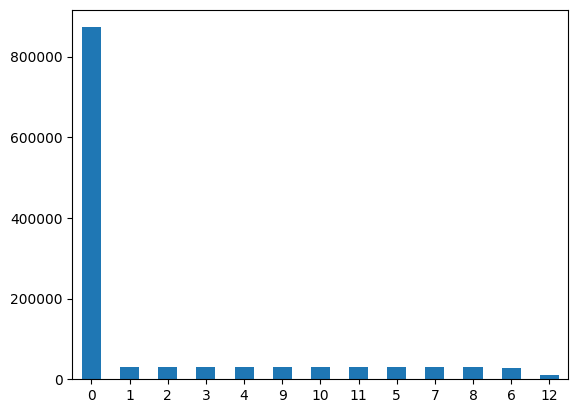

In [17]:
# Visualization of imbalance:
data['activity'].value_counts().plot.bar(rot=0)

In [18]:
# Resampling activity 0 to 30720 observations
data_activity_0 = data[data['activity'] == 0]
data_activity_else = data[data['activity'] != 0]

data_activity_0 = data_activity_0.sample(n=30720, random_state=1)
data = pd.concat([data_activity_0, data_activity_else])

In [19]:
data['activity'].value_counts()

0     30720
1     30720
2     30720
3     30720
4     30720
9     30720
10    30720
11    30720
5     30720
7     29441
8     29337
6     28315
12    10342
Name: activity, dtype: int64

In [20]:
# L1: Standing still (1 min)
# L2: Sitting and relaxing (1 min)
# L3: Lying down (1 min)
# L4: Walking (1 min)
# L5: Climbing stairs (1 min)
# L6: Waist bends forward (20x)
# L7: Frontal elevation of arms (20x)
# L8: Knees bending (crouching) (20x)
# L9: Cycling (1 min)
# L10: Jogging (1 min)
# L11: Running (1 min)
# L12: Jump front & back (20x)
activity_map = {
    1: 'Standing still (1 min)',
    2: 'Sitting and relaxing (1 min)',
    3: 'Lying down (1 min)',
    4: 'Walking (1 min)',
    5: 'Climbing stairs (1 min)',
    6: 'Waist bends forward (20x)',
    7: 'Frontal elevation of arms (20x)',
    8: 'Knees bending (crouching) (20x)',
    9: 'Cycling (1 min)',
    10: 'Jogging (1 min)',
    11: 'Running (1 min)',
    12: 'Jump front & back (20x)'
}

=================================== Standing still (1 min) - acc ===================================


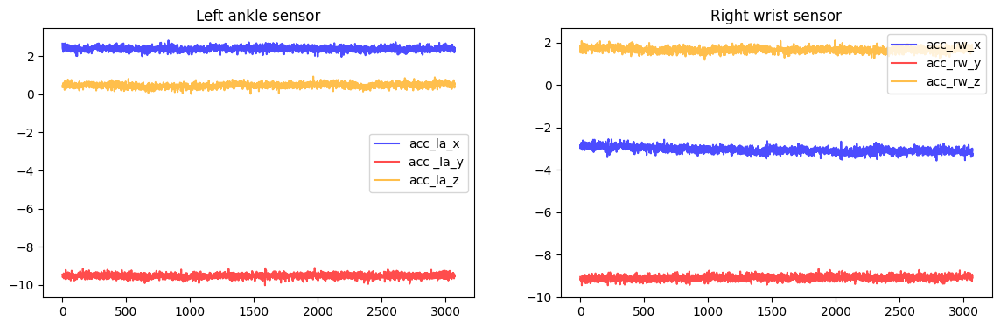

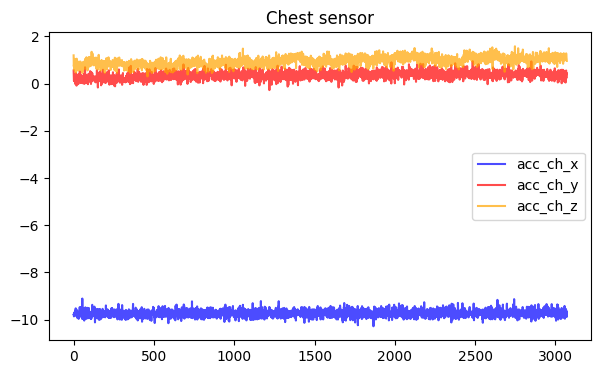

=================================== Standing still (1 min) - gyr ===================================


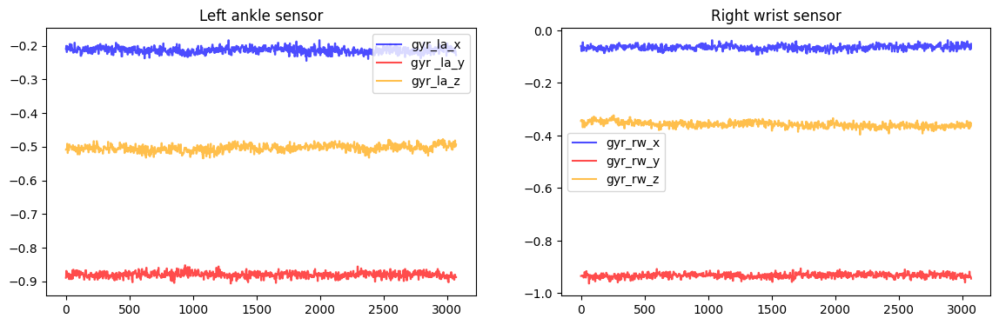

=================================== Standing still (1 min) - mag ===================================


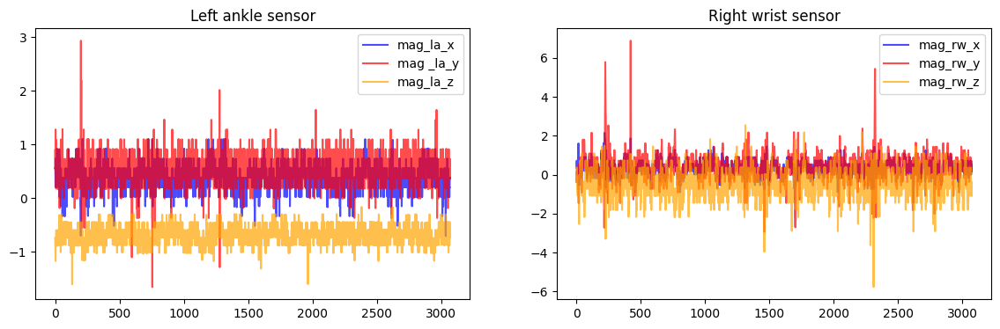

=================================== Sitting and relaxing (1 min) - acc ===================================


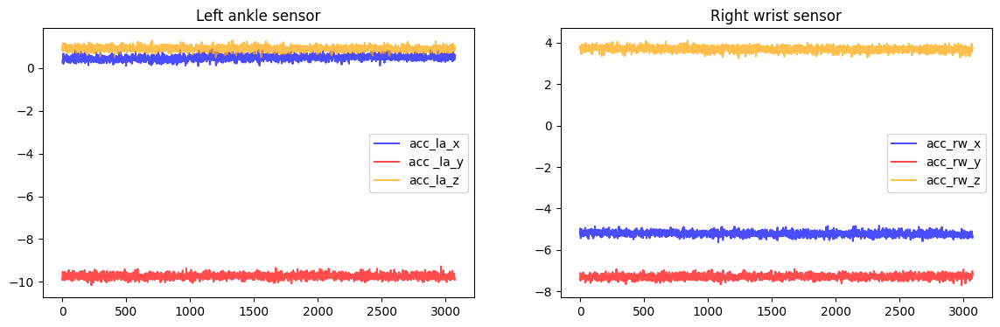

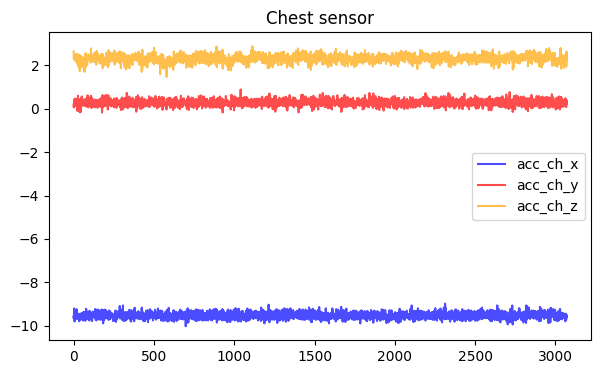

=================================== Sitting and relaxing (1 min) - gyr ===================================


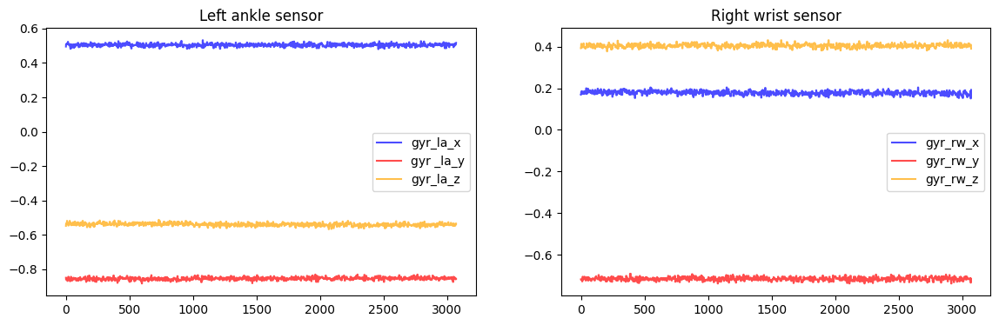

=================================== Sitting and relaxing (1 min) - mag ===================================


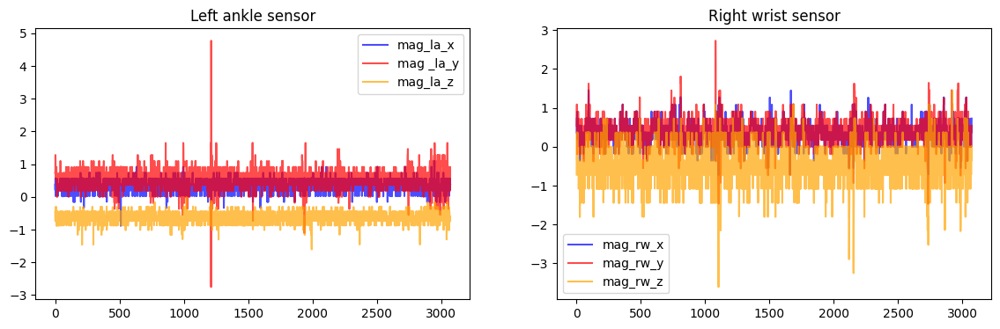

=================================== Lying down (1 min) - acc ===================================


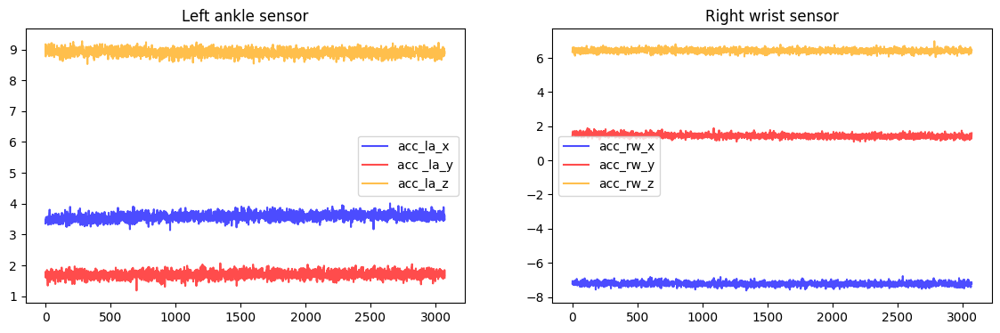

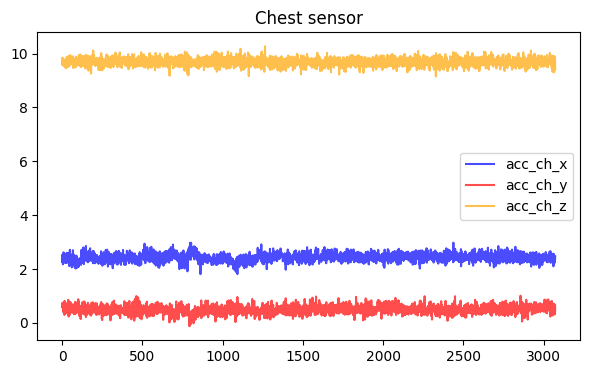

=================================== Lying down (1 min) - gyr ===================================


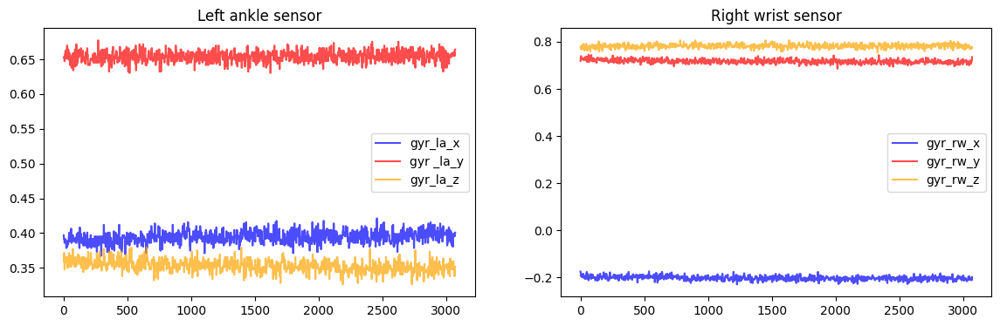

=================================== Lying down (1 min) - mag ===================================


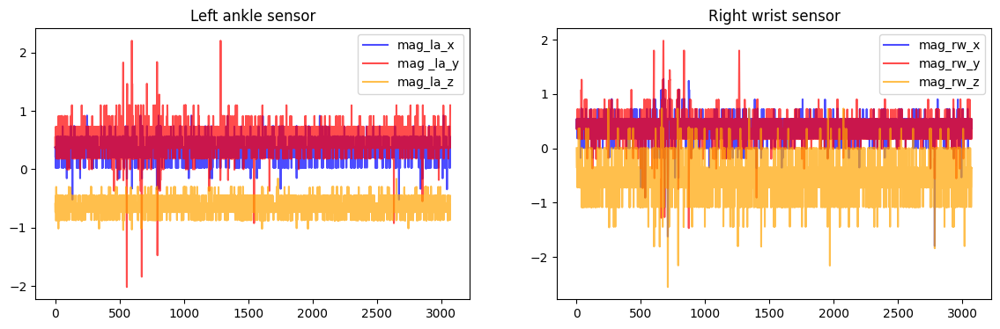

=================================== Walking (1 min) - acc ===================================


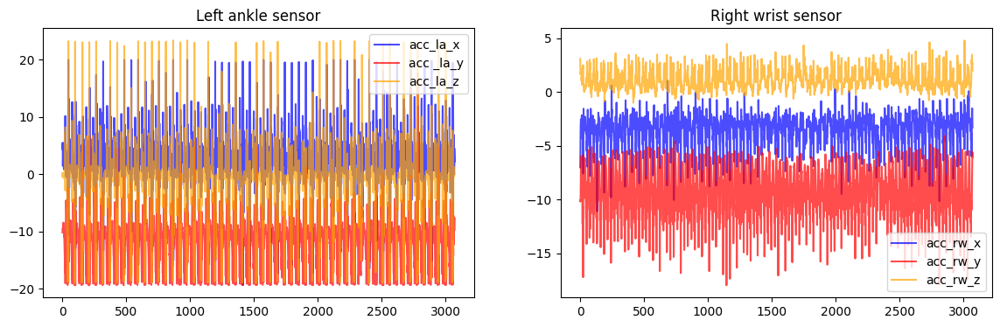

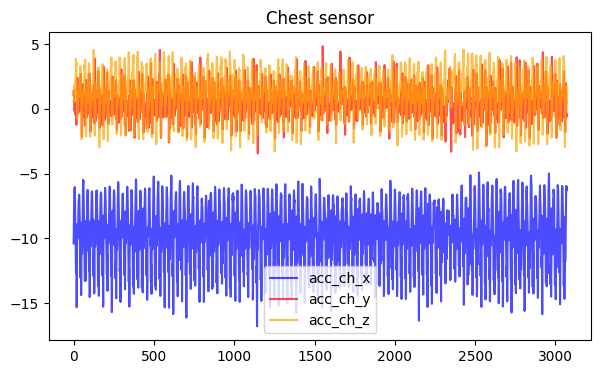

=================================== Walking (1 min) - gyr ===================================


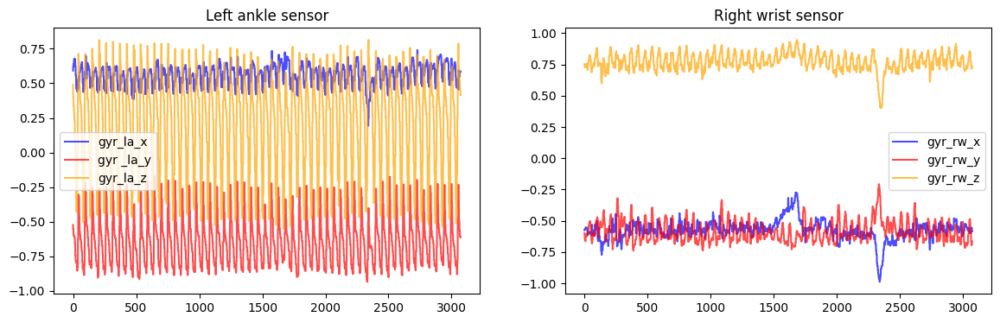

=================================== Walking (1 min) - mag ===================================


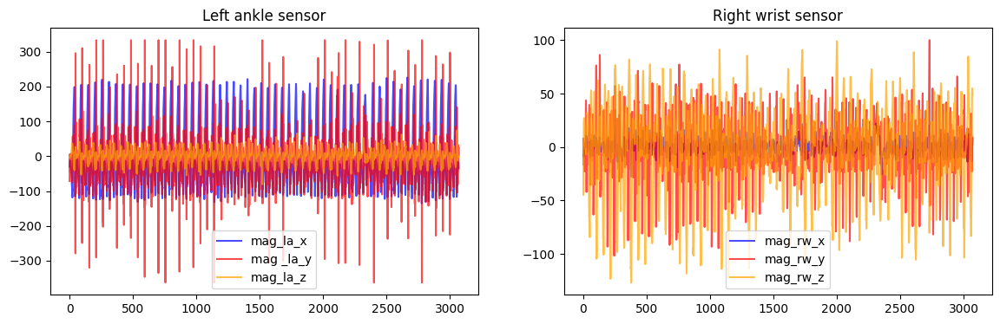

=================================== Climbing stairs (1 min) - acc ===================================


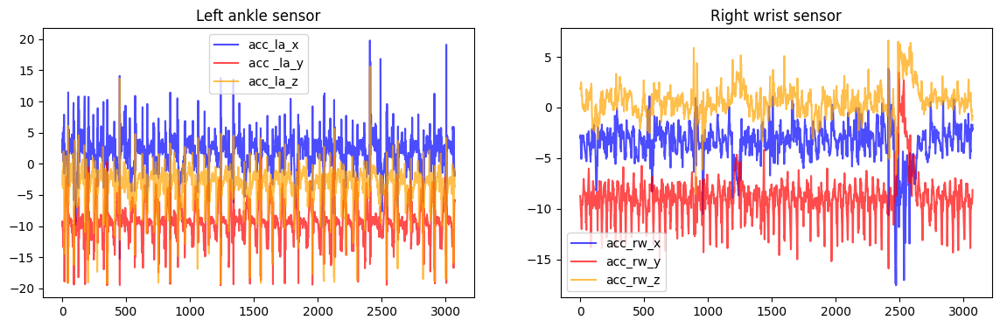

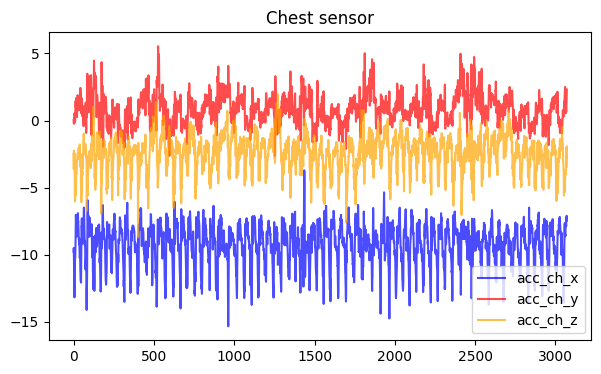

=================================== Climbing stairs (1 min) - gyr ===================================


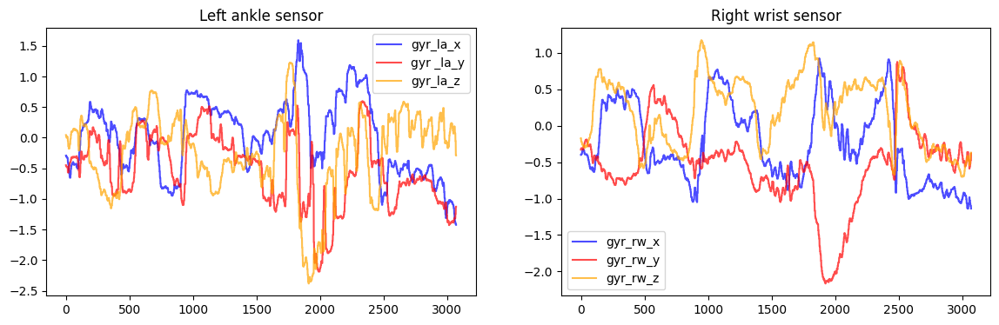

=================================== Climbing stairs (1 min) - mag ===================================


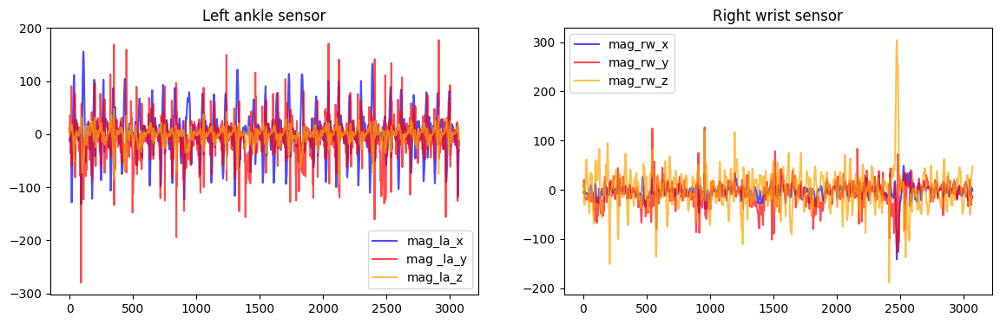

=================================== Waist bends forward (20x) - acc ===================================


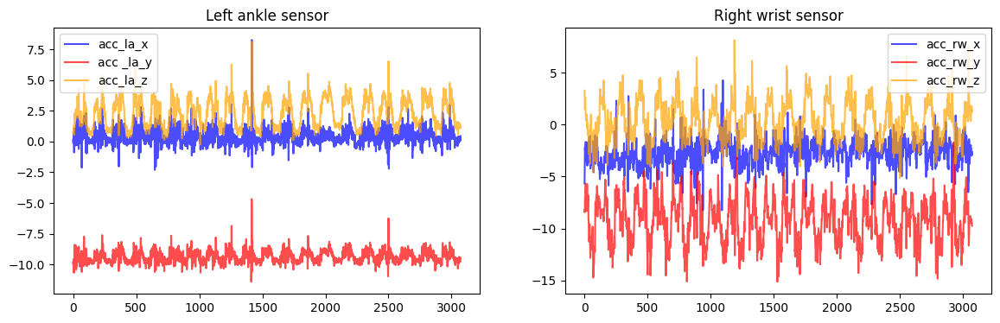

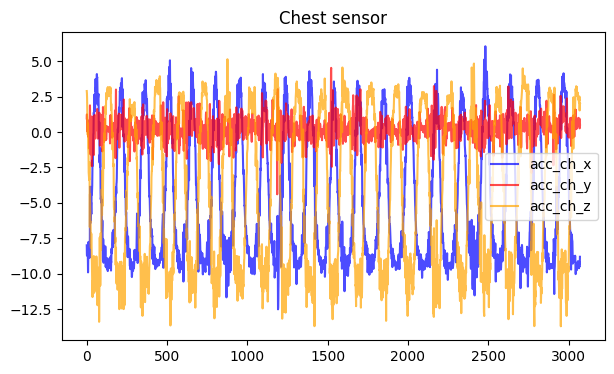

=================================== Waist bends forward (20x) - gyr ===================================


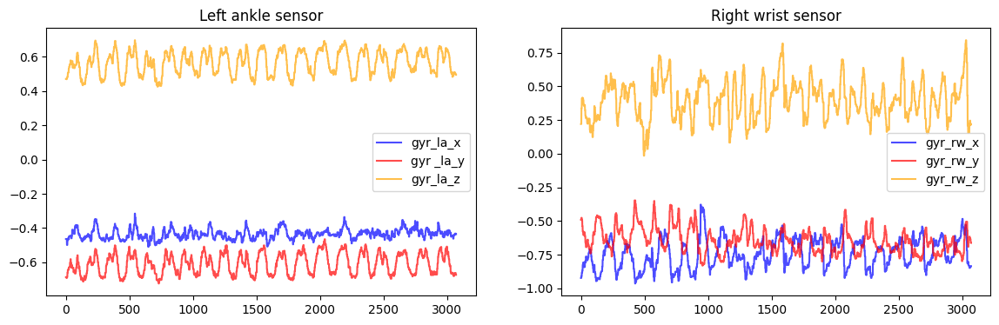

=================================== Waist bends forward (20x) - mag ===================================


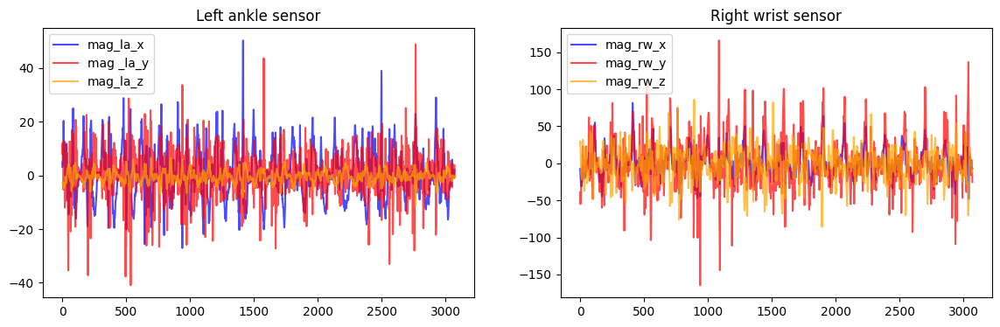

=================================== Frontal elevation of arms (20x) - acc ===================================


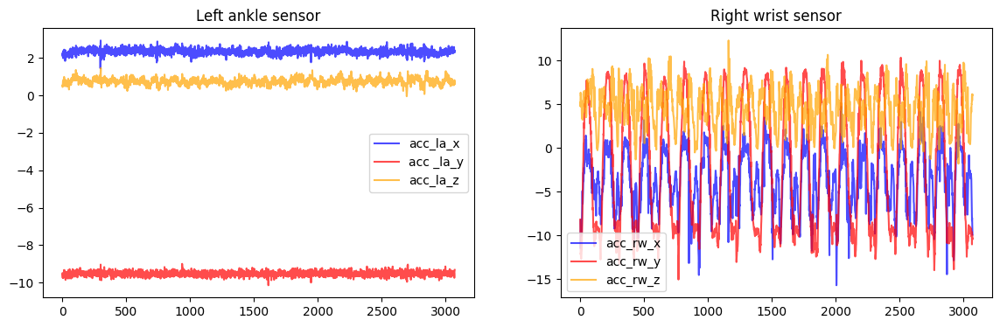

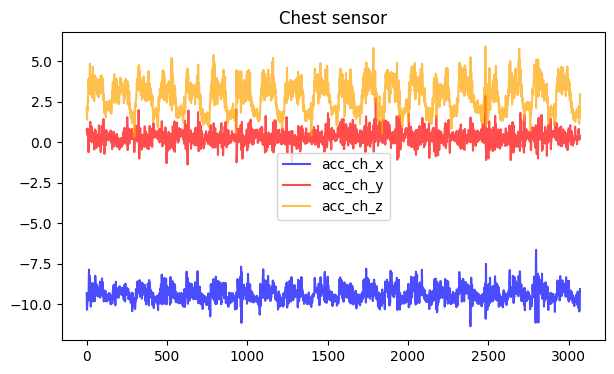

=================================== Frontal elevation of arms (20x) - gyr ===================================


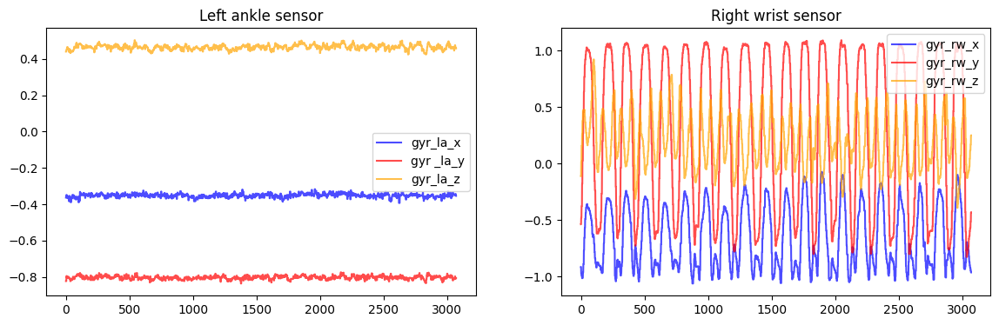

=================================== Frontal elevation of arms (20x) - mag ===================================


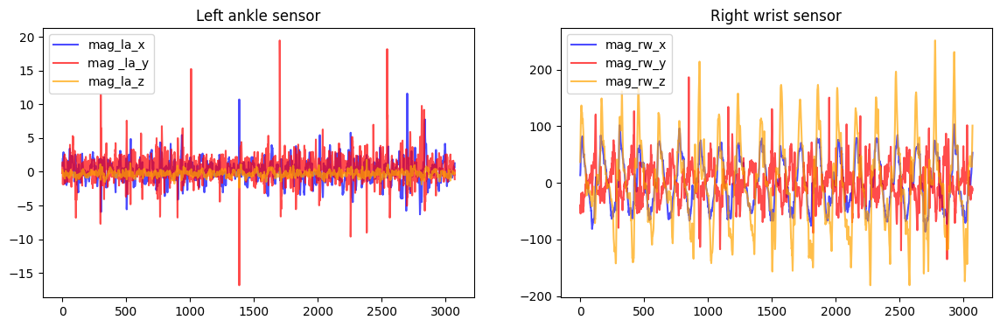

=================================== Knees bending (crouching) (20x) - acc ===================================


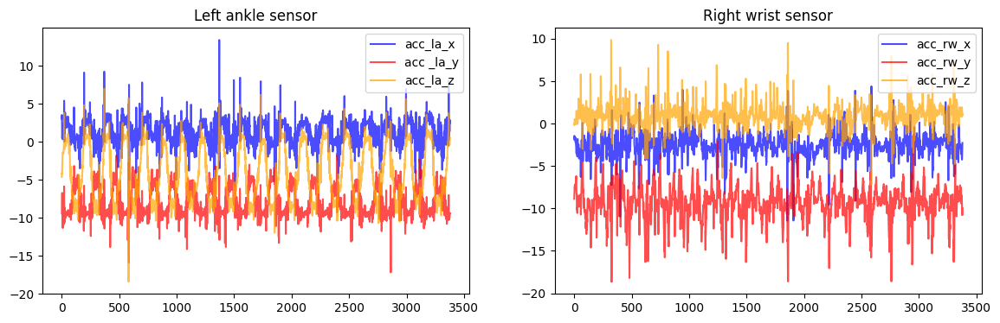

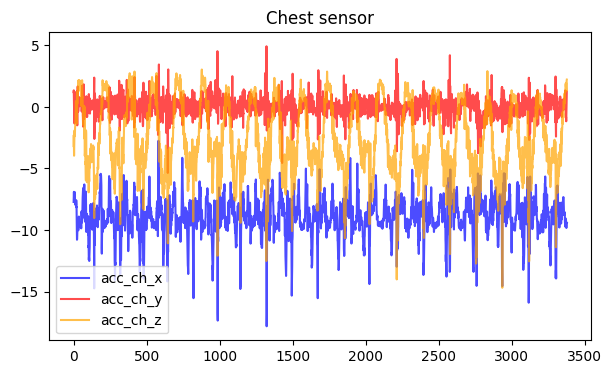

=================================== Knees bending (crouching) (20x) - gyr ===================================


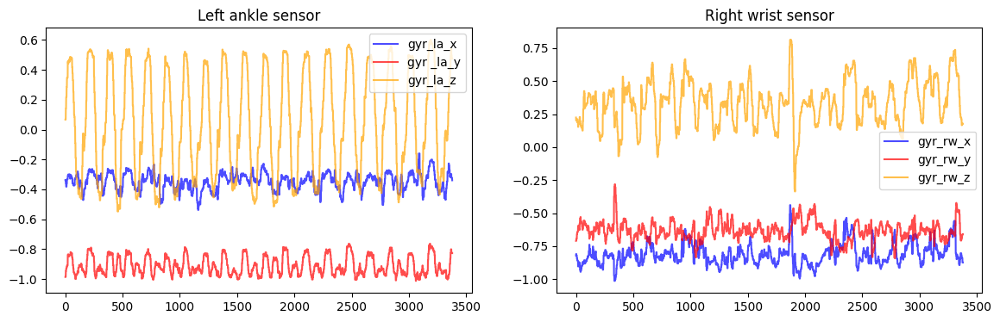

=================================== Knees bending (crouching) (20x) - mag ===================================


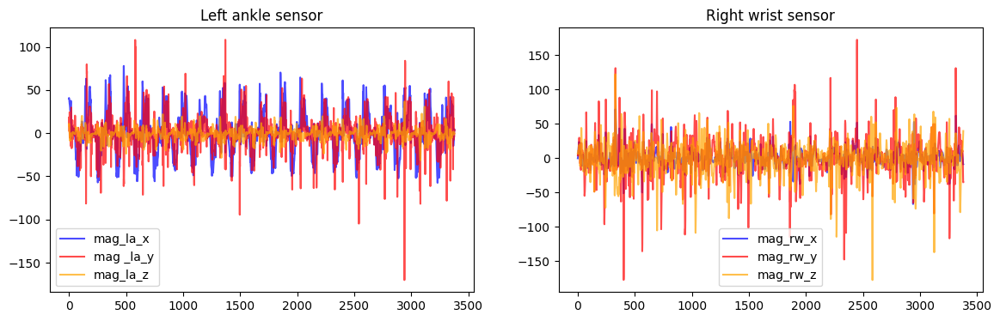

=================================== Cycling (1 min) - acc ===================================


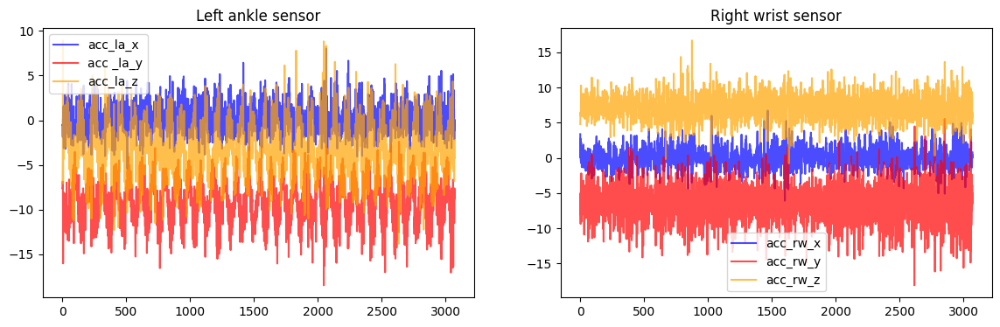

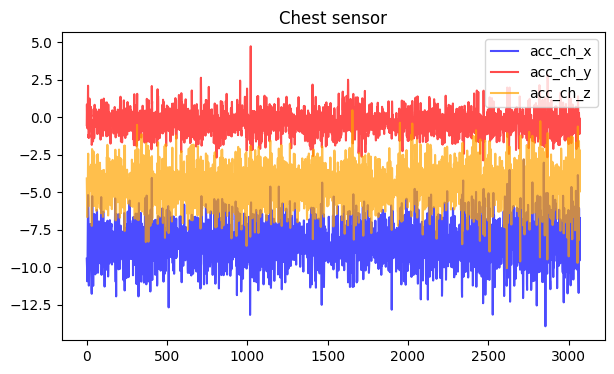

=================================== Cycling (1 min) - gyr ===================================


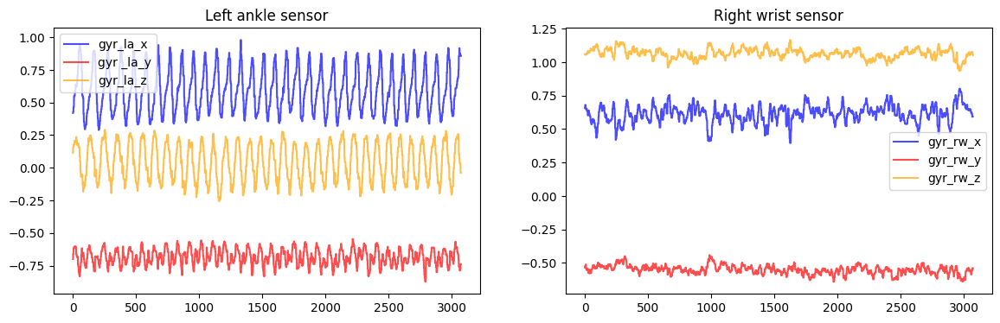

=================================== Cycling (1 min) - mag ===================================


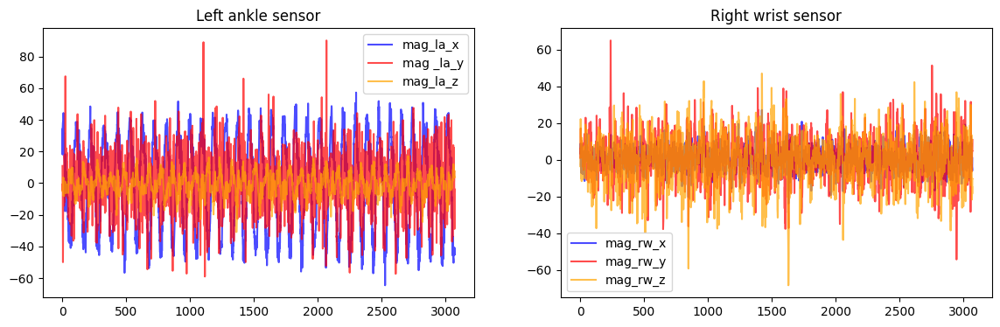

=================================== Jogging (1 min) - acc ===================================


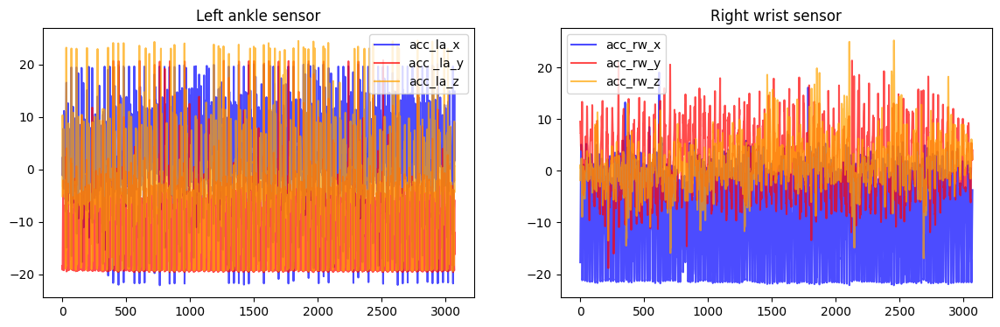

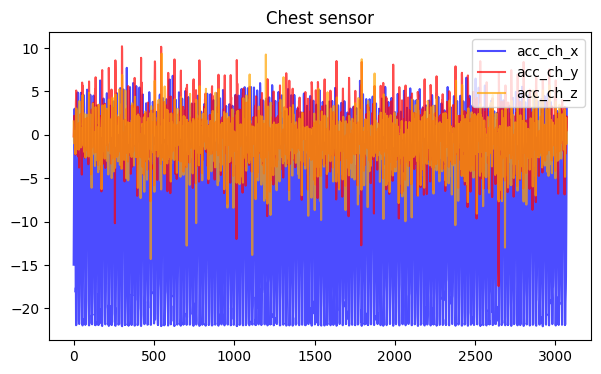

=================================== Jogging (1 min) - gyr ===================================


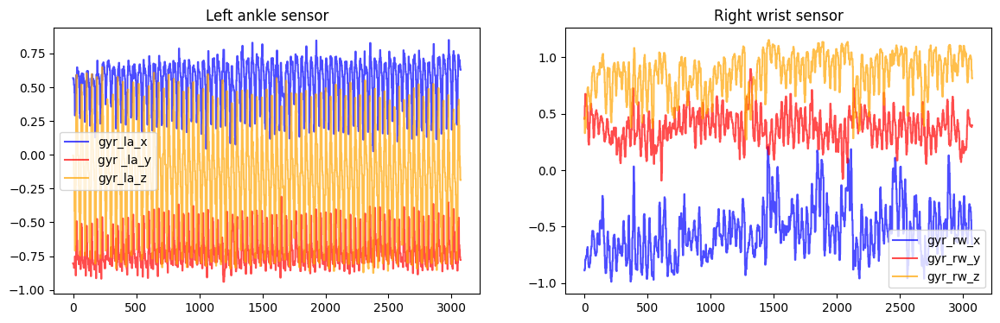

=================================== Jogging (1 min) - mag ===================================


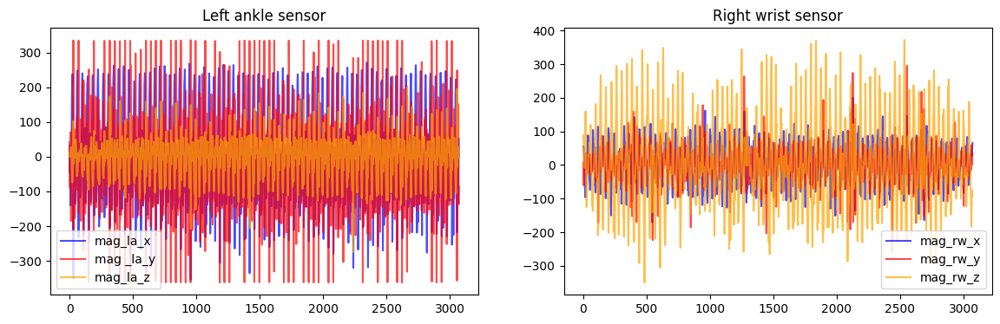

=================================== Running (1 min) - acc ===================================


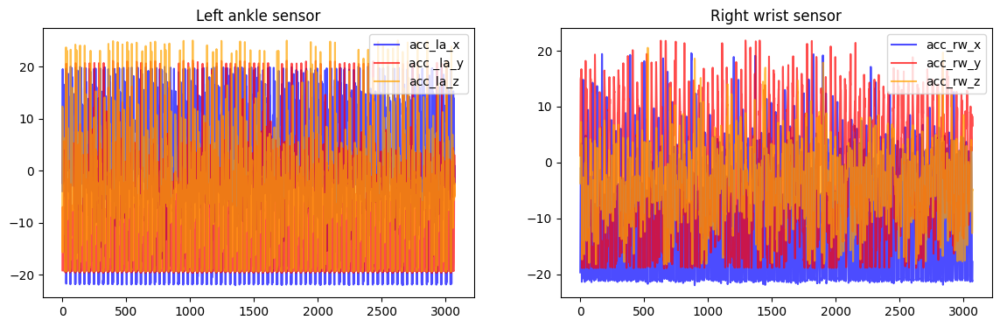

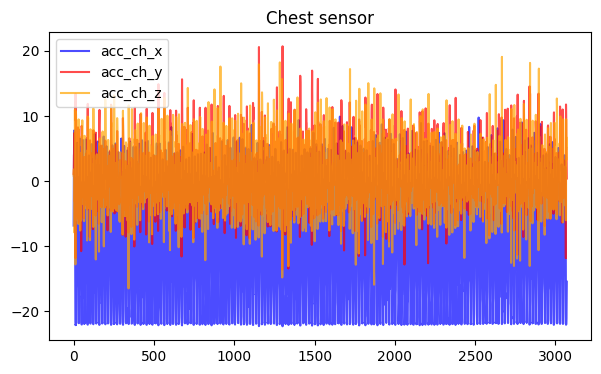

=================================== Running (1 min) - gyr ===================================


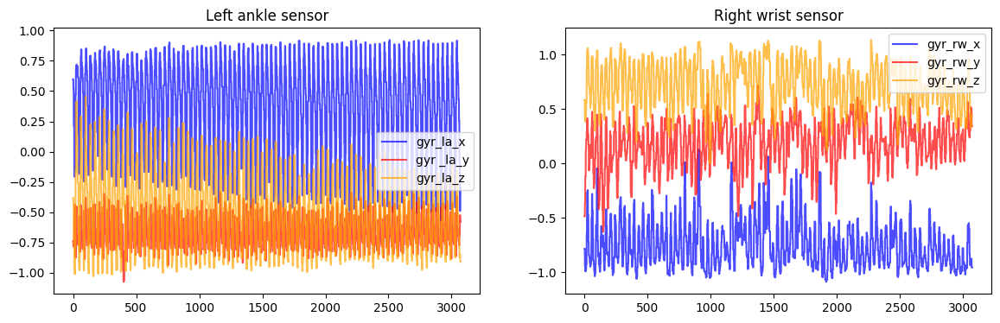

=================================== Running (1 min) - mag ===================================


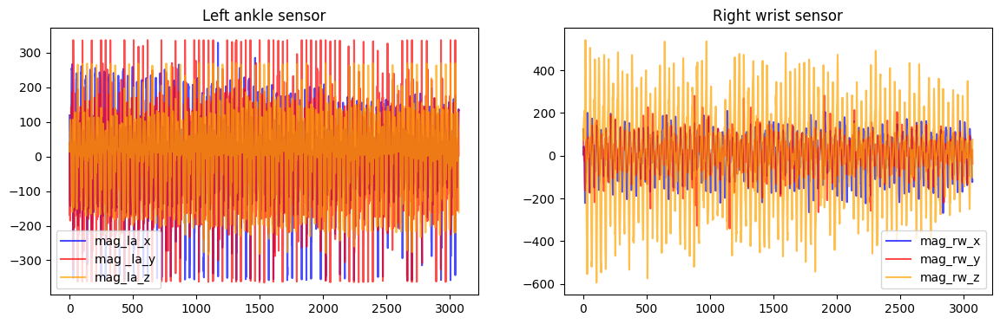

=================================== Jump front & back (20x) - acc ===================================


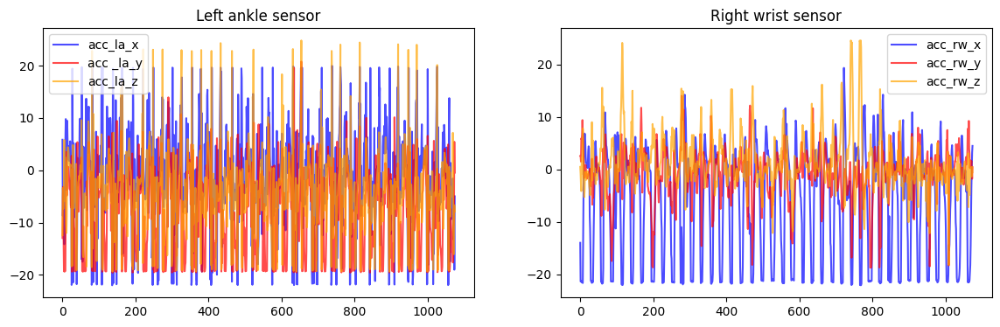

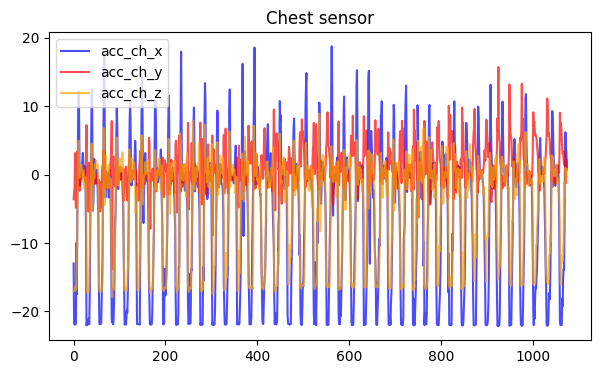

=================================== Jump front & back (20x) - gyr ===================================


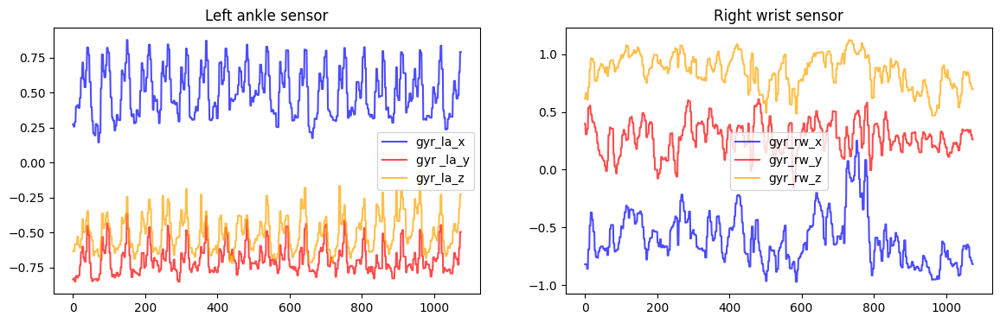

=================================== Jump front & back (20x) - mag ===================================


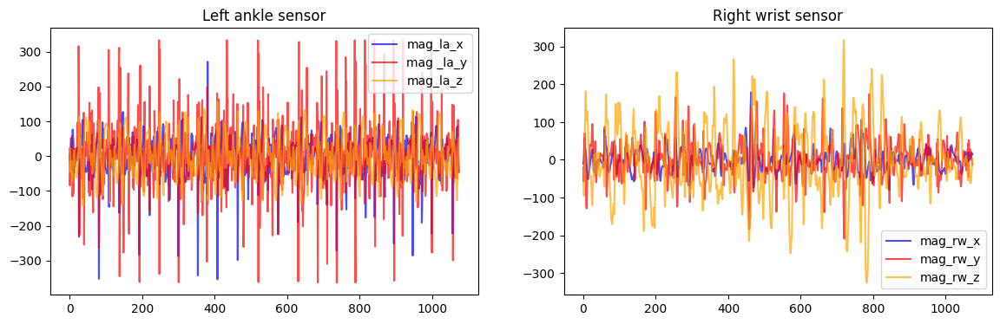

In [21]:
# Create plots for one particular subject performing the activities - using subject 1 since it has the most data
# Each plot section divided by activity and type of reading taken
subject_1 = data[data['subject'] == 'subject1']
readings = ['acc', 'gyr', 'mag']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activity_map[i]} - {r} ===================================')

        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_la_x'], color='blue', alpha=.7, label= r + '_la_x')
        plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_la_y'],color='red', alpha=.7, label= r +' _la_y')
        plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_la_z'],color='orange', alpha=.7, label= r + '_la_z')
        plt.title('Left ankle sensor')
        plt.legend()

        plt.subplot(1,2,2)
        plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_rw_x'], color='blue', alpha=.7, label= r + '_rw_x')
        plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_rw_y'],color='red', alpha=.7, label= r + '_rw_y')
        plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_rw_z'],color='orange', alpha=.7, label= r + '_rw_z')
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

        # No magnetometer or gyroscope data for the chest sensor
        if r == 'acc':
            plt.figure(figsize=(7,4))
            plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_ch_x'], color='blue', alpha=.7, label= r + '_ch_x')
            plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_ch_y'],color='red', alpha=.7, label= r + '_ch_y')
            plt.plot(subject_1[subject_1['activity']==i].reset_index(drop=True)[r + '_ch_z'],color='orange', alpha=.7, label= r + '_ch_z')
            plt.title('Chest sensor')
            plt.legend()
            plt.show()

=================================== Standing still (1 min) - acc ===================================


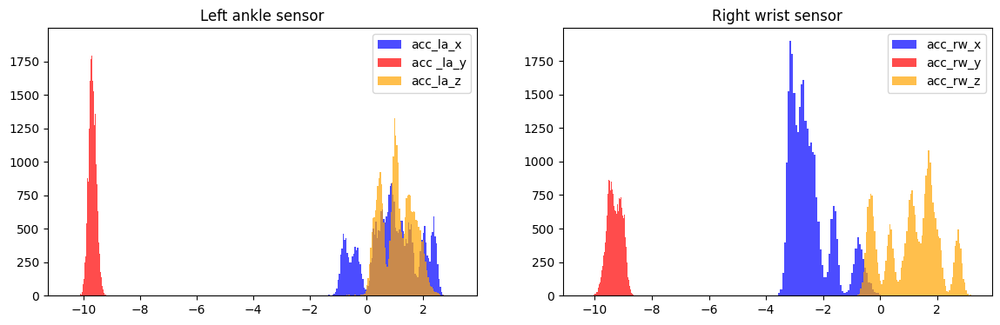

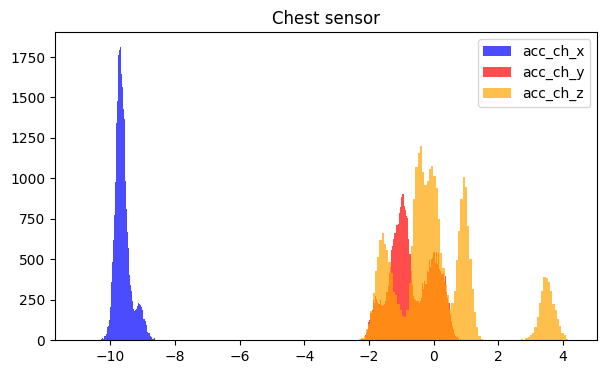

=================================== Standing still (1 min) - gyr ===================================


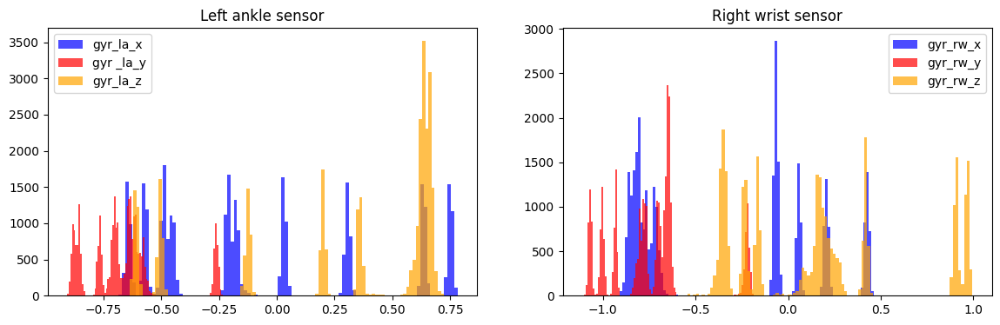

=================================== Standing still (1 min) - mag ===================================


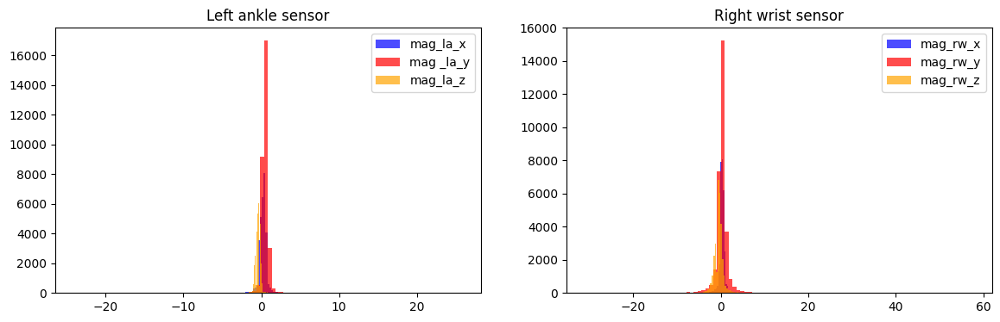

=================================== Sitting and relaxing (1 min) - acc ===================================


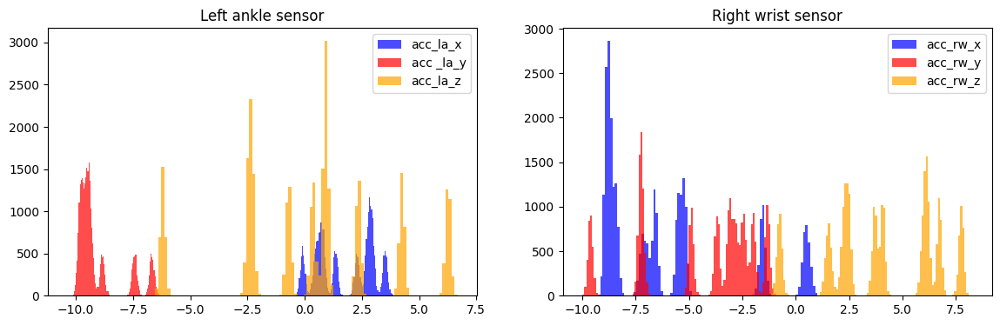

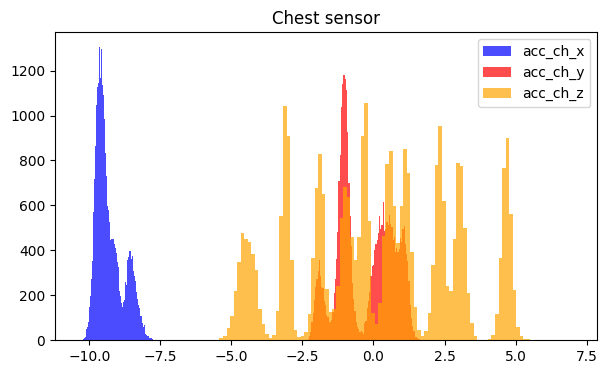

=================================== Sitting and relaxing (1 min) - gyr ===================================


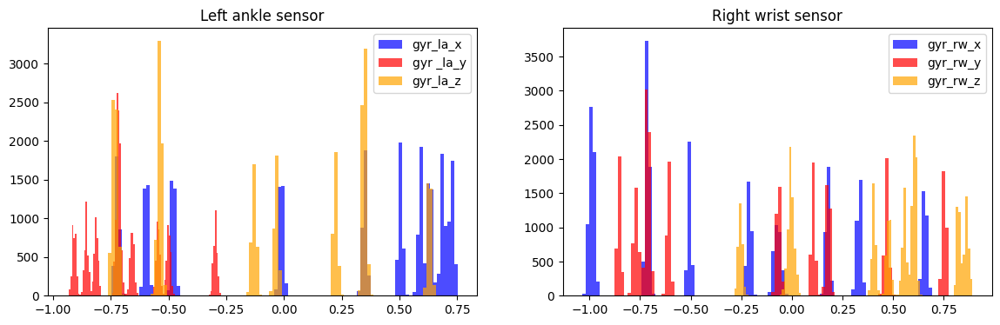

=================================== Sitting and relaxing (1 min) - mag ===================================


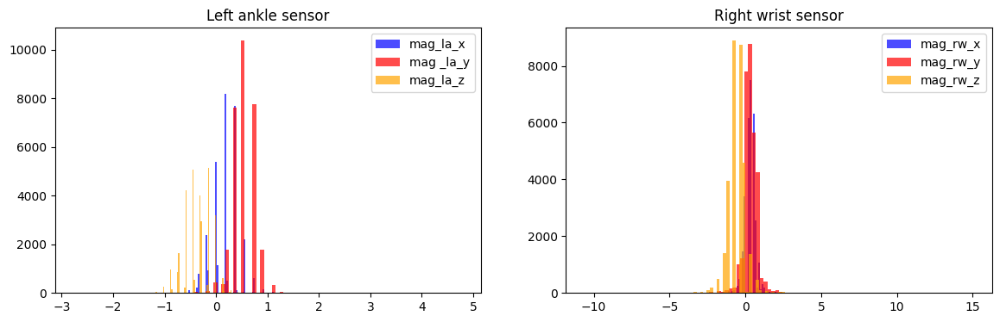

=================================== Lying down (1 min) - acc ===================================


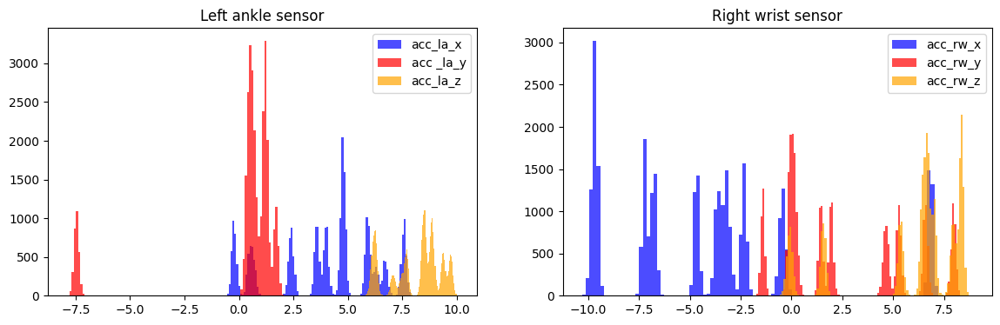

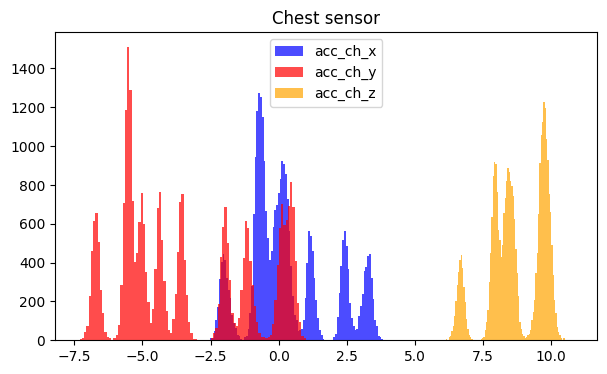

=================================== Lying down (1 min) - gyr ===================================


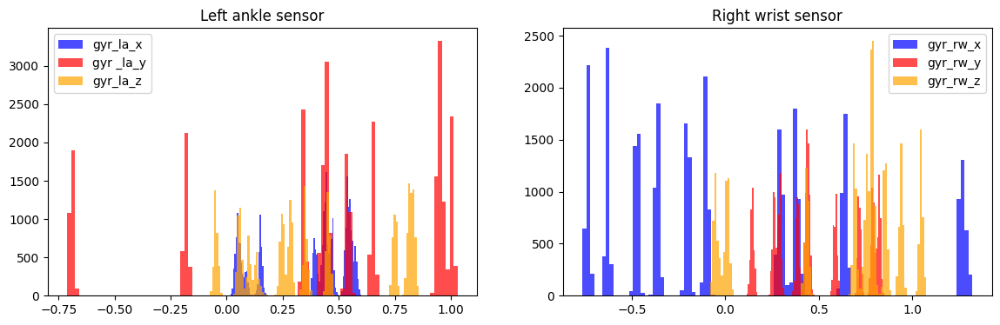

=================================== Lying down (1 min) - mag ===================================


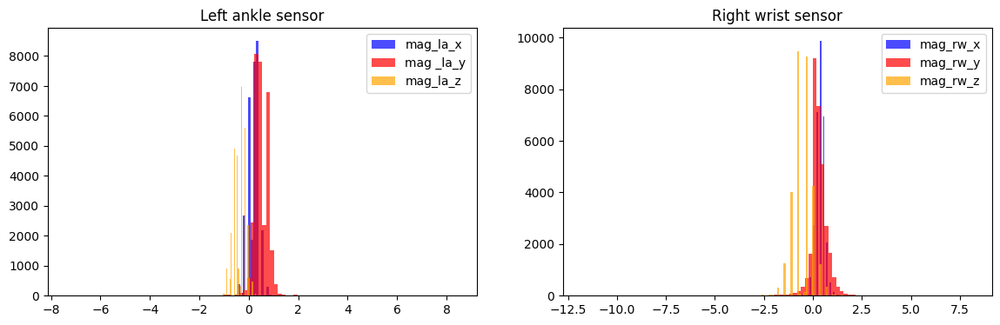

=================================== Walking (1 min) - acc ===================================


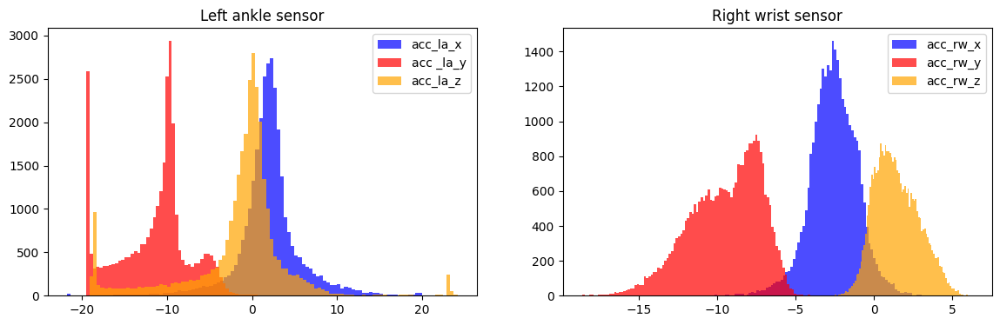

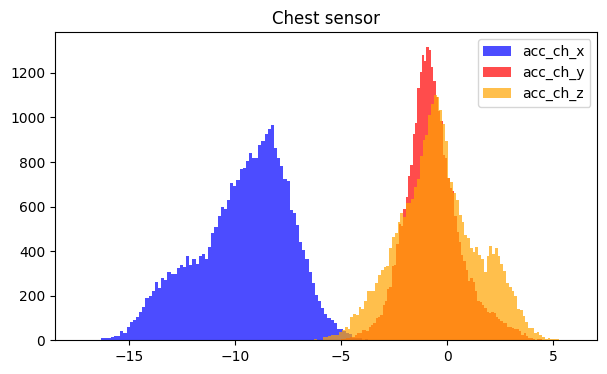

=================================== Walking (1 min) - gyr ===================================


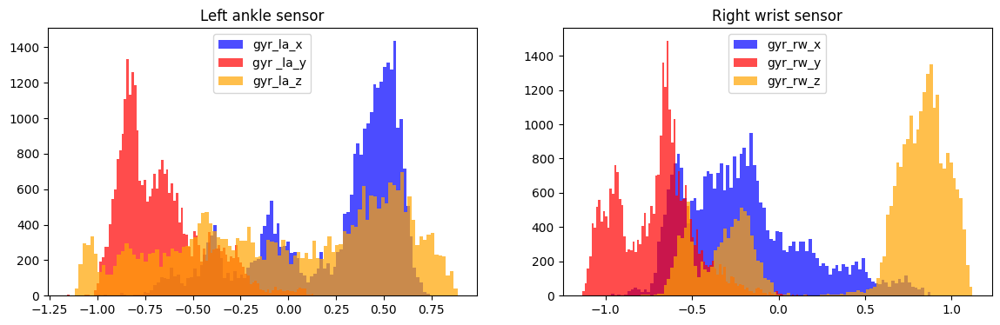

=================================== Walking (1 min) - mag ===================================


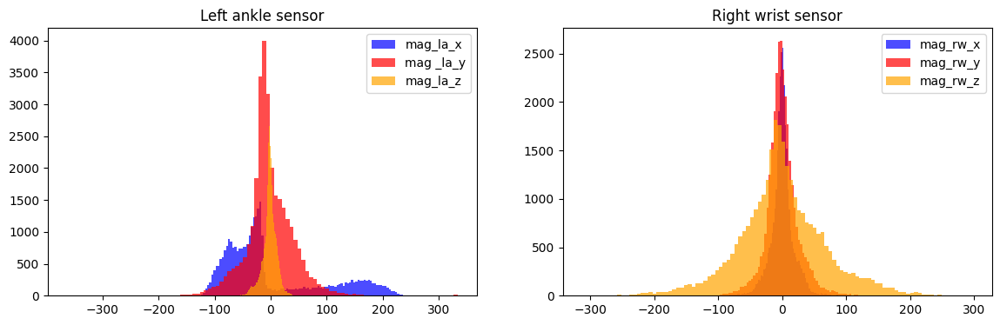

=================================== Climbing stairs (1 min) - acc ===================================


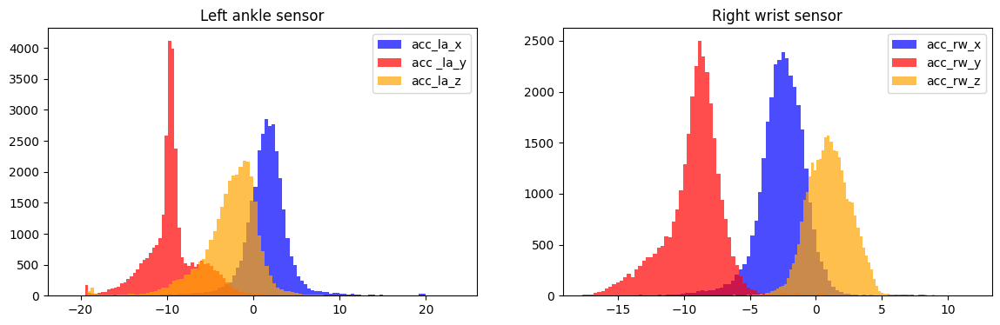

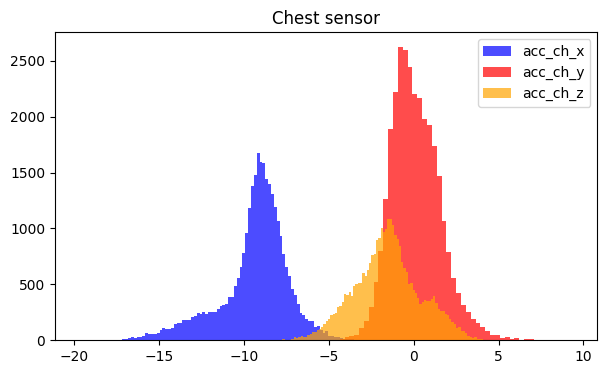

=================================== Climbing stairs (1 min) - gyr ===================================


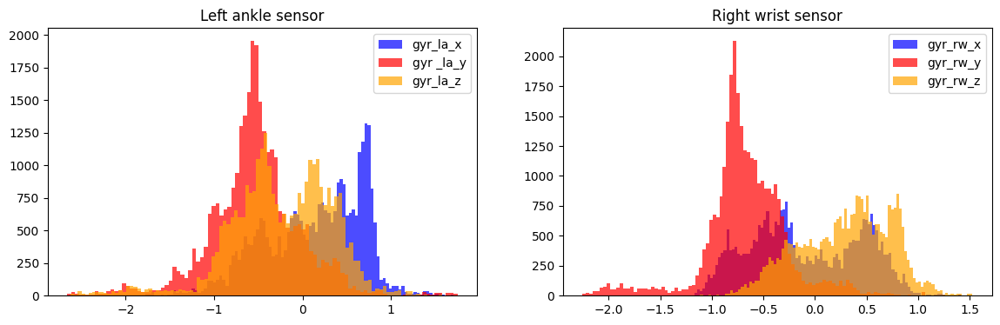

=================================== Climbing stairs (1 min) - mag ===================================


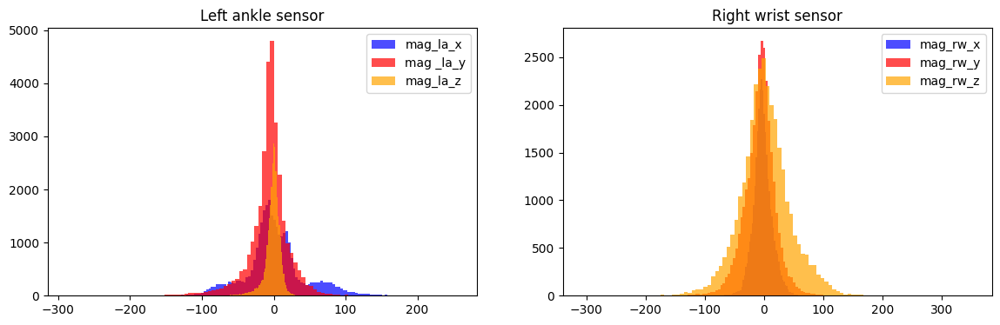

=================================== Waist bends forward (20x) - acc ===================================


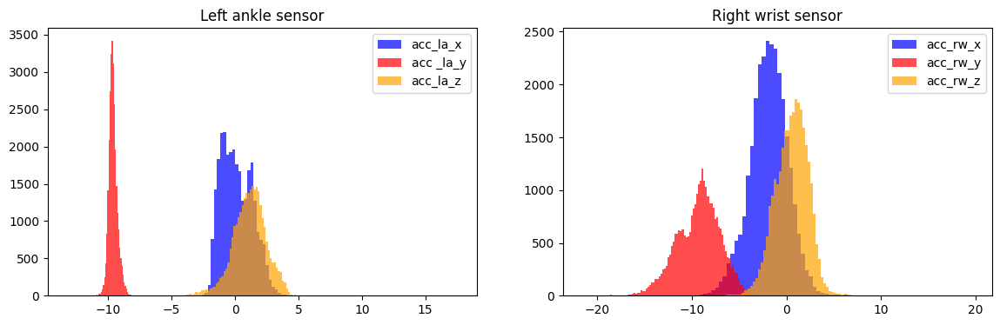

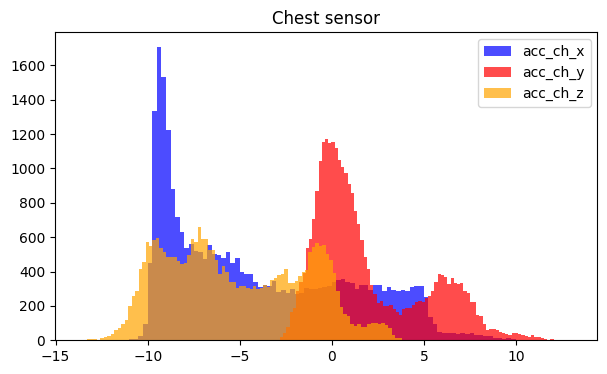

=================================== Waist bends forward (20x) - gyr ===================================


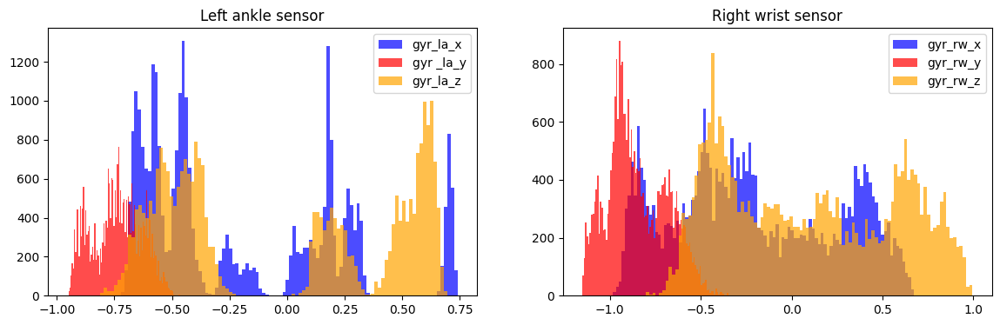

=================================== Waist bends forward (20x) - mag ===================================


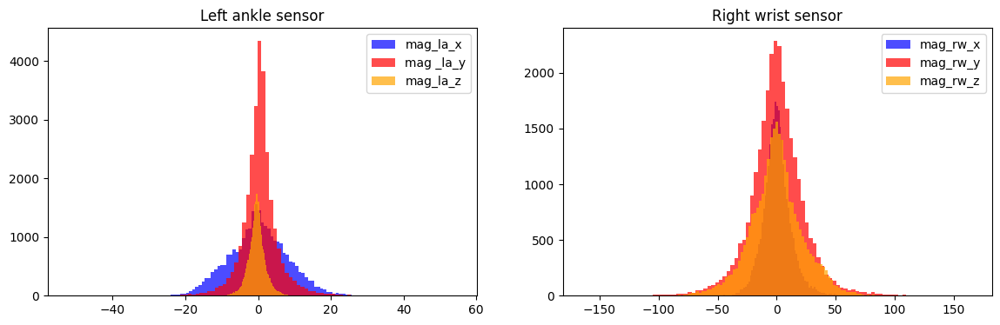

=================================== Frontal elevation of arms (20x) - acc ===================================


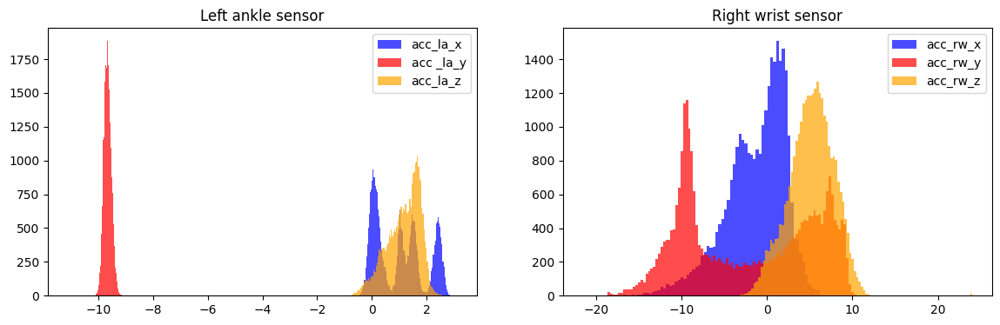

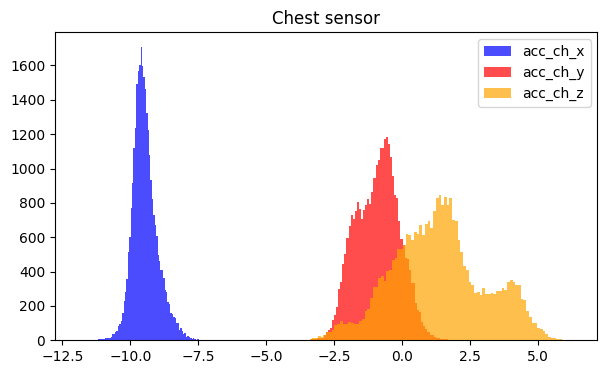

=================================== Frontal elevation of arms (20x) - gyr ===================================


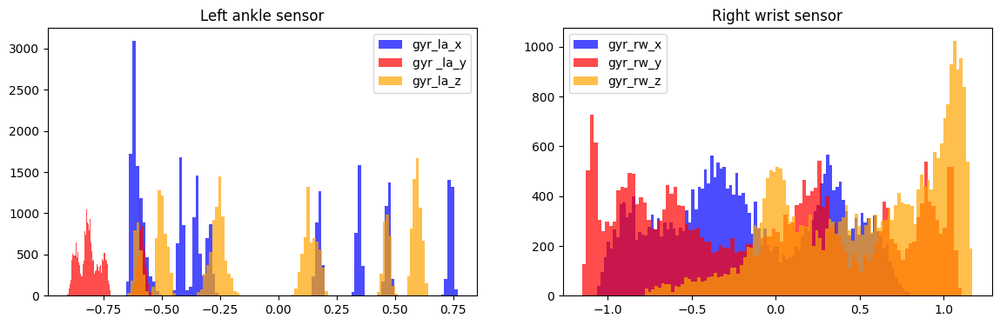

=================================== Frontal elevation of arms (20x) - mag ===================================


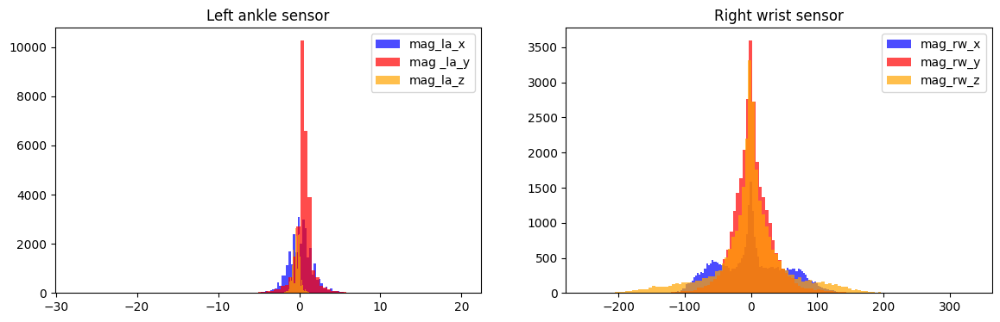

=================================== Knees bending (crouching) (20x) - acc ===================================


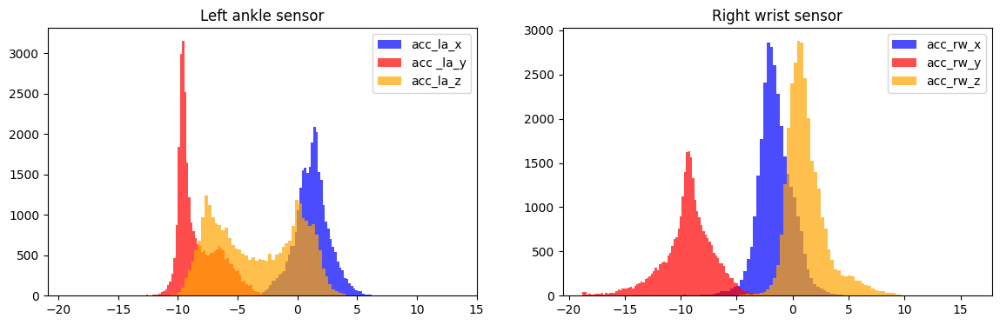

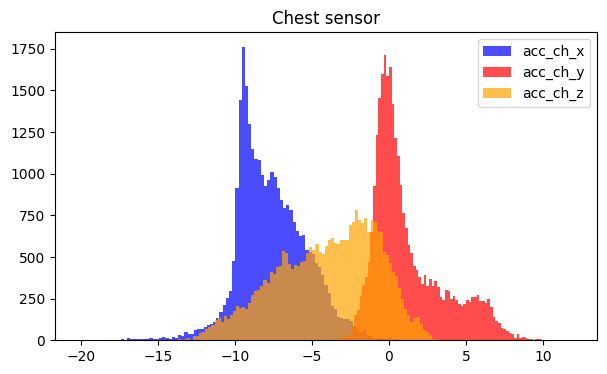

=================================== Knees bending (crouching) (20x) - gyr ===================================


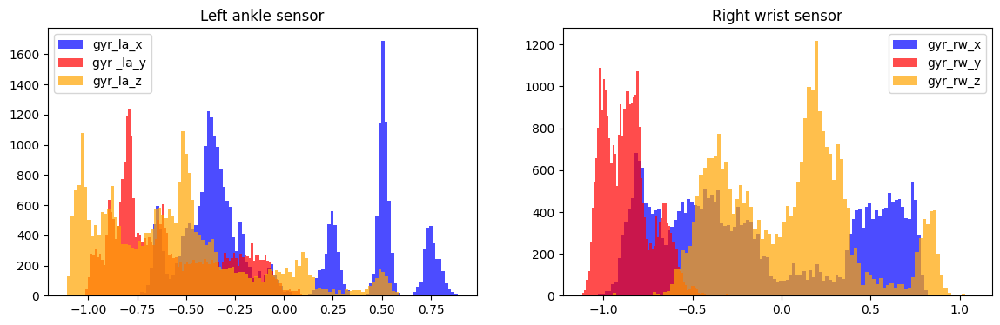

=================================== Knees bending (crouching) (20x) - mag ===================================


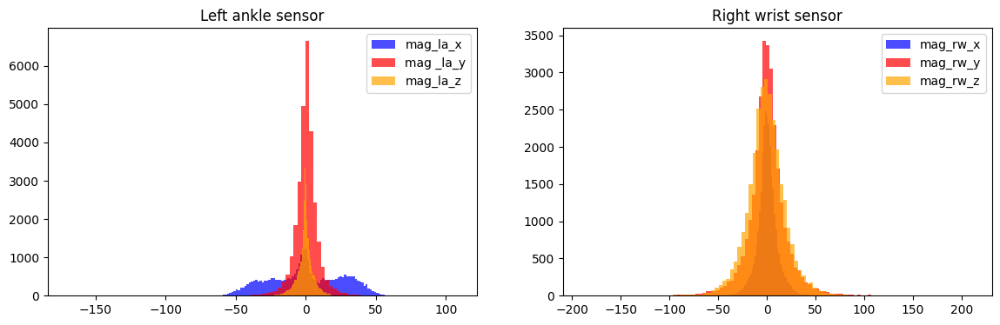

=================================== Cycling (1 min) - acc ===================================


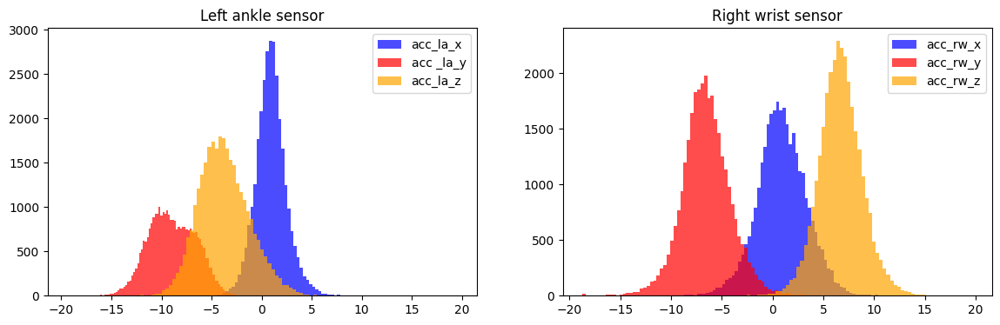

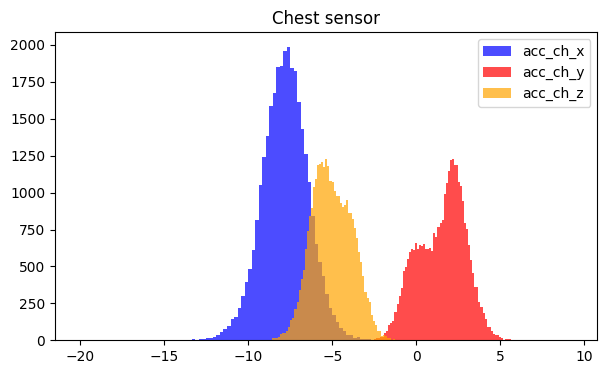

=================================== Cycling (1 min) - gyr ===================================


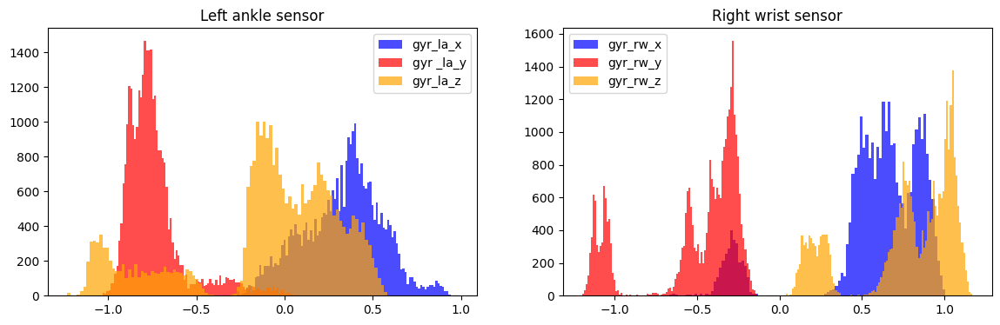

=================================== Cycling (1 min) - mag ===================================


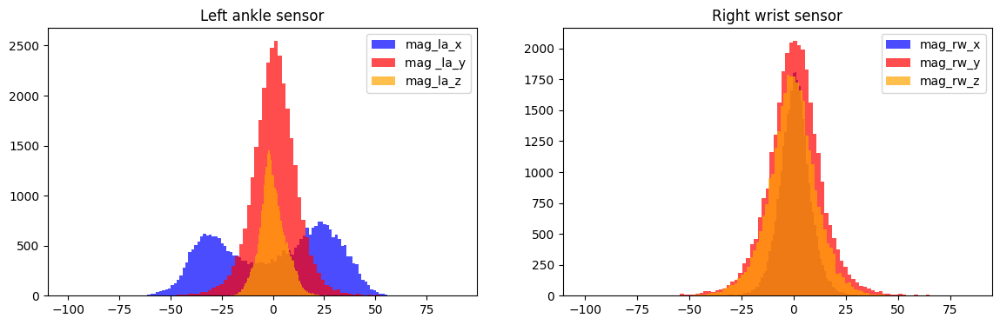

=================================== Jogging (1 min) - acc ===================================


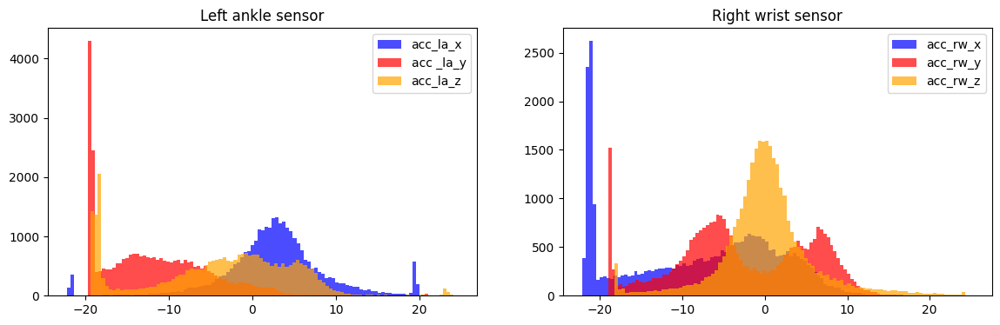

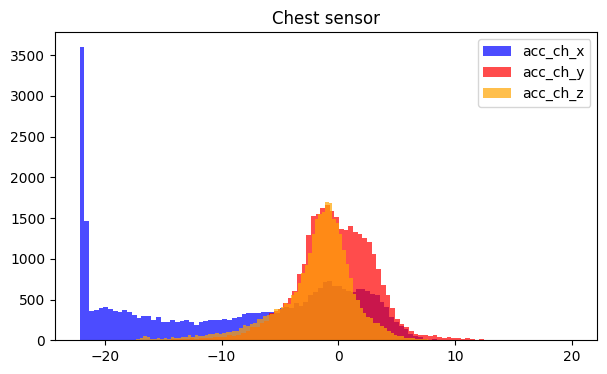

=================================== Jogging (1 min) - gyr ===================================


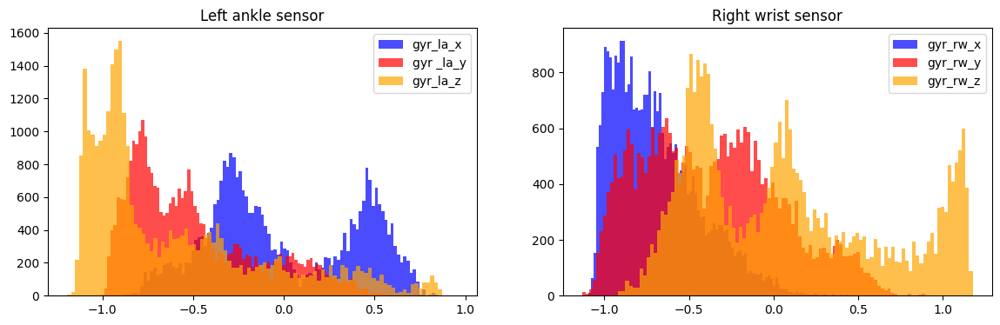

=================================== Jogging (1 min) - mag ===================================


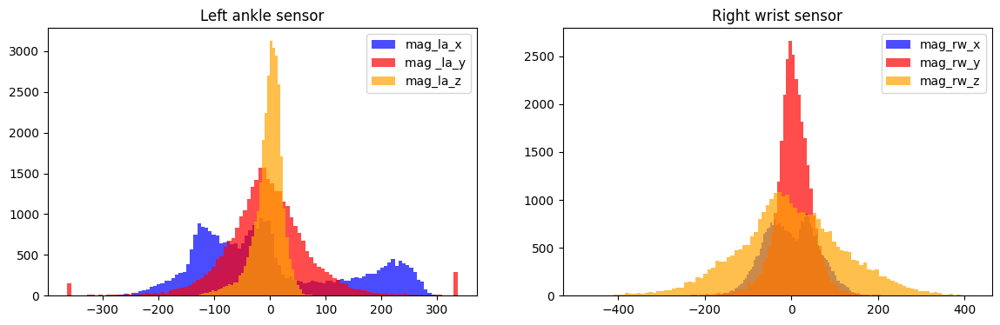

=================================== Running (1 min) - acc ===================================


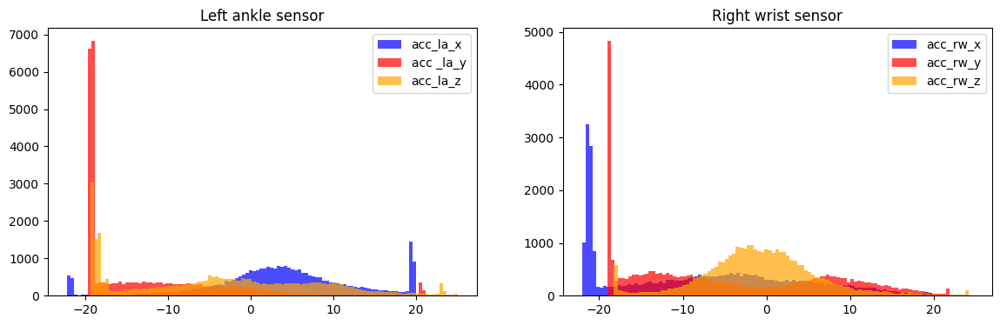

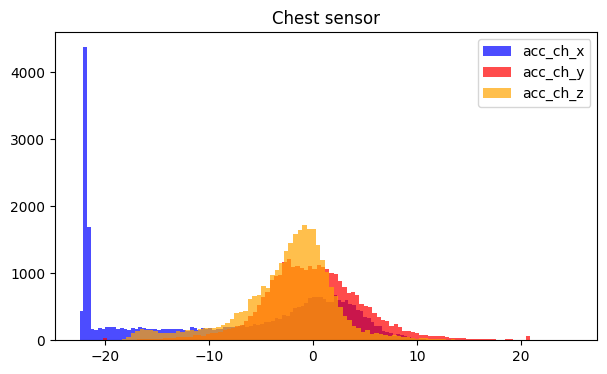

=================================== Running (1 min) - gyr ===================================


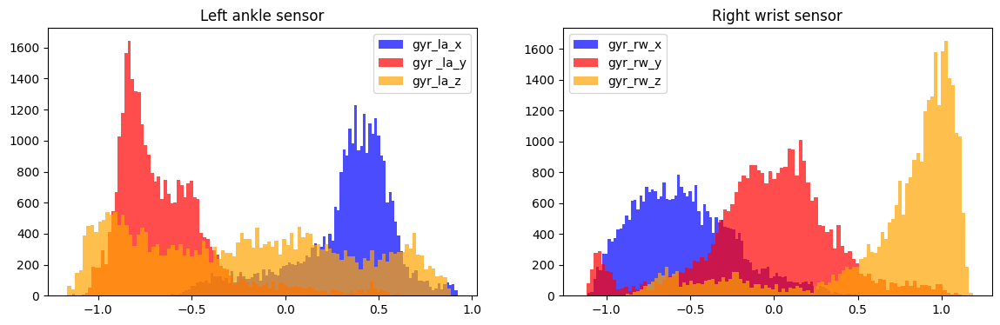

=================================== Running (1 min) - mag ===================================


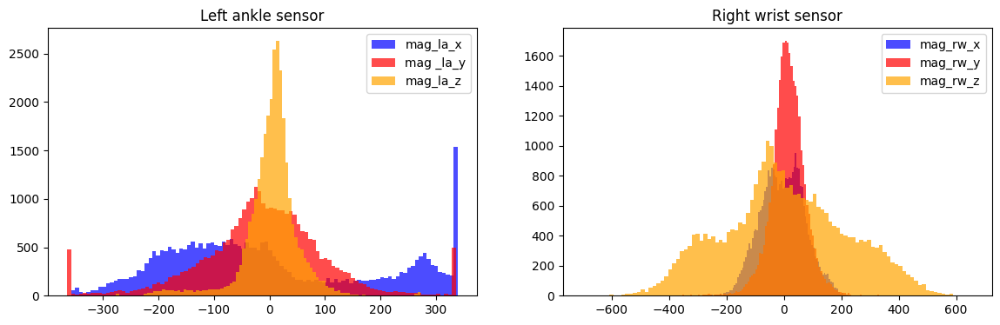

=================================== Jump front & back (20x) - acc ===================================


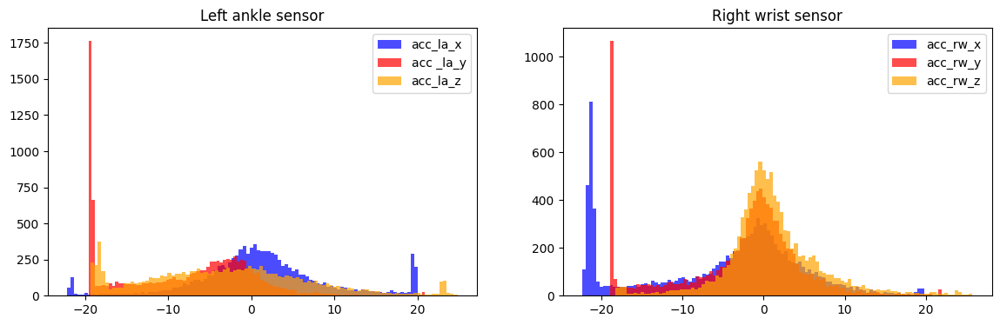

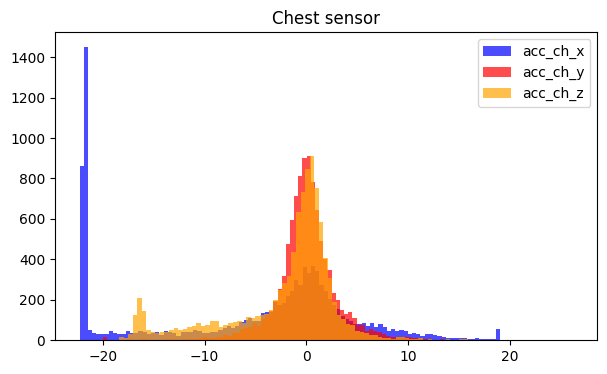

=================================== Jump front & back (20x) - gyr ===================================


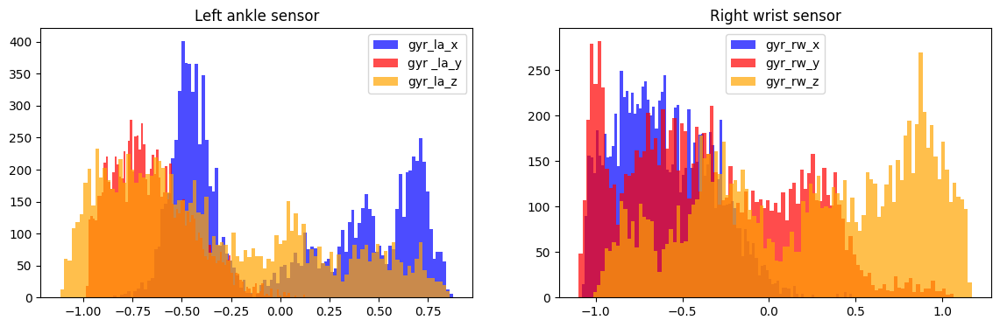

=================================== Jump front & back (20x) - mag ===================================


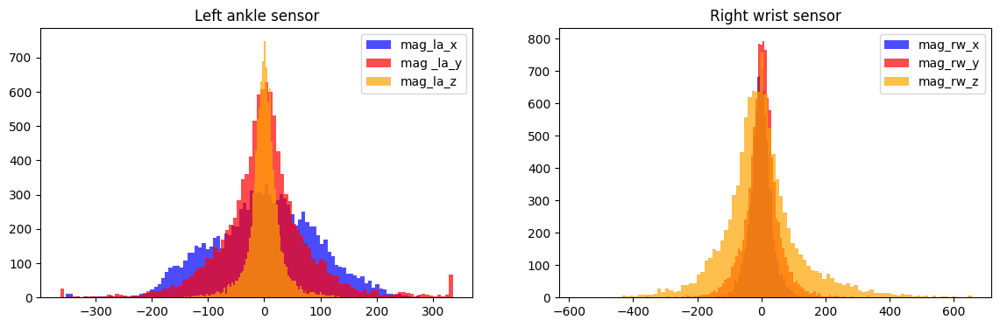

In [22]:
# Distribution plots for each activity and sensor
readings = ['acc', 'gyr', 'mag']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activity_map[i]} - {r} ===================================')

        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_la_x'], color='blue', alpha=.7, label= r + '_la_x', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_la_y'],color='red', alpha=.7, label= r +' _la_y', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_la_z'],color='orange', alpha=.7, label= r + '_la_z', bins=100)
        plt.title('Left ankle sensor')
        plt.legend()

        plt.subplot(1,2,2)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_rw_x'], color='blue', alpha=.7, label= r + '_rw_x', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_rw_y'],color='red', alpha=.7, label= r + '_rw_y', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_rw_z'],color='orange', alpha=.7, label= r + '_rw_z', bins=100)
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

        # No magnetometer or gyroscope data for the chest sensor
        if r == 'acc':
            plt.figure(figsize=(7,4))
            plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_ch_x'], color='blue', alpha=.7, label= r + '_ch_x', bins=100)
            plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_ch_y'],color='red', alpha=.7, label= r + '_ch_y', bins=100)
            plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_ch_z'],color='orange', alpha=.7, label= r + '_ch_z', bins=100)
            plt.title('Chest sensor')
            plt.legend()
            plt.show()

In [23]:
# Based on poor model computation performance with the full (balanced) data set, it may be a good idea to find
# an acceptable undersampled dataset that covers a similar distribution to the full data set.
data['activity'].value_counts()

0     30720
1     30720
2     30720
3     30720
4     30720
9     30720
10    30720
11    30720
5     30720
7     29441
8     29337
6     28315
12    10342
Name: activity, dtype: int64

In [24]:
# This function will take the same number of observations from each activity category
def resample_data(data, num_observations):
    resampled_data = pd.DataFrame()
    for i in range(0, 13):
        data_activity_i = data[data['activity'] == i]
        data_activity_i = data_activity_i.sample(n=num_observations, random_state=1)
        resampled_data = pd.concat([data_activity_i, resampled_data])
    return resampled_data

In [25]:
resampled_data = resample_data(data, 3000)
resampled_data.head()

,acc_ch_x,acc_ch_y,acc_ch_z,acc_la_x,acc_la_y,acc_la_z,gyr_la_x,gyr_la_y,gyr_la_z,mag_la_x,...,acc_rw_y,acc_rw_z,gyr_rw_x,gyr_rw_y,gyr_rw_z,mag_rw_x,mag_rw_y,mag_rw_z,activity,subject
850837,-21.78300,-3.794900,-7.9521,3.9643,-19.2610,-0.38175,0.20779,-0.96248,-0.064833,25.358,...,-18.57200,4.81100,-0.38039,-0.624230,0.84914,5.4721,62.4750,46.0550,12,subject7
716654,-2.15530,0.190500,1.0171,3.1057,-4.7165,-3.32980,0.39147,-0.63977,0.526520,-112.910,...,0.21375,-2.62470,-0.88824,-0.149900,0.61422,39.9060,22.9280,-62.9690,12,subject6
275149,7.01840,0.087807,-5.8026,3.8237,3.6411,-18.07100,-0.27644,-0.70169,-0.778000,35.207,...,-1.60260,-0.25721,-1.00200,-0.316220,0.31250,-27.5170,67.0070,-5.5525,12,subject2
113762,0.81034,-0.618230,-2.0135,-21.3150,-19.1280,22.81000,0.73284,-0.60225,-0.227900,-342.760,...,1.40960,1.95590,-0.61373,0.377820,0.84698,-13.3470,-6.1104,-25.4770,12,subject1
528405,-21.75600,-5.118700,-11.9030,-5.8230,-19.3550,-6.75510,-0.49907,-0.84428,0.306480,-71.226,...,-18.58100,12.87300,-1.03140,0.067762,0.32112,64.4480,-54.2540,228.9100,12,subject4


=================================== Standing still (1 min) - acc ===================================


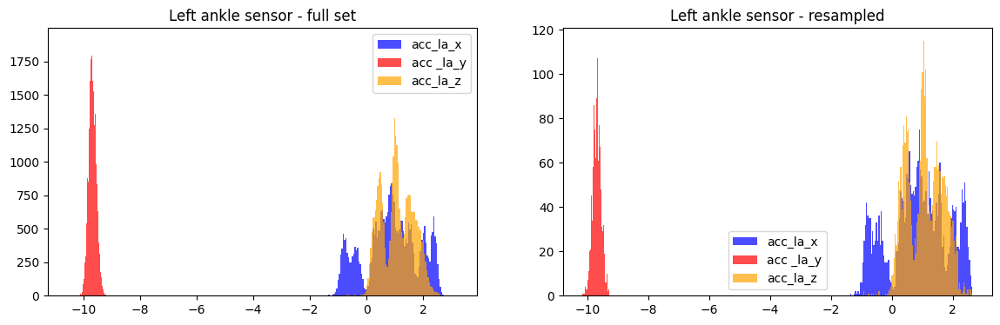

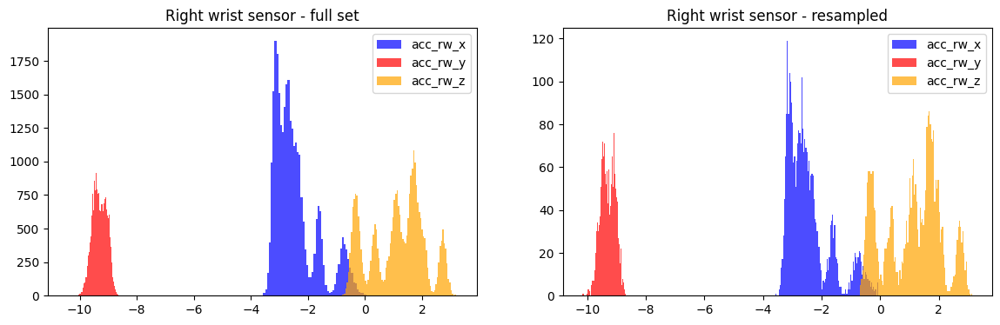

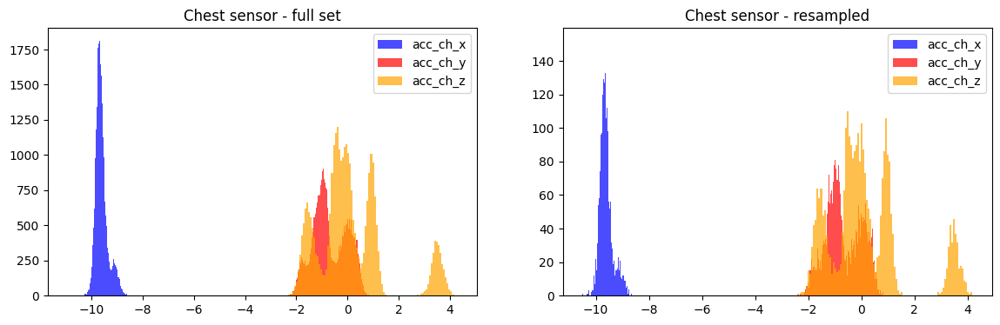

=================================== Standing still (1 min) - gyr ===================================


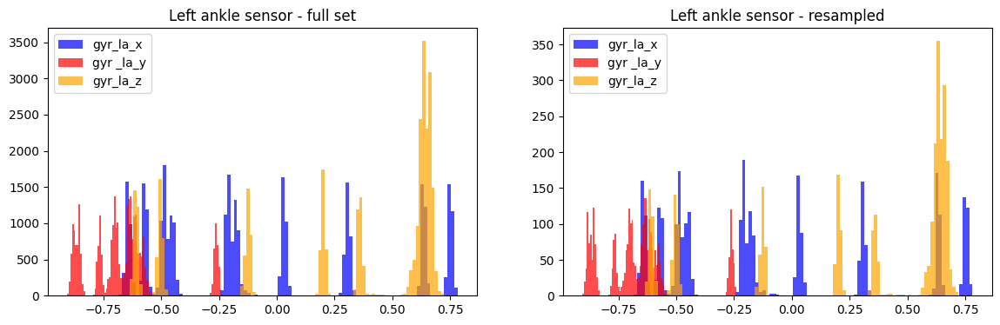

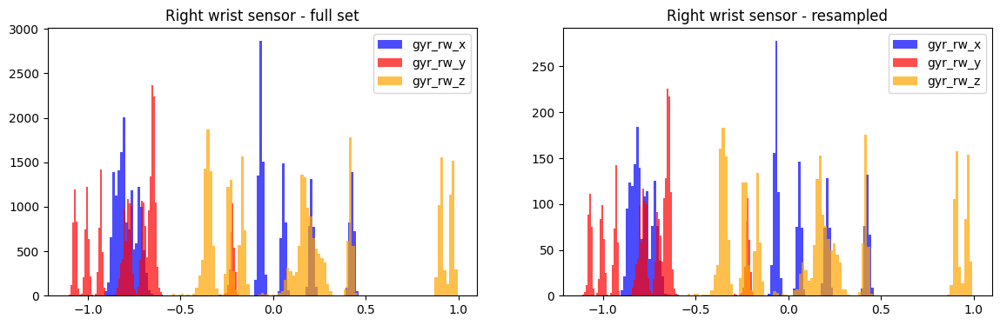

=================================== Standing still (1 min) - mag ===================================


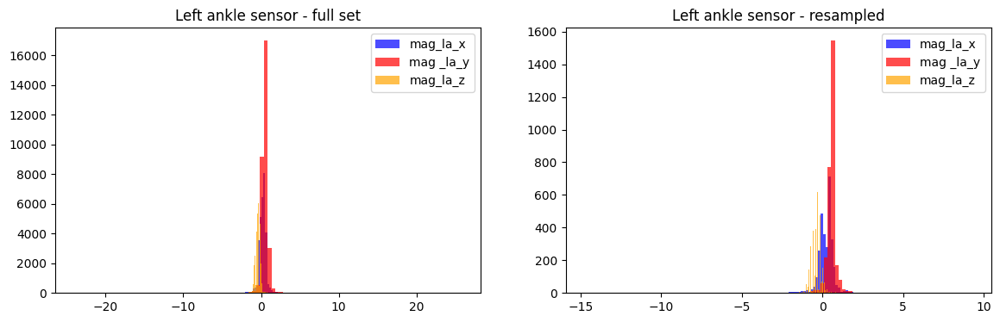

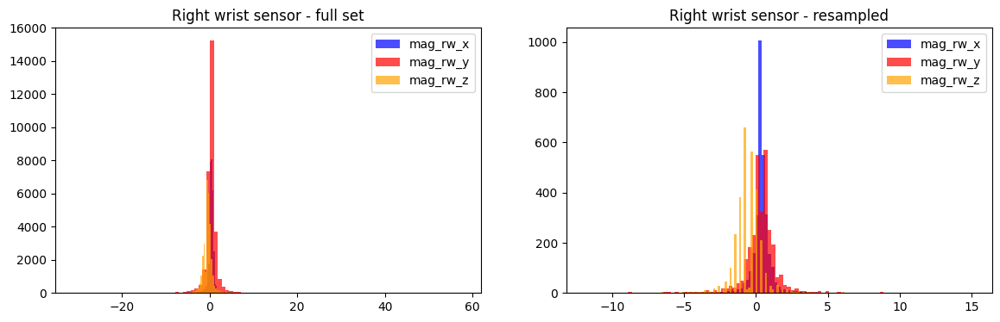

=================================== Sitting and relaxing (1 min) - acc ===================================


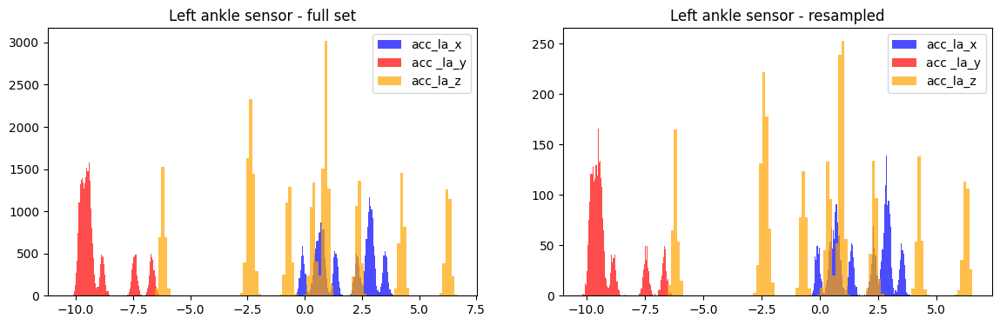

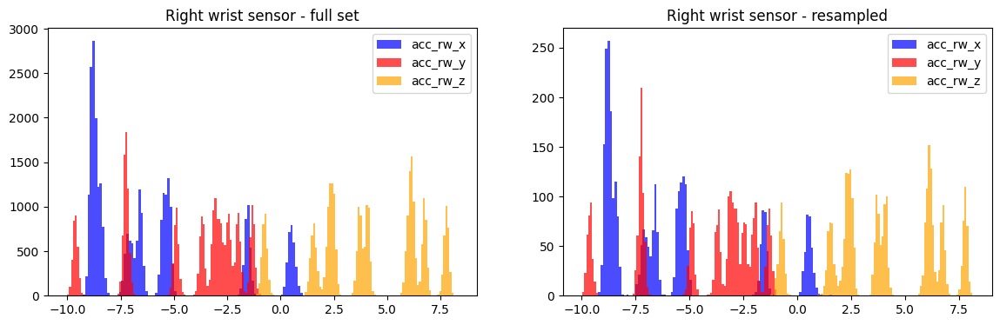

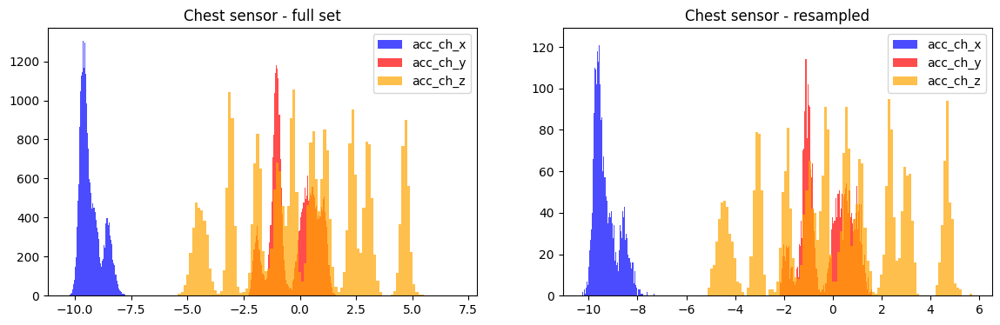

=================================== Sitting and relaxing (1 min) - gyr ===================================


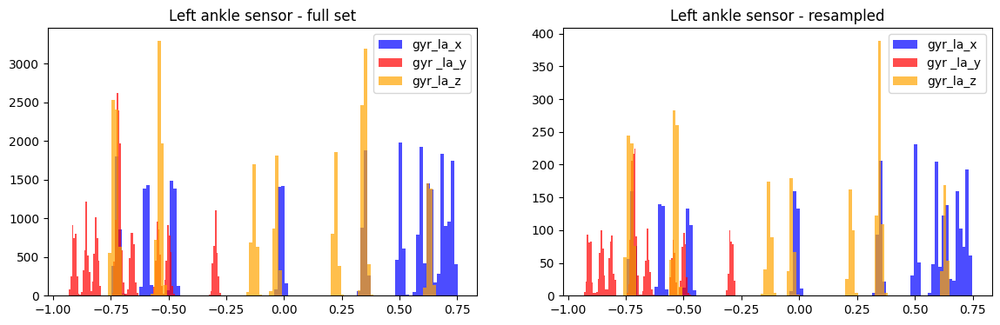

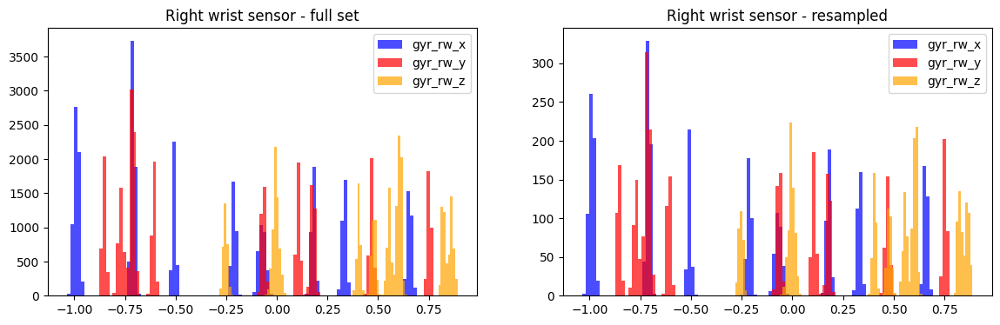

=================================== Sitting and relaxing (1 min) - mag ===================================


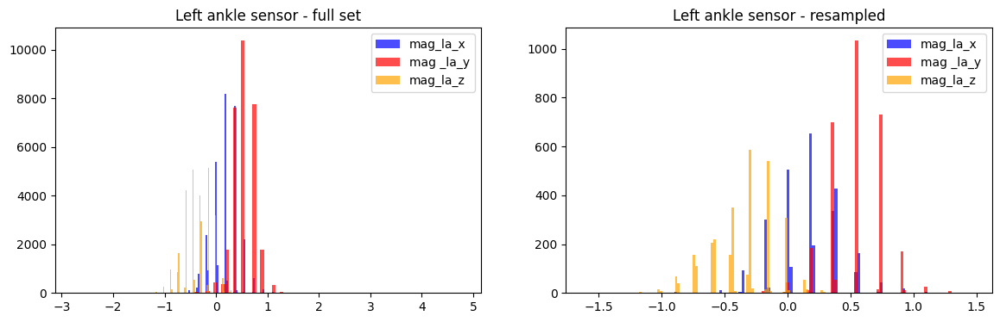

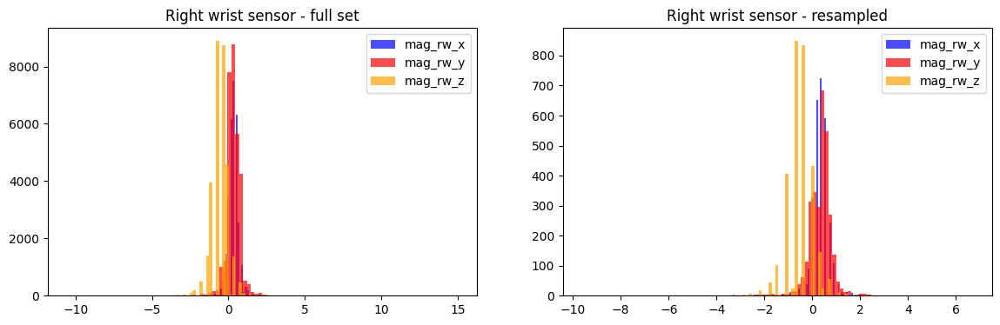

=================================== Lying down (1 min) - acc ===================================


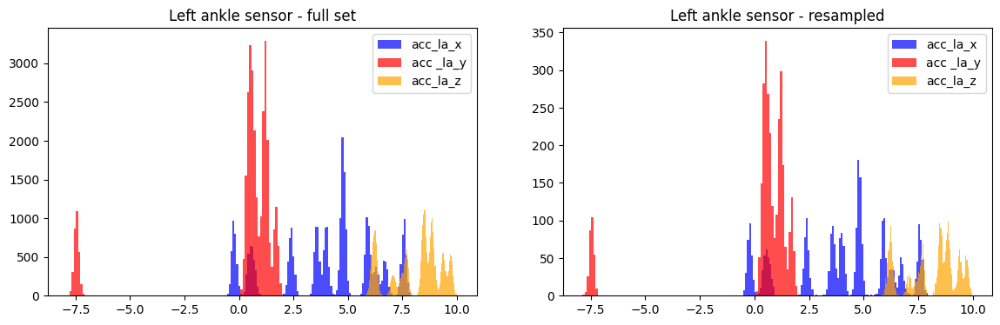

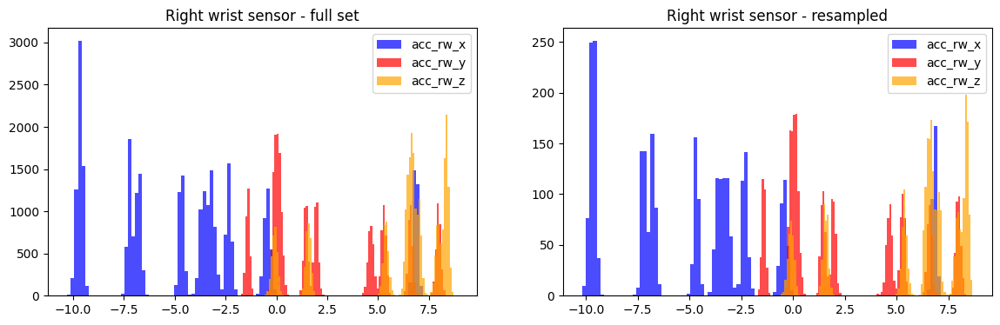

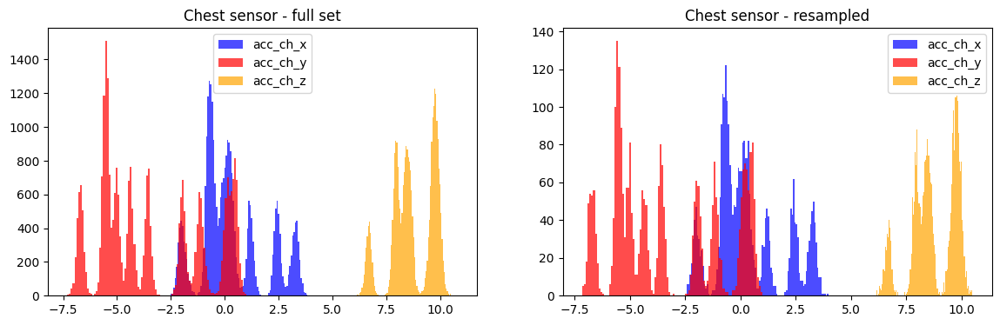

=================================== Lying down (1 min) - gyr ===================================


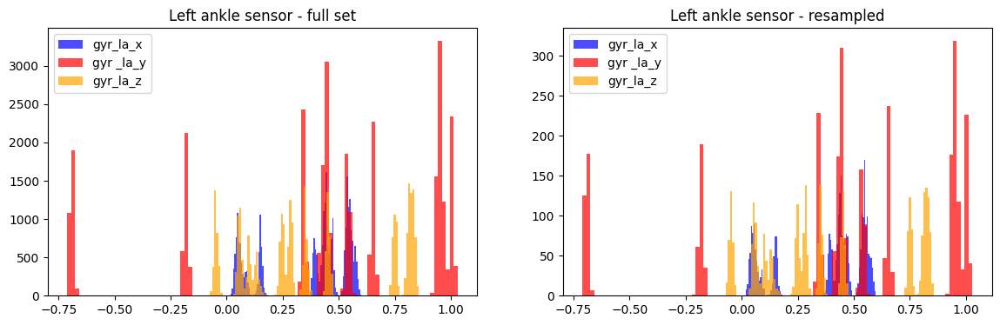

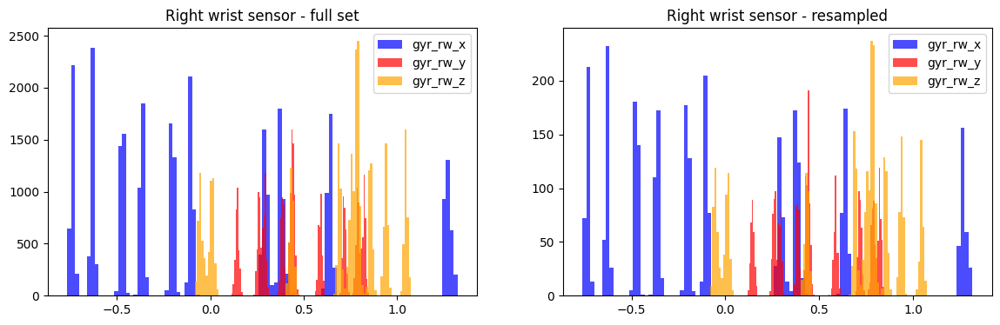

=================================== Lying down (1 min) - mag ===================================


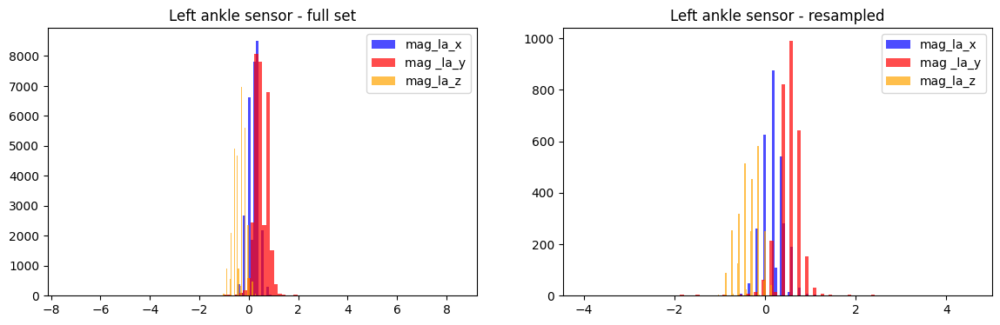

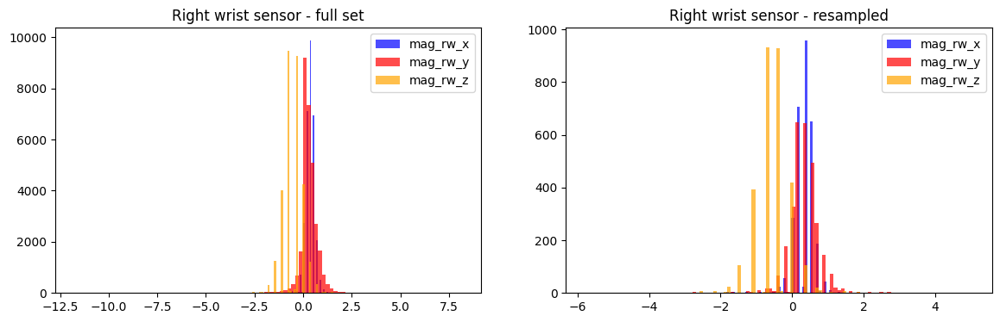

=================================== Walking (1 min) - acc ===================================


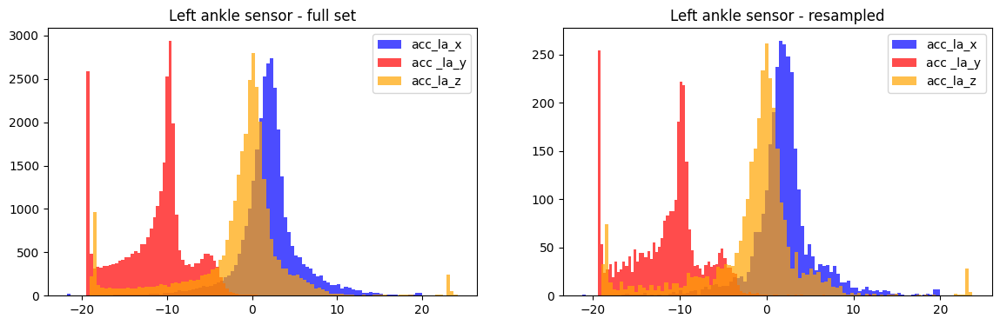

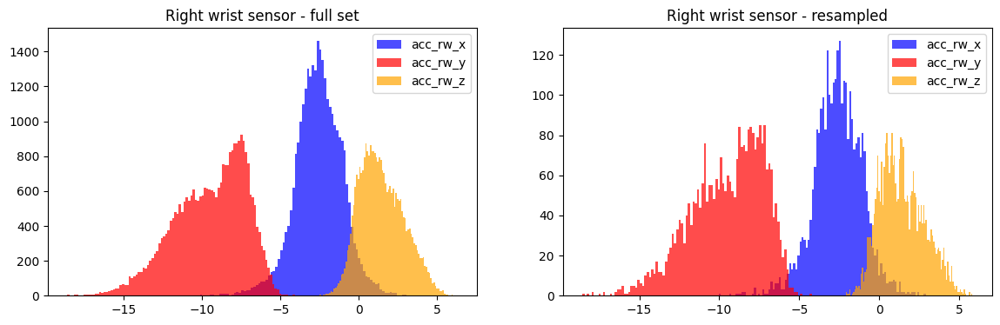

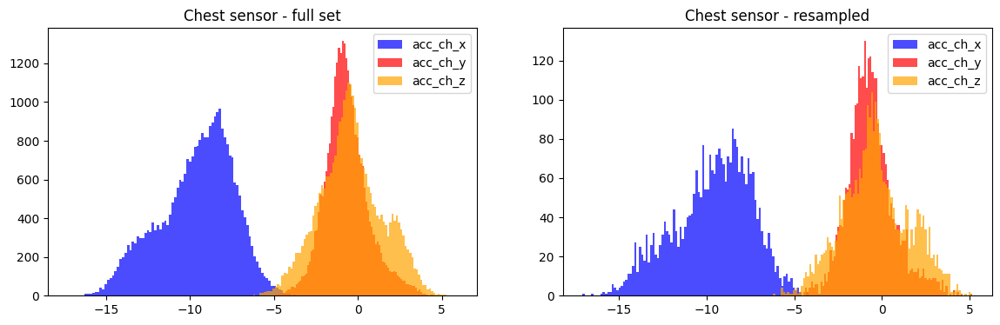

=================================== Walking (1 min) - gyr ===================================


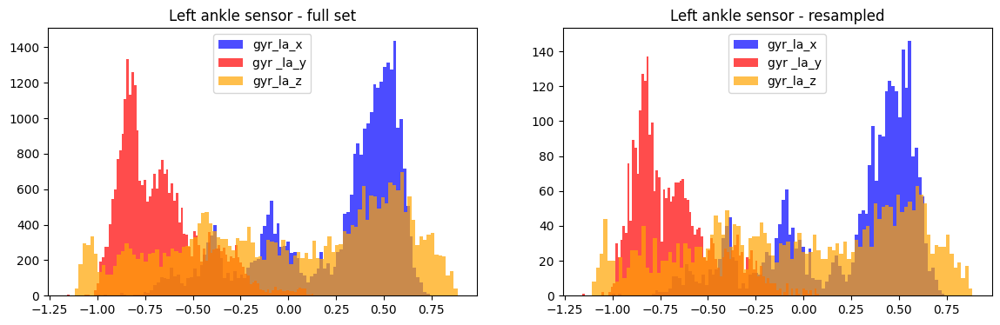

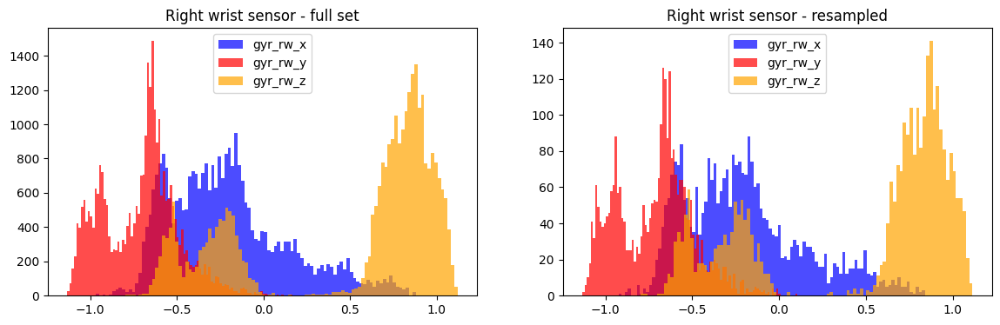

=================================== Walking (1 min) - mag ===================================


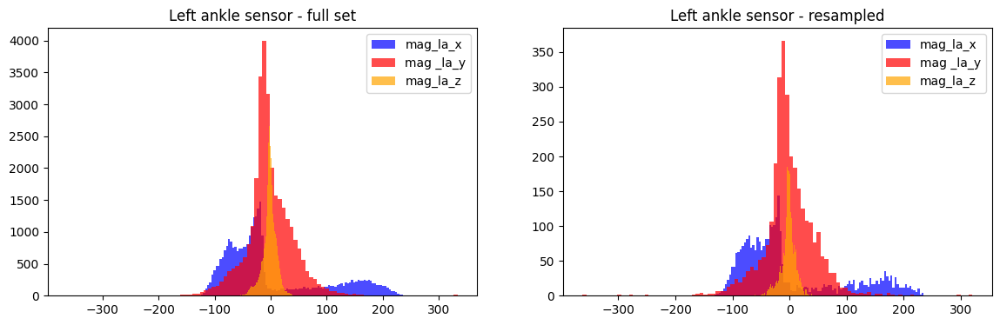

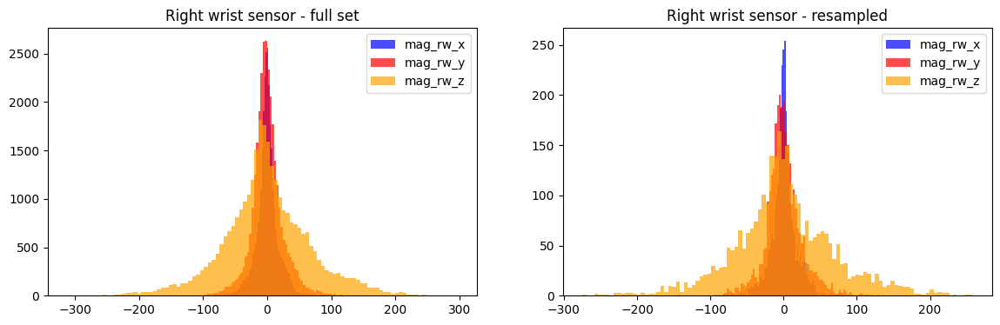

=================================== Climbing stairs (1 min) - acc ===================================


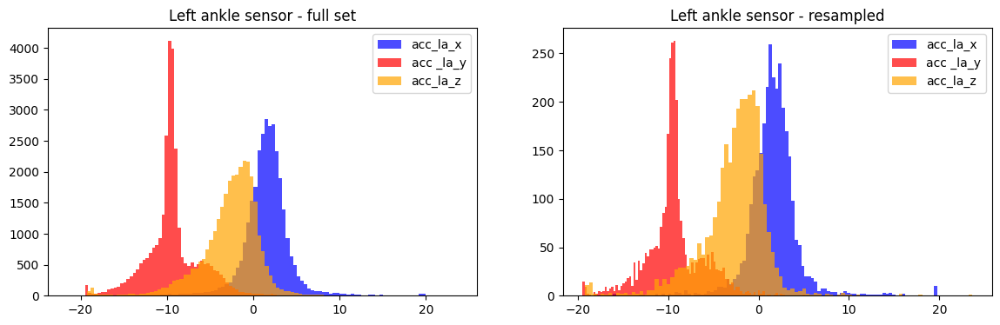

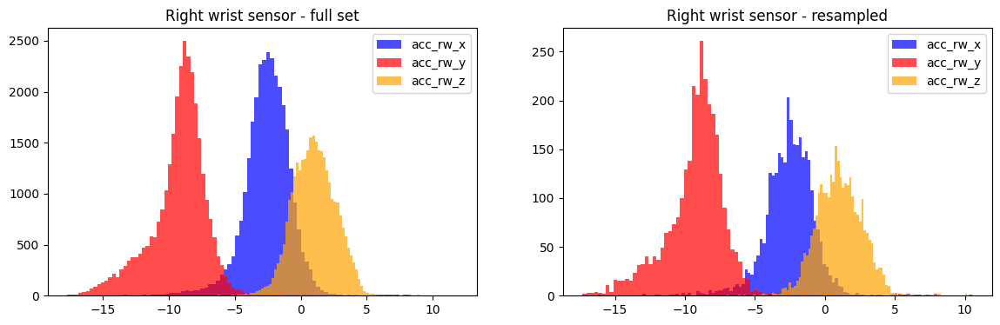

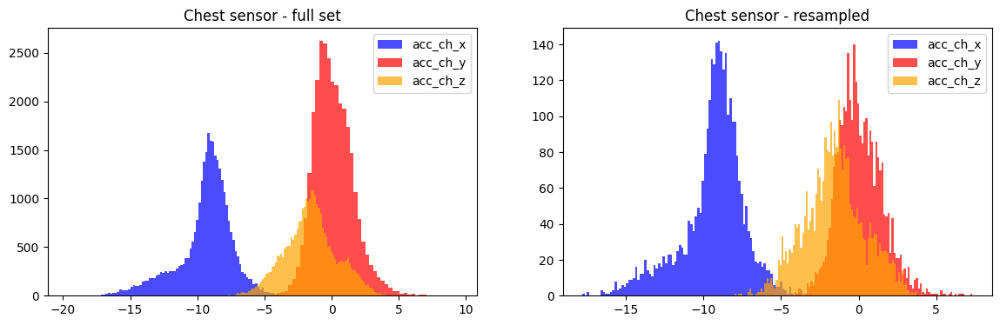

=================================== Climbing stairs (1 min) - gyr ===================================


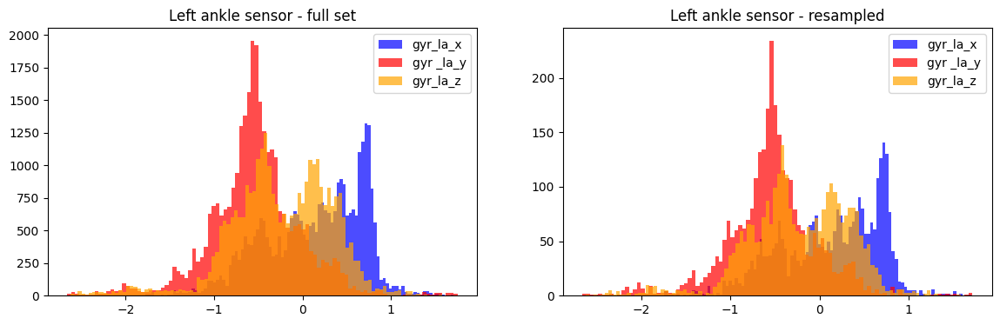

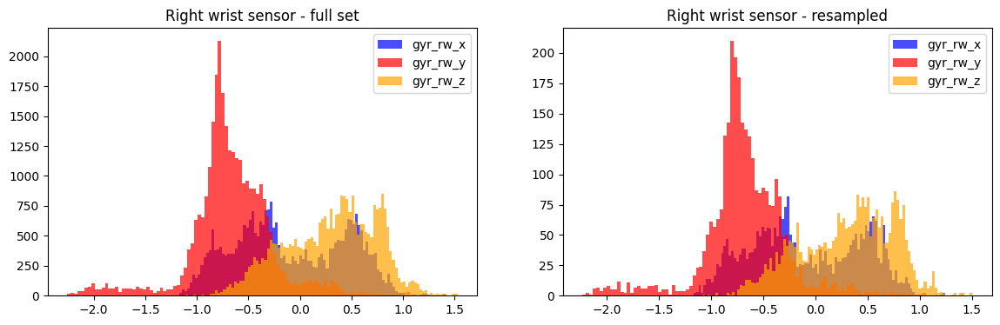

=================================== Climbing stairs (1 min) - mag ===================================


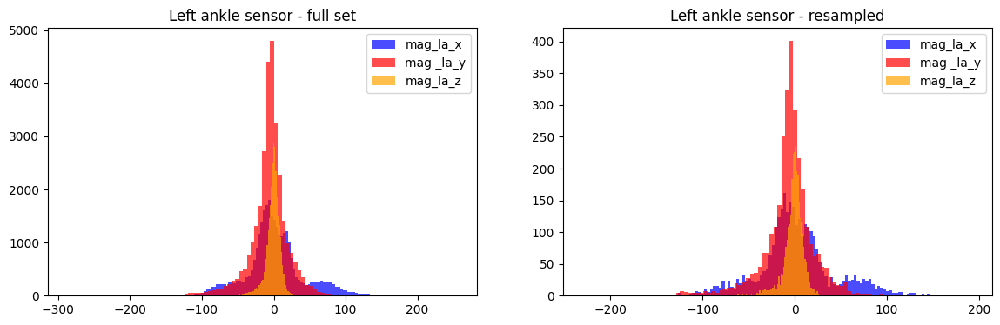

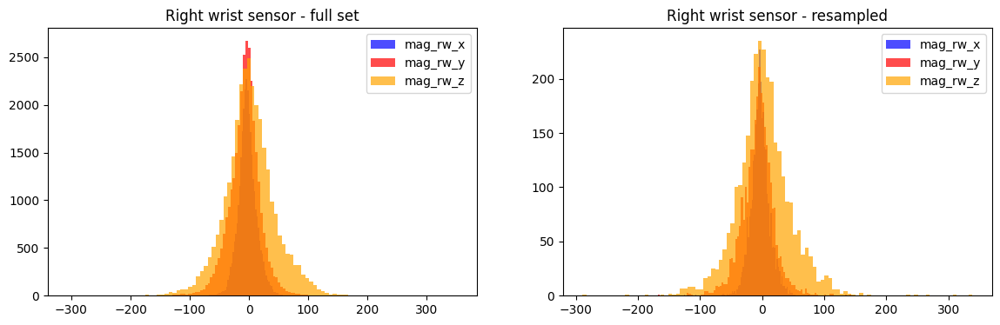

=================================== Waist bends forward (20x) - acc ===================================


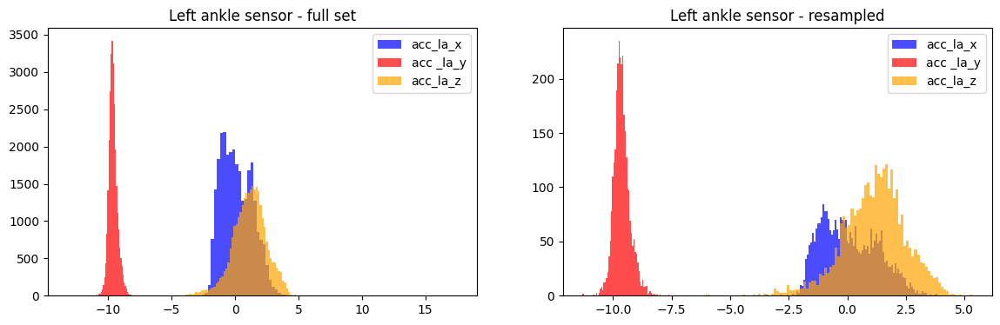

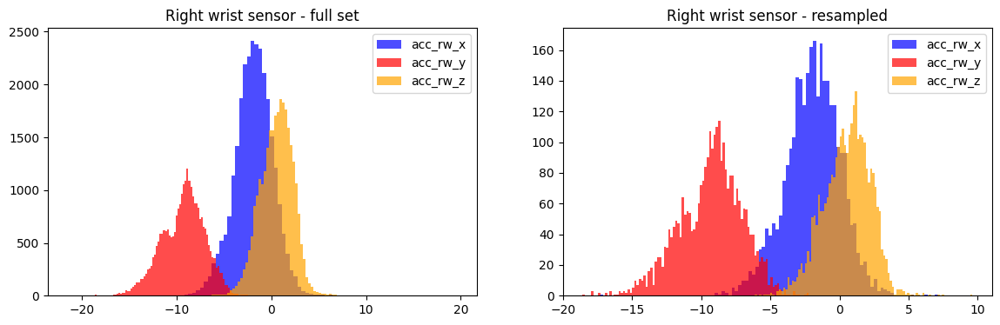

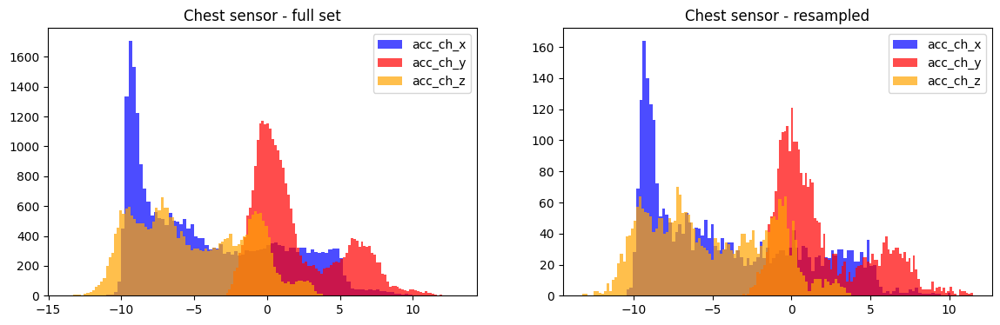

=================================== Waist bends forward (20x) - gyr ===================================


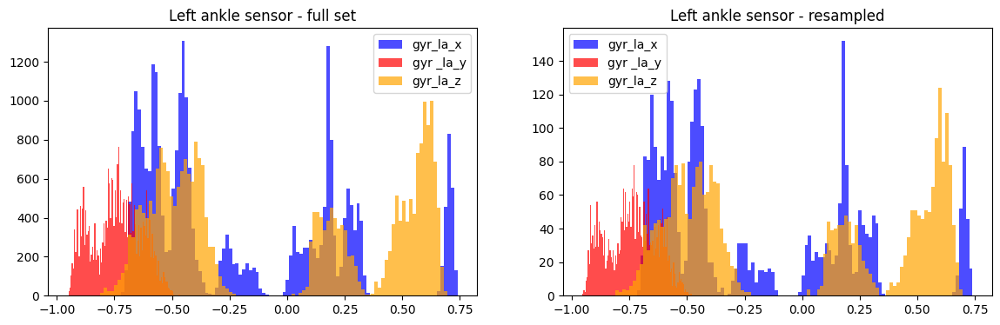

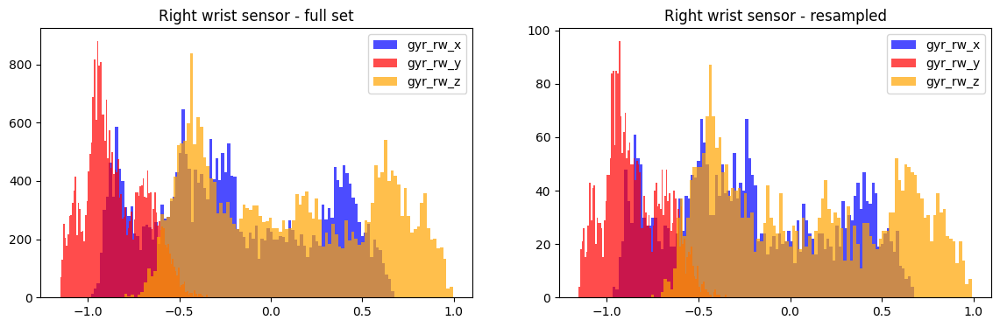

=================================== Waist bends forward (20x) - mag ===================================


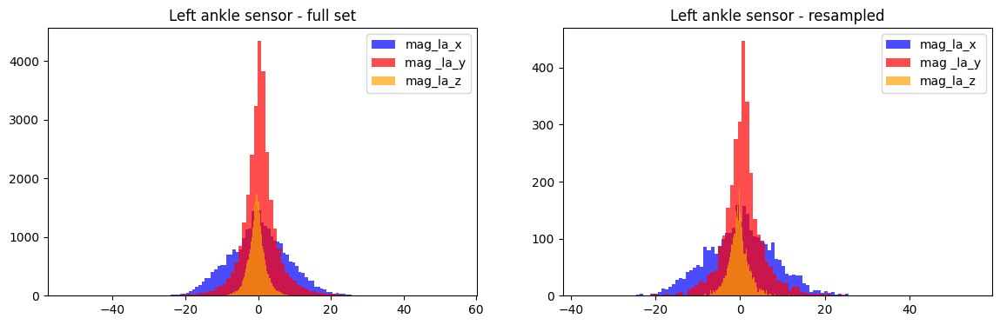

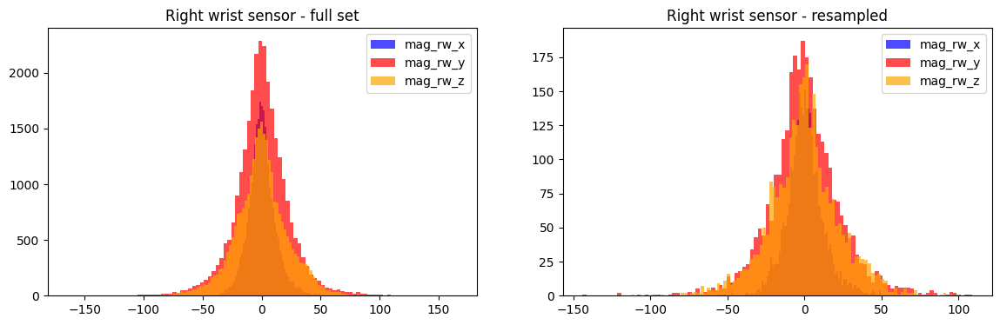

=================================== Frontal elevation of arms (20x) - acc ===================================


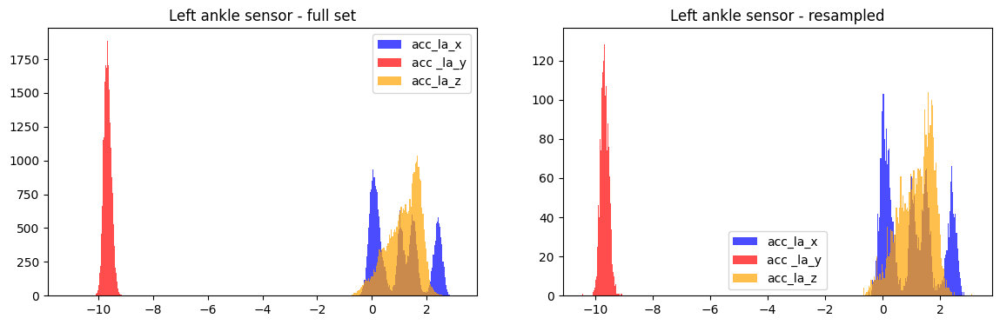

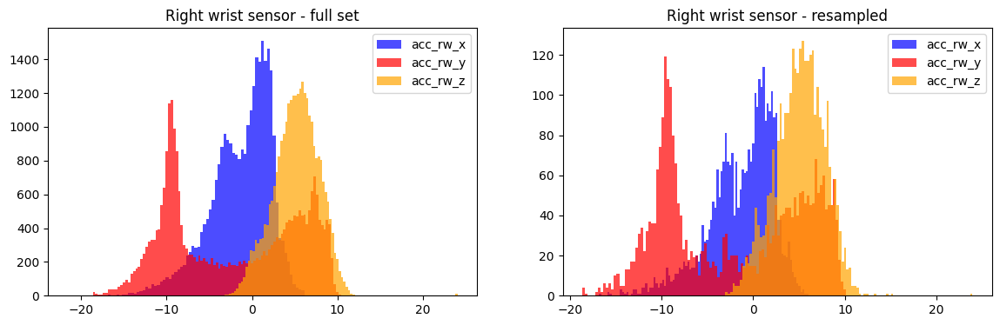

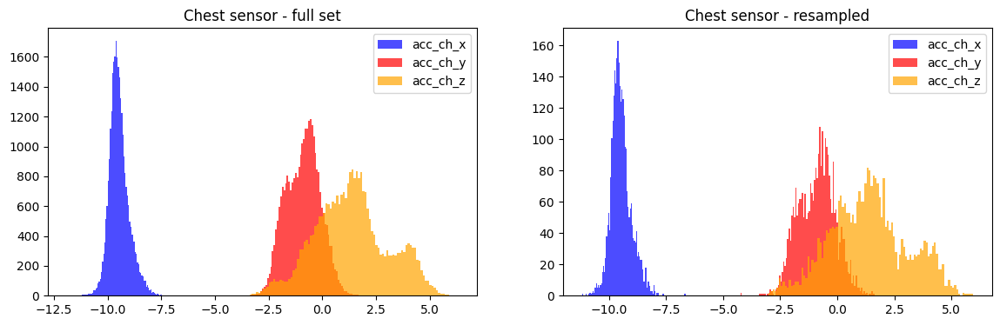

=================================== Frontal elevation of arms (20x) - gyr ===================================


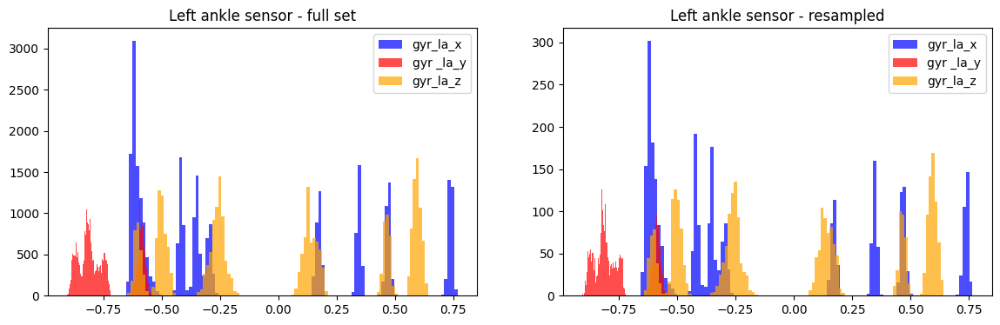

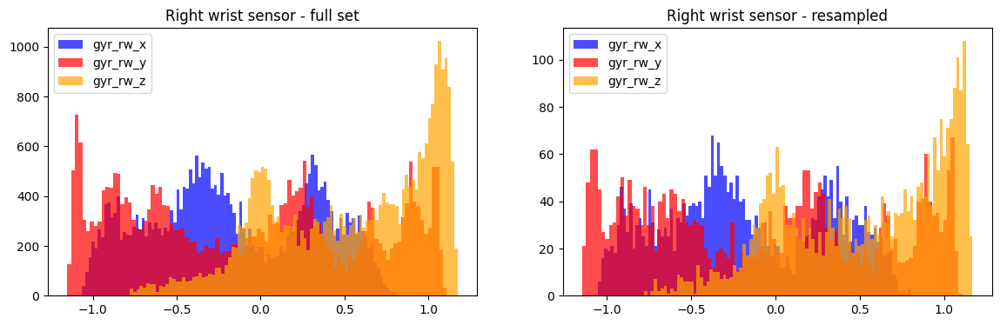

=================================== Frontal elevation of arms (20x) - mag ===================================


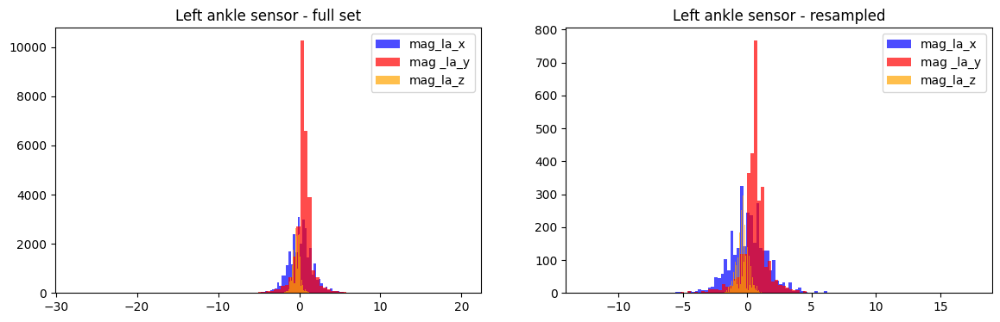

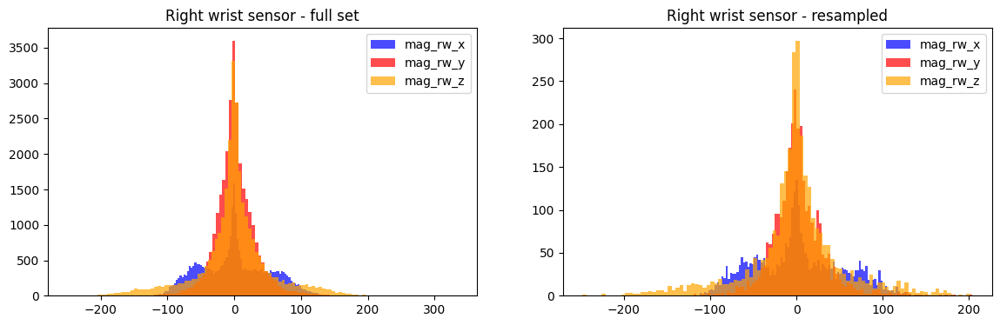

=================================== Knees bending (crouching) (20x) - acc ===================================


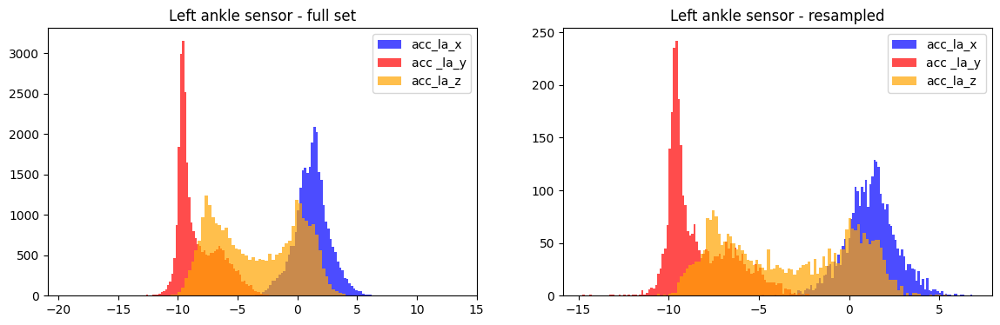

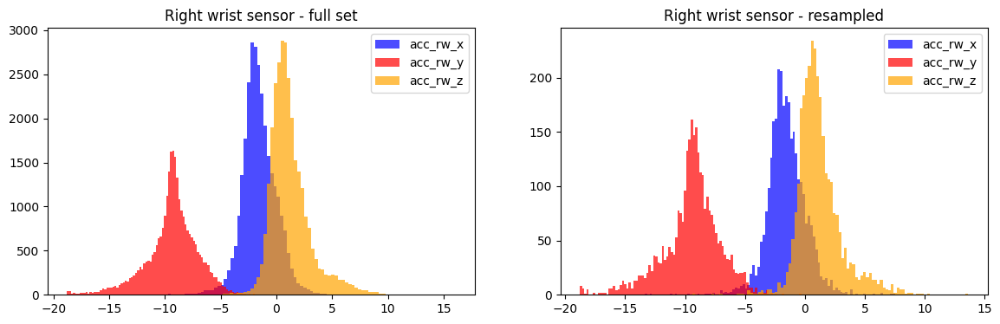

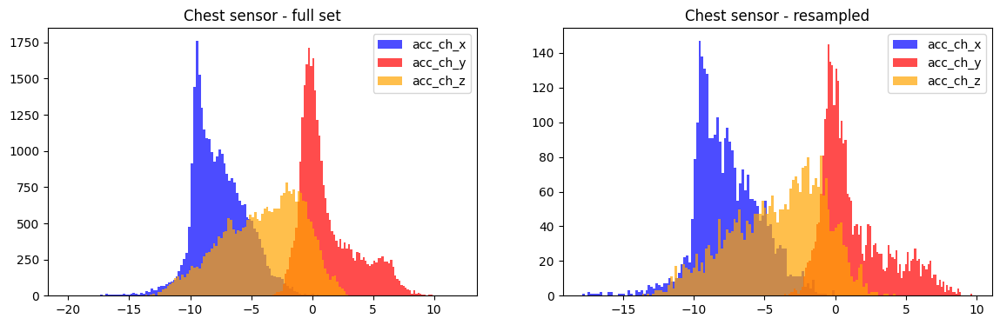

=================================== Knees bending (crouching) (20x) - gyr ===================================


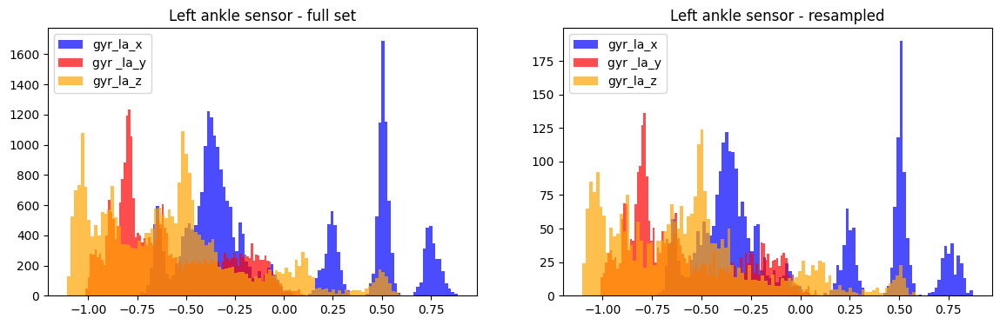

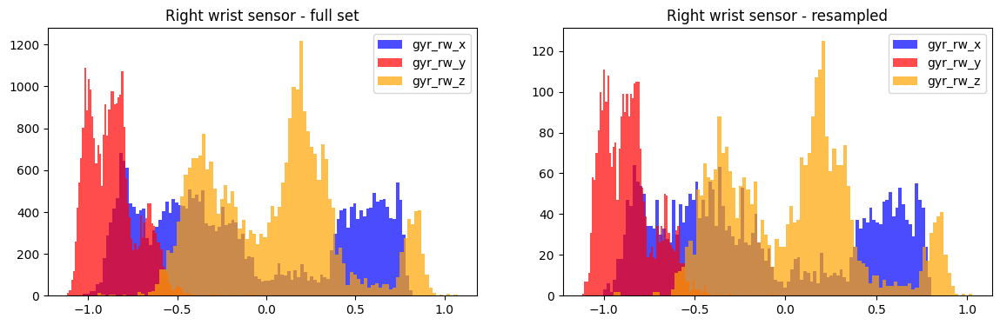

=================================== Knees bending (crouching) (20x) - mag ===================================


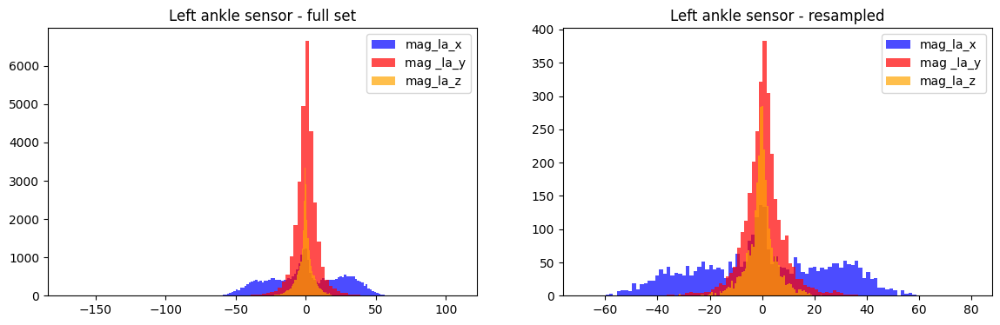

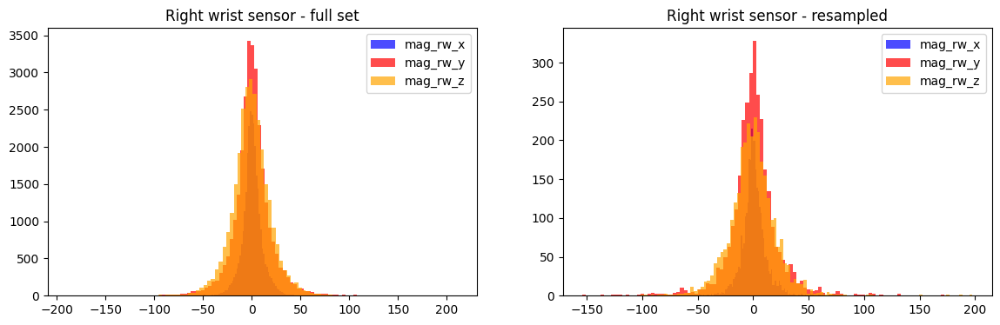

=================================== Cycling (1 min) - acc ===================================


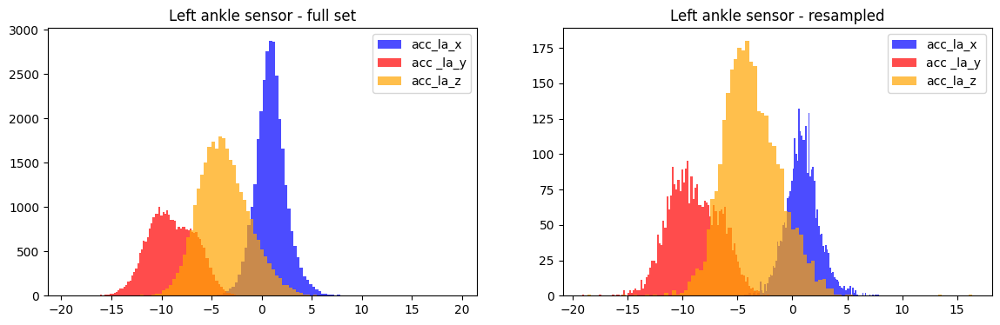

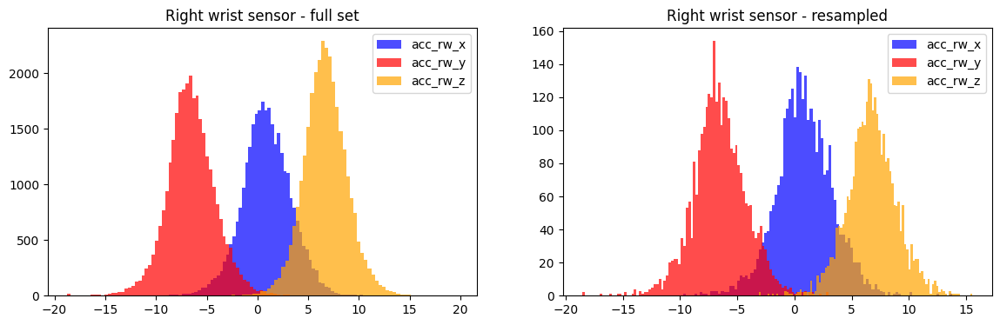

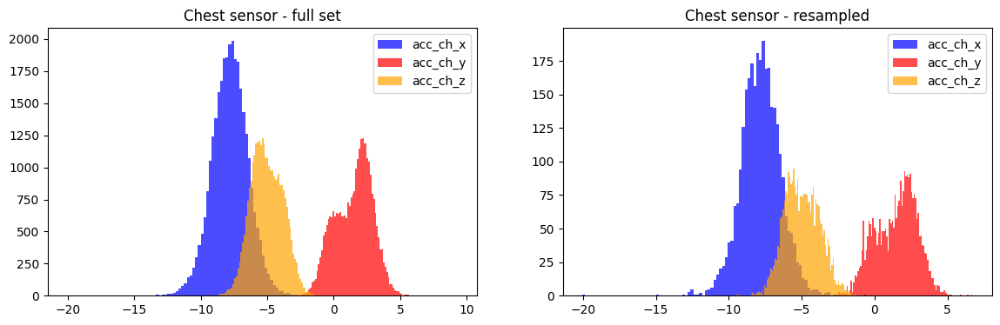

=================================== Cycling (1 min) - gyr ===================================


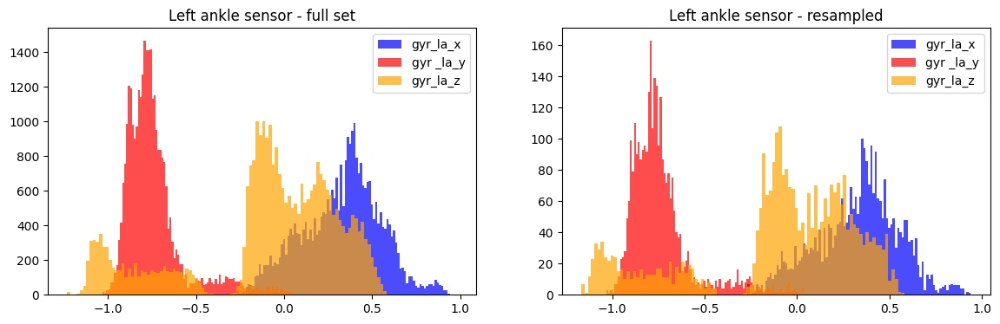

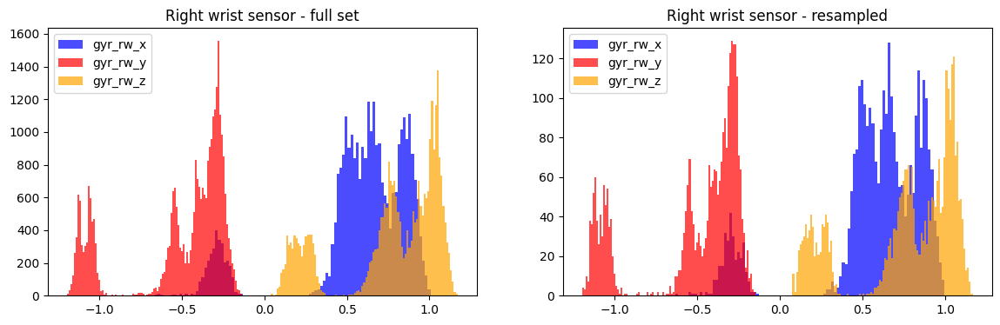

=================================== Cycling (1 min) - mag ===================================


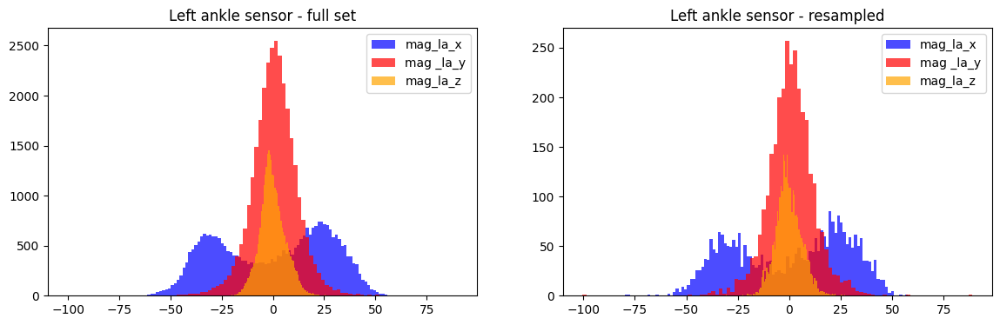

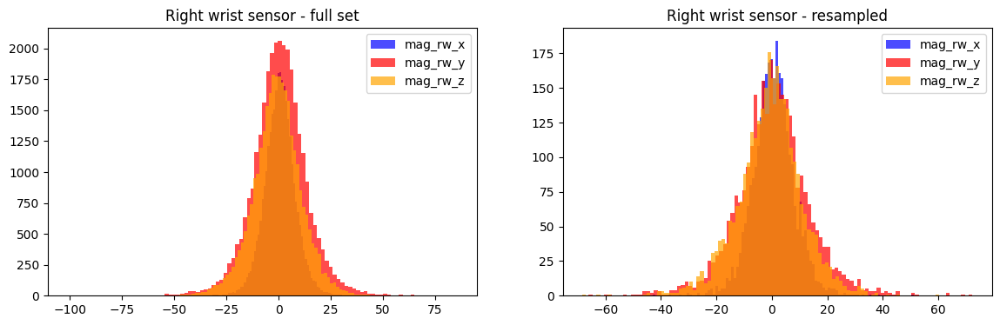

=================================== Jogging (1 min) - acc ===================================


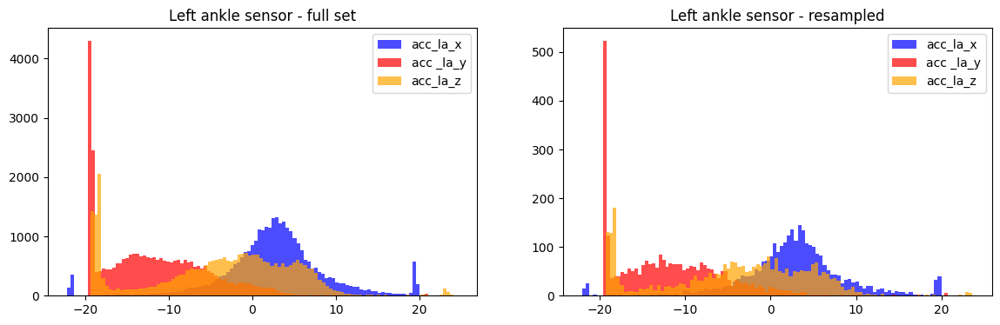

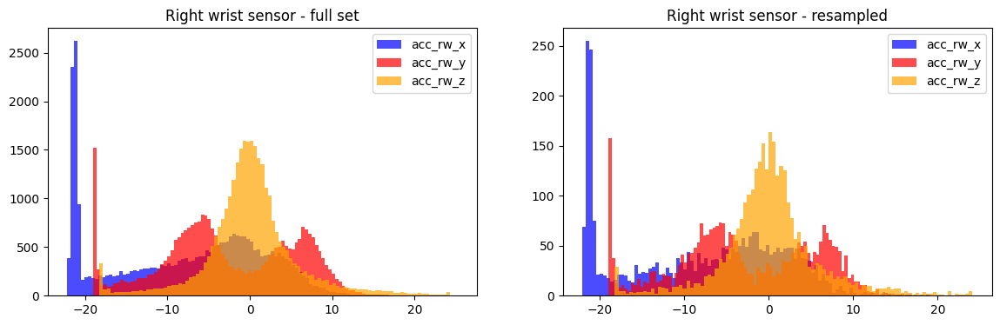

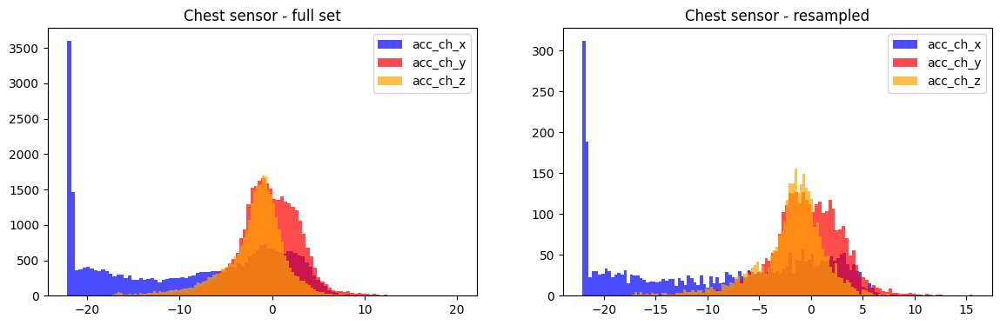

=================================== Jogging (1 min) - gyr ===================================


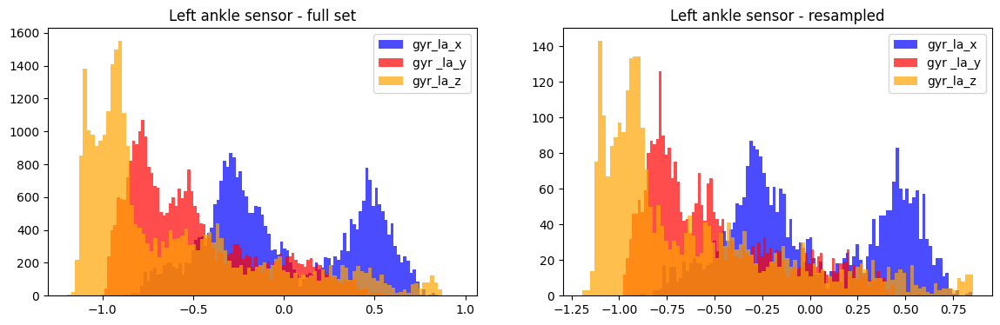

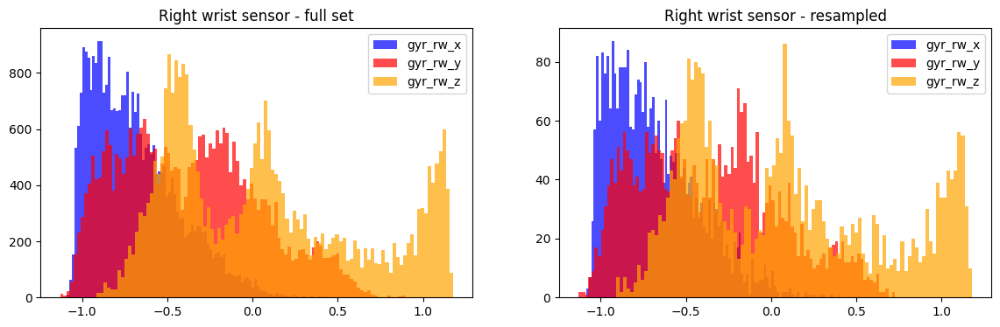

=================================== Jogging (1 min) - mag ===================================


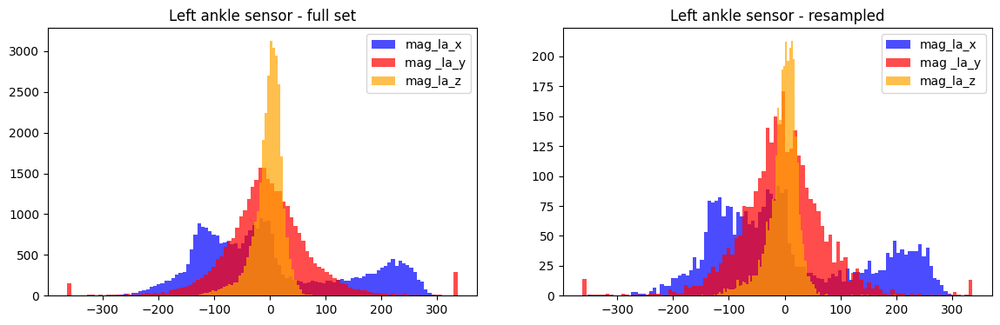

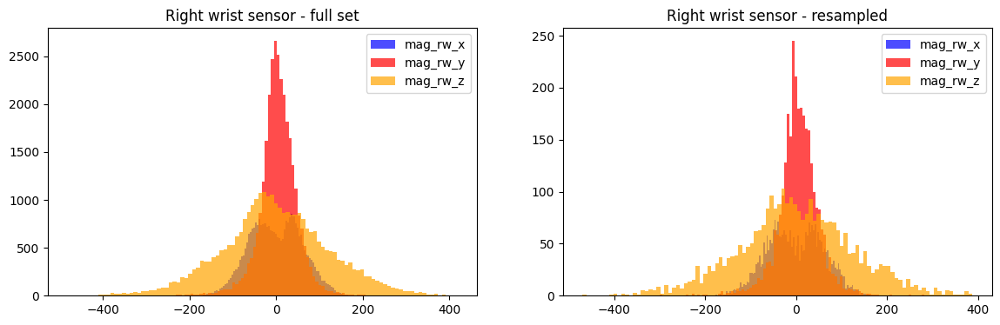

=================================== Running (1 min) - acc ===================================


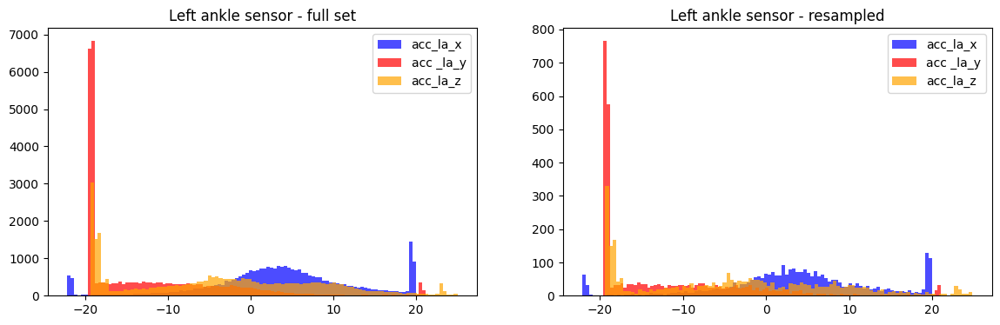

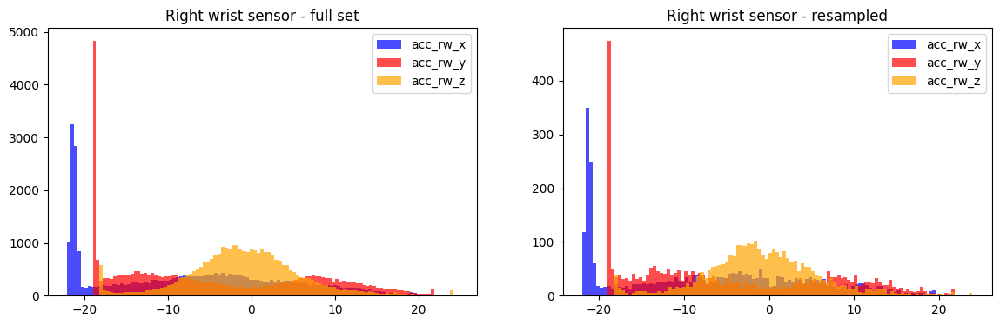

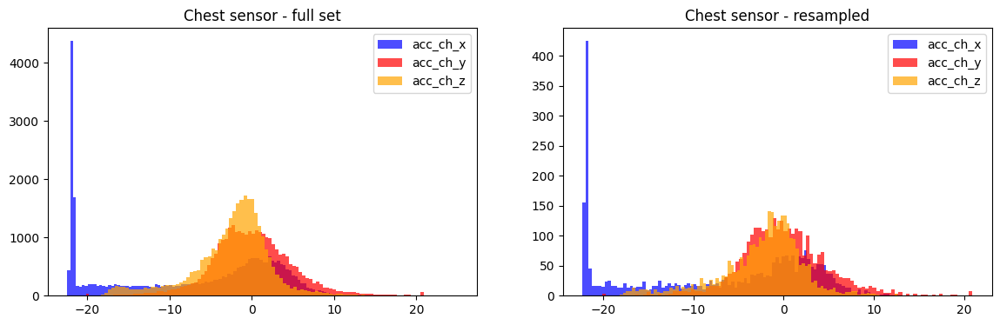

=================================== Running (1 min) - gyr ===================================


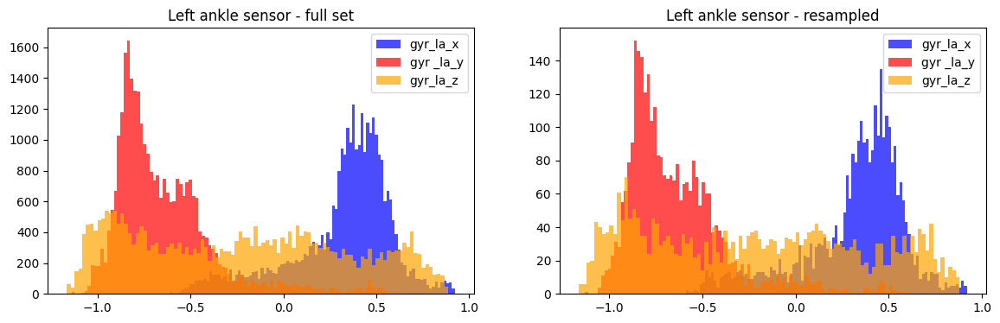

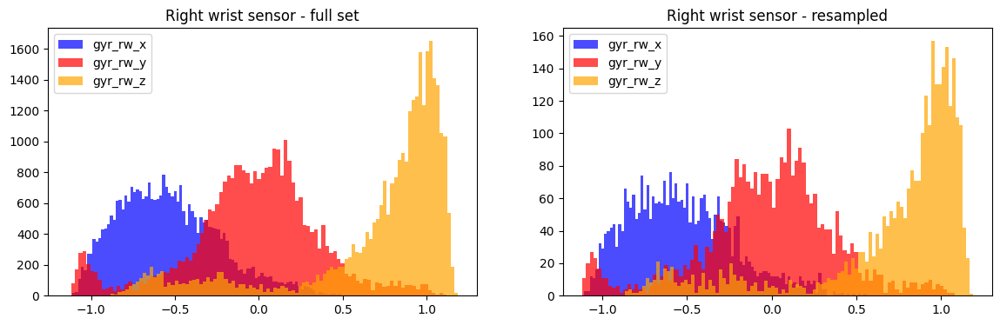

=================================== Running (1 min) - mag ===================================


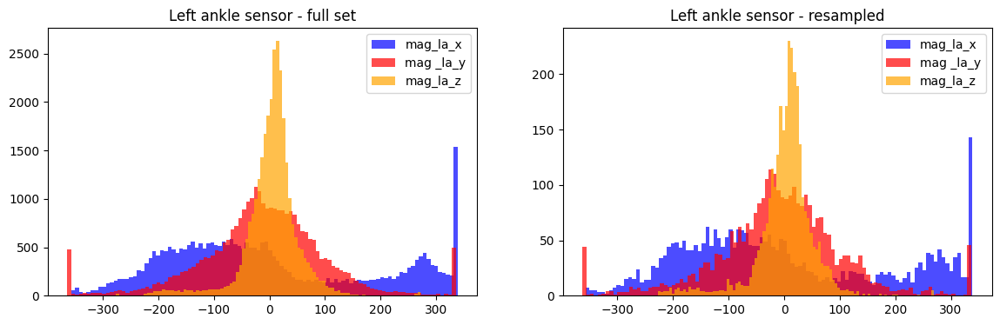

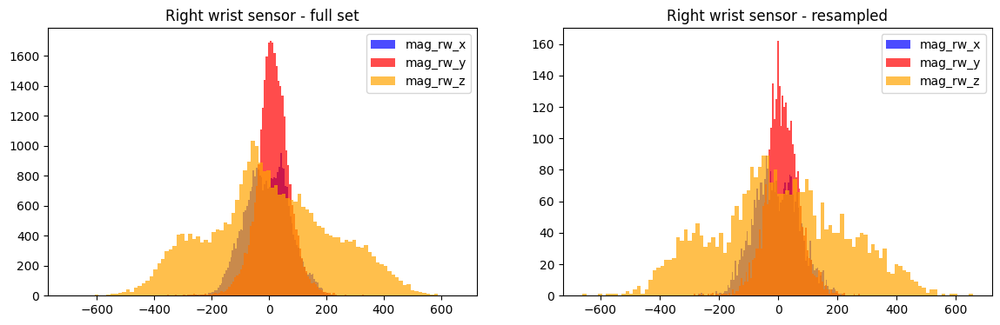

=================================== Jump front & back (20x) - acc ===================================


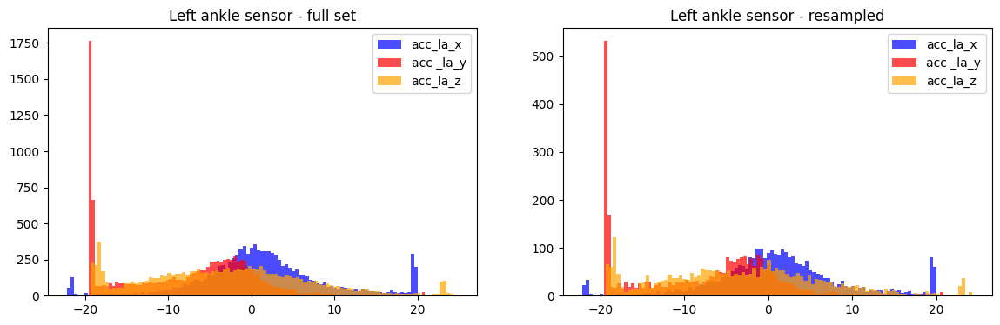

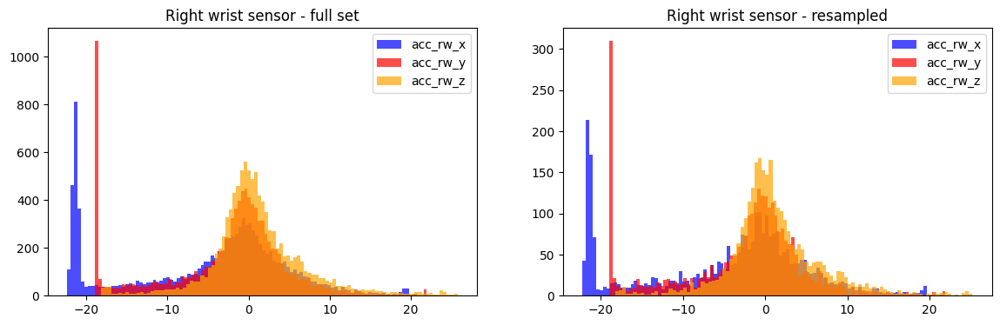

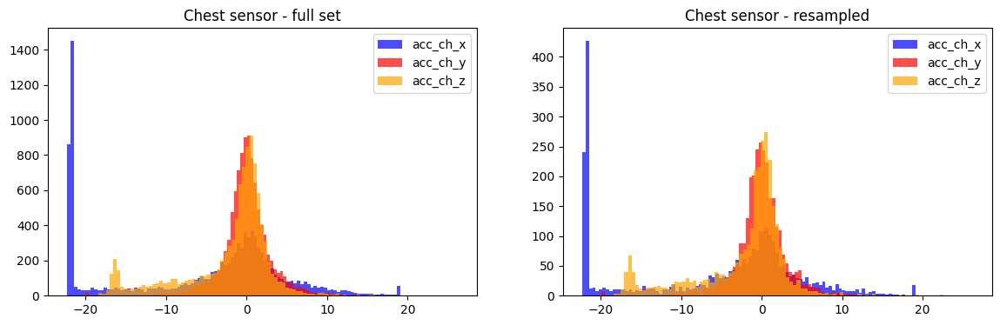

=================================== Jump front & back (20x) - gyr ===================================


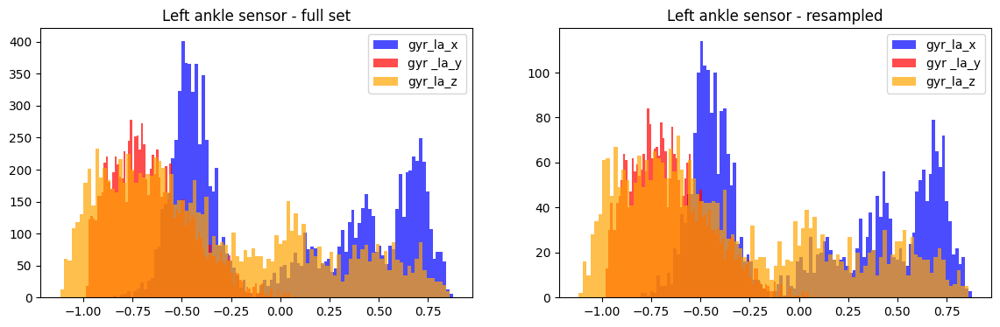

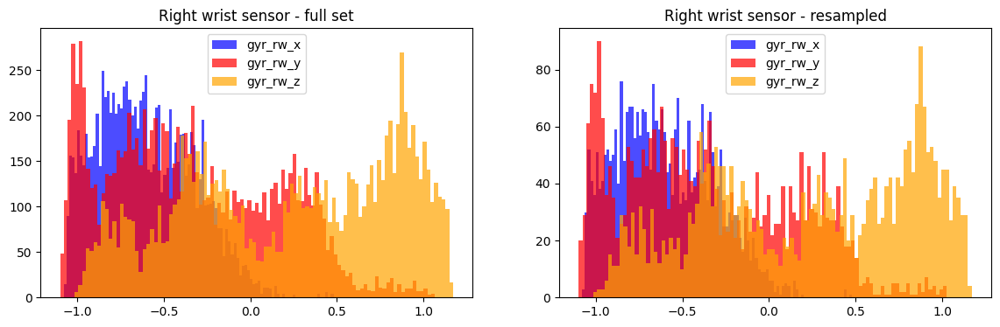

=================================== Jump front & back (20x) - mag ===================================


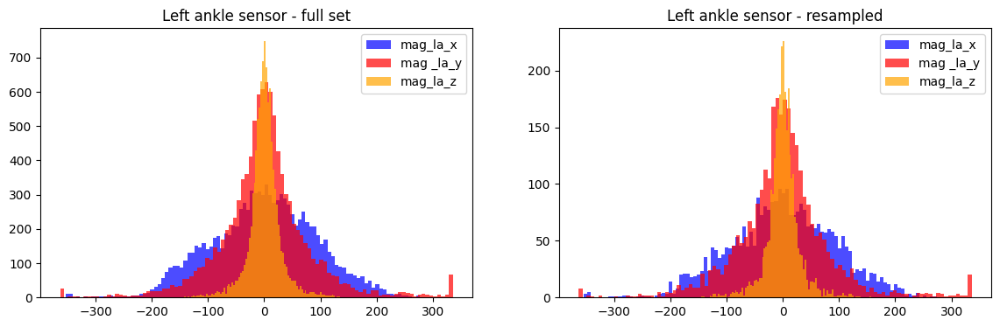

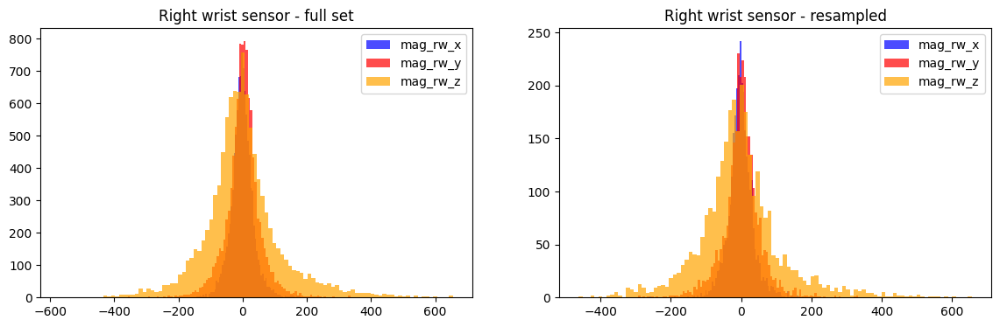

In [26]:
# Compare distribution plots of full (balanced) dataset and resampled dataset for each activity and sensor
# Note: It looks like resampling to 3000 from each activity results in very similar distribution plot when compared
# to the full dataset. Hence, this size per activity may be sufficient for the models
readings = ['acc', 'gyr', 'mag']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activity_map[i]} - {r} ===================================')

        # Full set
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_la_x'], color='blue', alpha=.7, label= r + '_la_x', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_la_y'],color='red', alpha=.7, label= r +' _la_y', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_la_z'],color='orange', alpha=.7, label= r + '_la_z', bins=100)
        plt.title('Left ankle sensor - full set')
        plt.legend()

        # Resampled
        plt.subplot(1,2,2)
        plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_la_x'], color='blue', alpha=.7, label= r + '_la_x', bins=100)
        plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_la_y'],color='red', alpha=.7, label= r +' _la_y', bins=100)
        plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_la_z'],color='orange', alpha=.7, label= r + '_la_z', bins=100)
        plt.title('Left ankle sensor - resampled')
        plt.legend()
        plt.show()

        # Full set
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_rw_x'], color='blue', alpha=.7, label= r + '_rw_x', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_rw_y'],color='red', alpha=.7, label= r + '_rw_y', bins=100)
        plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_rw_z'],color='orange', alpha=.7, label= r + '_rw_z', bins=100)
        plt.title('Right wrist sensor - full set')
        plt.legend()

        # Resampled
        plt.subplot(1,2,2)
        plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_rw_x'], color='blue', alpha=.7, label= r + '_rw_x', bins=100)
        plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_rw_y'],color='red', alpha=.7, label= r + '_rw_y', bins=100)
        plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_rw_z'],color='orange', alpha=.7, label= r + '_rw_z', bins=100)
        plt.title('Right wrist sensor - resampled')
        plt.legend()
        plt.show()

        # No magnetometer or gyroscope data for the chest sensor
        if r == 'acc':

            # Full set
            plt.figure(figsize=(14,4))
            plt.subplot(1,2,1)
            plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_ch_x'], color='blue', alpha=.7, label= r + '_ch_x', bins=100)
            plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_ch_y'],color='red', alpha=.7, label= r + '_ch_y', bins=100)
            plt.hist(data[data['activity']==i].reset_index(drop=True)[r + '_ch_z'],color='orange', alpha=.7, label= r + '_ch_z', bins=100)
            plt.title('Chest sensor - full set')
            plt.legend()

            # Resampled
            plt.subplot(1,2,2)
            plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_ch_x'], color='blue', alpha=.7, label= r + '_ch_x', bins=100)
            plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_ch_y'],color='red', alpha=.7, label= r + '_ch_y', bins=100)
            plt.hist(resampled_data[resampled_data['activity']==i].reset_index(drop=True)[r + '_ch_z'],color='orange', alpha=.7, label= r + '_ch_z', bins=100)
            plt.title('Chest sensor - resampled')
            plt.legend()
            plt.show()

#MODEL

In [27]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import shuffle
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go

#Data Preparation/preprocessing

In [28]:
data = pd.read_csv('mhealth_full.csv')

In [29]:
# Below function resamples the same number of observations from each activity category
def resample_data(data, num_observations):
    resampled_data = pd.DataFrame()
    for i in range(0, 13):
        data_activity_i = data[data['activity'] == i]
        data_activity_i = data_activity_i.sample(n=num_observations, random_state=1)
        resampled_data = pd.concat([data_activity_i, resampled_data])
    return resampled_data

In [30]:
# Resample data for better computation time (3000 observations from each category per EDA)
data = resample_data(data, 3000)

In [31]:
# Split data between predictors and output variable
X = data.drop(['activity', 'subject'], axis=1)
y = data['activity']

In [32]:
# Create scaled version of full predictor set in case using cross validation techniques
X_scaled = StandardScaler().fit_transform(X)

In [33]:
# Create train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=2)

In [34]:
# Scale train/ test predictors based on training data
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [35]:
# Results summarizer function (scores, confusion matrix) for classification results
def results_summarizer(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro')
    rec = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')

    activity_map = {
        0: 'Null',
        1: 'Standing still',
        2: 'Sitting and relaxing',
        3: 'Lying down',
        4: 'Walking',
        5: 'Climbing stairs',
        6: 'Waist bends forward',
        7: 'Frontal elevation of arms',
        8: 'Knees bending (crouching)',
        9: 'Cycling',
        10: 'Jogging',
        11: 'Running',
        12: 'Jump front & back'
    }
    plt.figure(figsize=(14, 12))

    sns.heatmap(cm,
                annot=True,
                cmap='Blues',
                xticklabels=activity_map.values(),
                yticklabels=activity_map.values()
               )

    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Activity')
    plt.ylabel('Actual Activity')
    plt.show()

    print(f'Accuracy Score: ' + '{:.4%}'.format(acc))
    print(f'Precision Score: ' + '{:.4%}'.format(prec))
    print(f'Recall Score: ' + '{:.4%}'.format(rec))
    print(f'F_1 Score: ' + '{:.4%}'.format(f1))

#Models - Logistic Regression

In [36]:
# Logistic regression with newton-cg solver
log_reg = LogisticRegression(solver='newton-cg', max_iter=300)
log_reg.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=300, solver='newton-cg')

In [37]:
y_pred_log = log_reg.predict(X_test_scaled)

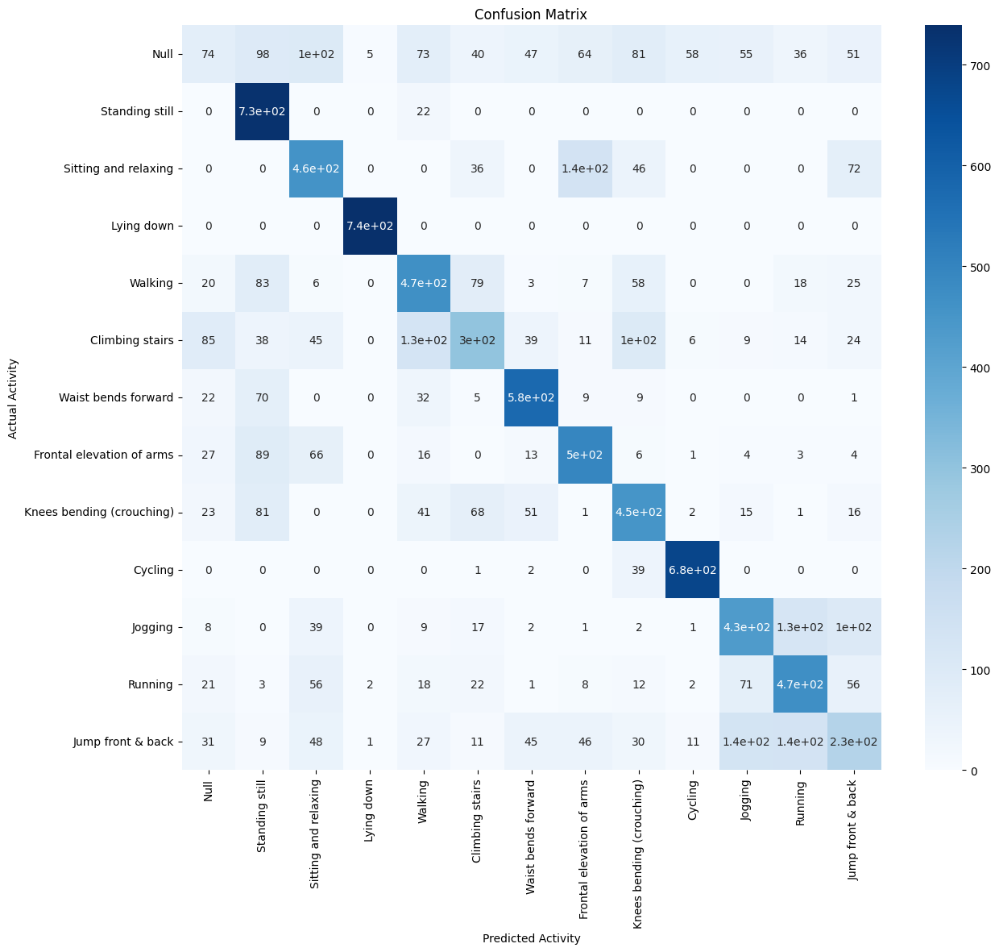

Accuracy Score: 62.5641%
Precision Score: 60.4412%
Recall Score: 63.0859%
F_1 Score: 61.0093%


In [38]:
results_summarizer(y_test, y_pred_log)

In [39]:
# Logistic regression with lbfgs solver
log_reg = LogisticRegression(solver='lbfgs', max_iter=400)
log_reg.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=400)

In [40]:
y_pred_log_2 = log_reg.predict(X_test_scaled)

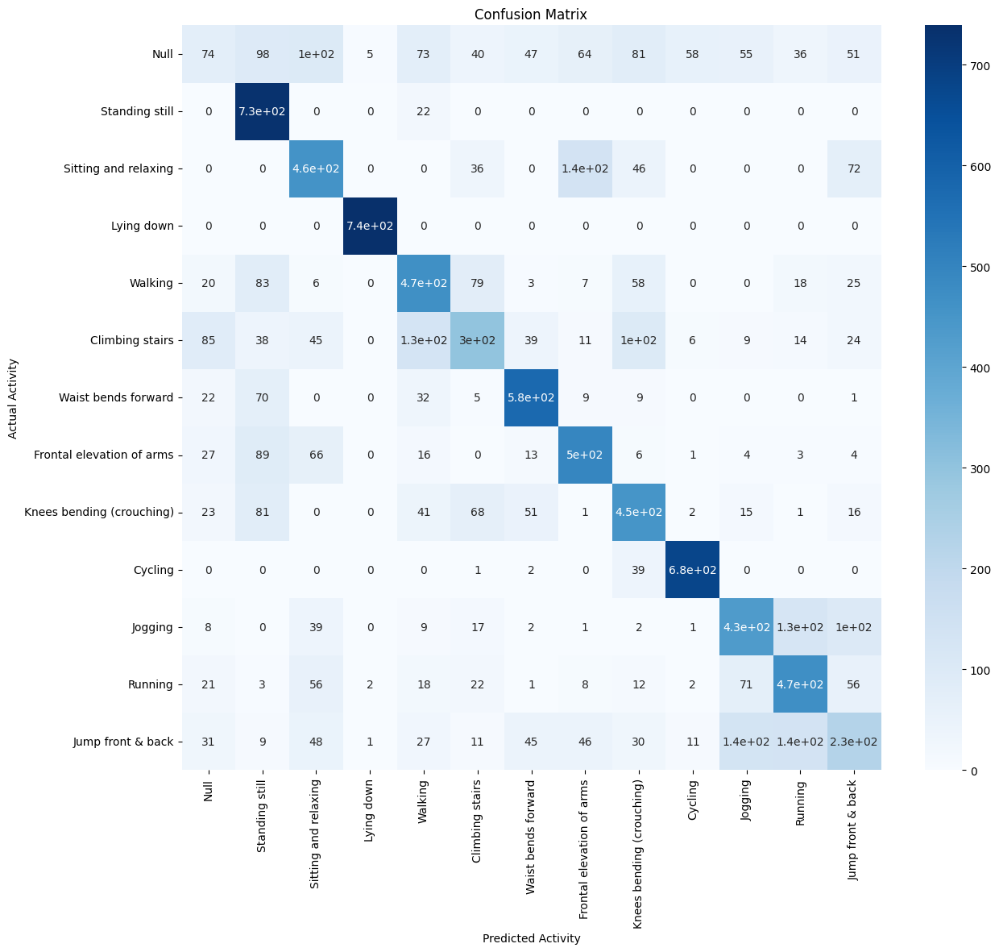

Accuracy Score: 62.5641%
Precision Score: 60.4412%
Recall Score: 63.0859%
F_1 Score: 61.0093%


In [41]:
results_summarizer(y_test, y_pred_log_2)

In [42]:
# Cross validation on logistic regression
log_reg = LogisticRegression(solver='lbfgs', max_iter=400)
cv_scores = cross_val_score(log_reg, X_scaled, y, cv=5)
# Print cross val scores along with average
print(cv_scores)
print(f'cv_scores mean:{np.mean(cv_scores)}')

[0.62935897 0.62910256 0.62230769 0.62294872 0.64076923]
cv_scores mean:0.628897435897436


#Models - KNN

In [43]:
# KNN with k=5
# Note: Achieved accuracy score of 96.55% with full dataset. Runtime was very long
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)

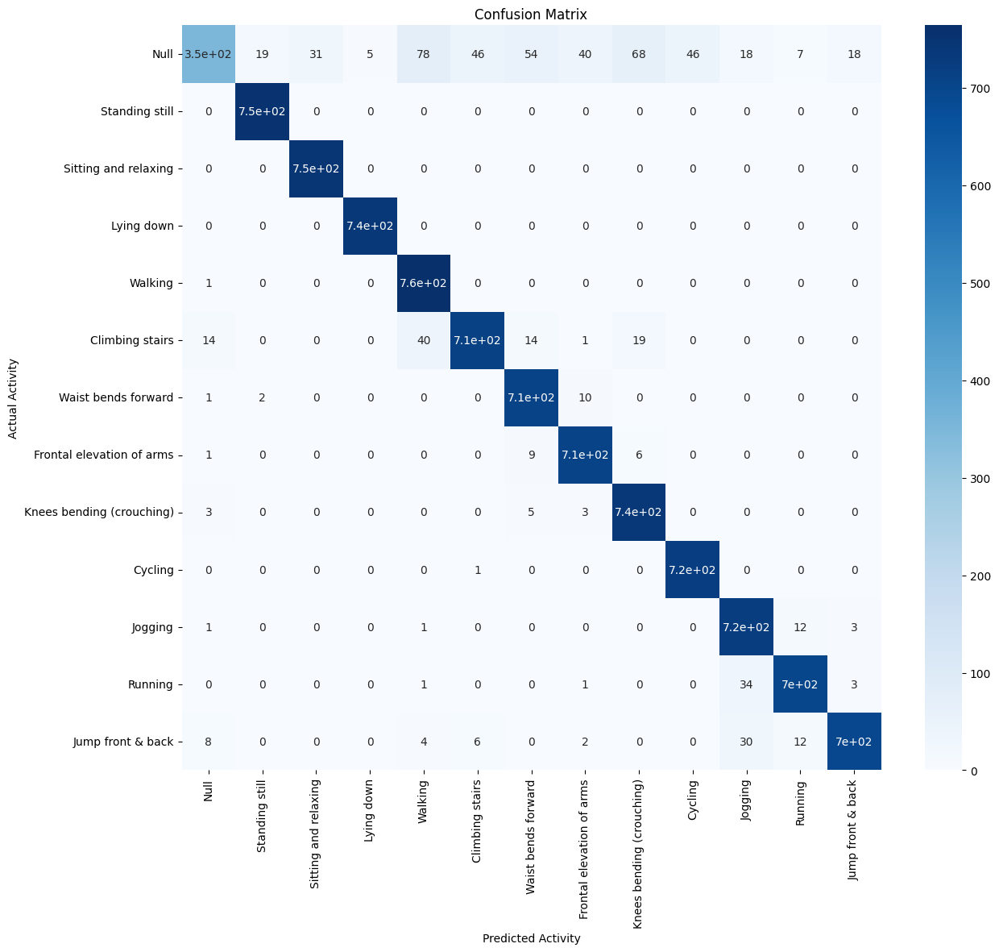

Accuracy Score: 93.0462%
Precision Score: 93.1879%
Recall Score: 93.2749%
F_1 Score: 92.4910%


In [44]:
results_summarizer(y_test, y_pred_knn)


In [45]:
# Get cross val score for knn with k = 5
knn = KNeighborsClassifier(n_neighbors=5)
cv_scores = cross_val_score(knn, X_scaled, y, cv=5)
# Print cross val scores along with average
print(cv_scores)
print(f'cv_scores mean:{np.mean(cv_scores)}')

[0.93397436 0.93051282 0.92858974 0.93179487 0.93730769]
cv_scores mean:0.9324358974358974


In [46]:
# Large discrepancy between single model and CV. Possible overfitting? Shuffle data for CV per source:
# https://datascience.stackexchange.com/questions/30702/why-is-cross-validation-score-so-low
X_scaled_shuffled, y_shuffled = shuffle(X_scaled, y)

knn = KNeighborsClassifier(n_neighbors=5)
cv_scores = cross_val_score(knn, X_scaled_shuffled, y_shuffled, cv=5)
# Print cross val scores along with average
print(cv_scores)
print(f'cv_scores mean:{np.mean(cv_scores)}')

[0.93564103 0.93410256 0.93320513 0.9324359  0.93230769]
cv_scores mean:0.9335384615384615


In [47]:
# KNN with k=3 (and shuffled data sets)
knn = KNeighborsClassifier(n_neighbors=3)
cv_scores = cross_val_score(knn, X_scaled_shuffled, y_shuffled, cv=5)
# Print cross val scores along with average
print(cv_scores)
print(f'cv_scores mean:{np.mean(cv_scores)}')

[0.94461538 0.94179487 0.94012821 0.94076923 0.94217949]
cv_scores mean:0.9418974358974358


#Models - SVM Classification

In [48]:
# Per Anguita et. al., Attempting SVM classifier to obtain better results than KNN
# Support Vector Classifier - linear kernal - tuning C parameter with CV
cost_choices = [0.025, 0.05, 0.1, 1, 5, 10]
for c in cost_choices:
    svc = SVC(kernel='linear', random_state=1, C=c)
    score = cross_val_score(svc, X_scaled, y, cv=5).mean()
    print(f'Cost value: {c}', f'Cross-validation score: {score}')

Cost value: 0.025 Cross-validation score: 0.7072820512820512
Cost value: 0.05 Cross-validation score: 0.7135384615384616
Cost value: 0.1 Cross-validation score: 0.718
Cost value: 1 Cross-validation score: 0.726102564102564
Cost value: 5 Cross-validation score: 0.7283589743589742
Cost value: 10 Cross-validation score: 0.728974358974359


In [49]:
# Support Vector Classifier - polynomial
svc = SVC(kernel='poly', random_state=1)
score = cross_val_score(svc, X_scaled, y, cv=5).mean()
print(f'Cross-validation score: {score}')

Cross-validation score: 0.8754871794871795


In [50]:
# Support Vector Classifier - radial
svc = SVC(kernel='rbf', random_state=1)
score = cross_val_score(svc, X_scaled, y, cv=5).mean()
print(f'Cross-validation score: {score}')

Cross-validation score: 0.9225128205128204


In [51]:
# Radial with different regularization params
cost_choices = [0.025, 0.05, 0.1, 1, 5, 10]
for c in cost_choices:
    svc = SVC(kernel='rbf', random_state=1, C=c)
    score = cross_val_score(svc, X_scaled, y, cv=5).mean()
    print(f'Cost value: {c}', f'Cross-validation score: {score}')

Cost value: 0.025 Cross-validation score: 0.7651282051282051
Cost value: 0.05 Cross-validation score: 0.8146153846153847
Cost value: 0.1 Cross-validation score: 0.8520769230769231
Cost value: 1 Cross-validation score: 0.9225128205128204
Cost value: 5 Cross-validation score: 0.9479743589743588
Cost value: 10 Cross-validation score: 0.9527435897435896


In [52]:
# Radial with different gamma choices
gamma_choices = [0.0005, 0.001, 0.01, 0.1, 1, 5]
for g in gamma_choices:
    svc = SVC(kernel='rbf', random_state=1, gamma=g, C=10)
    score = cross_val_score(svc, X_scaled, y, cv=5).mean()
    print(f'Gamma value: {g}', f'Cross-validation score: {score}')

Gamma value: 0.0005 Cross-validation score: 0.7377179487179487
Gamma value: 0.001 Cross-validation score: 0.7831538461538462
Gamma value: 0.01 Cross-validation score: 0.9077948717948718
Gamma value: 0.1 Cross-validation score: 0.9567179487179487
Gamma value: 1 Cross-validation score: 0.8253589743589744
Gamma value: 5 Cross-validation score: 0.6086666666666667


In [53]:
# Produce confusion matrix for hypertuned SVC
svc = SVC(kernel='rbf', random_state=1, gamma=0.1, C=10)
svc.fit(X_train_scaled, y_train)
y_pred_svc = svc.predict(X_test_scaled)

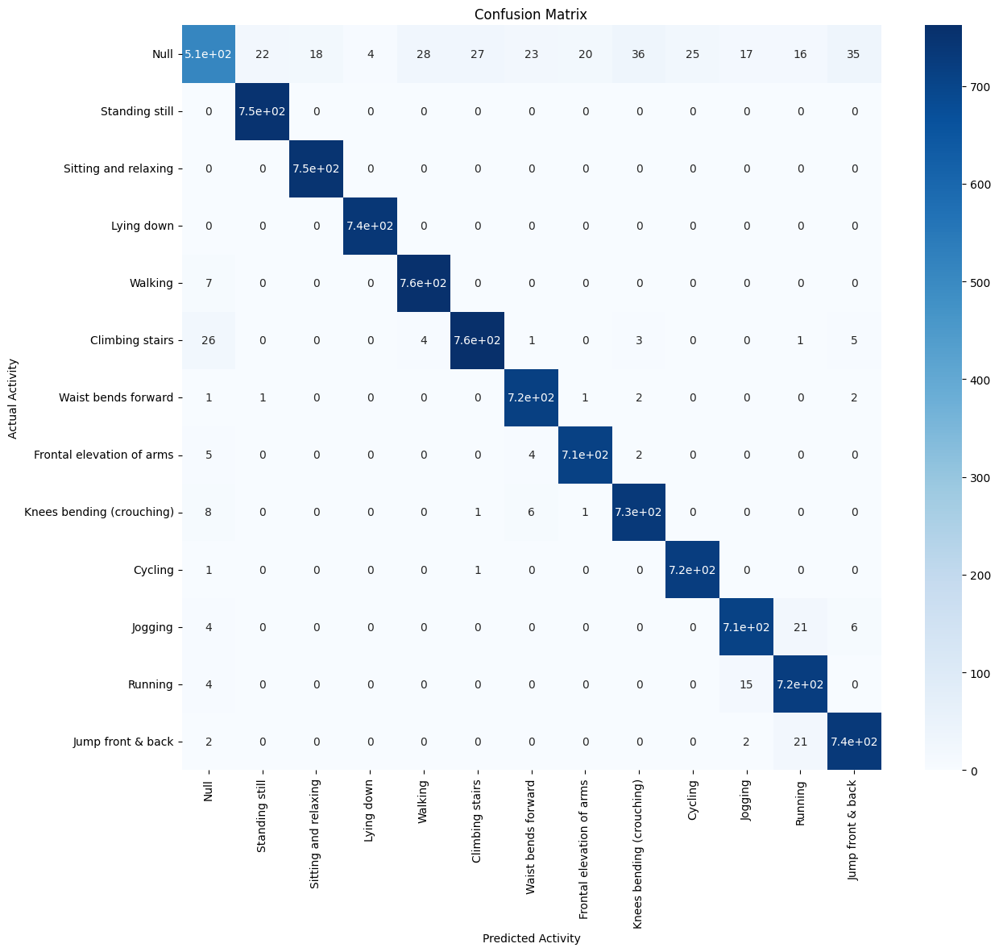

Accuracy Score: 95.6000%
Precision Score: 95.5046%
Recall Score: 95.7309%
F_1 Score: 95.4504%


In [54]:
results_summarizer(y_test, y_pred_svc)


#Models - Random Forest Classifier (Ensemble)

In [55]:
# Per Casale et. al., trying Random Forest Classifier
# Try default params Random Forest Classifier
rfst = RandomForestClassifier(random_state=1)
score = cross_val_score(rfst, X_scaled, y, cv=5).mean()
print(f'Cross-validation score: {score}')

Cross-validation score: 0.9584102564102566


In [56]:
# Hypertuning Random Forest using GridSearchCV takes too long. Looping over params:
# number of estimators
n_estimator_choices = [100, 200, 300]
for n in n_estimator_choices:
    rfst = RandomForestClassifier(random_state=1, n_estimators=n)
    score = cross_val_score(rfst, X_scaled, y, cv=5).mean()
    print(f'Number of estimators: {n}', f'Cross-validation score: {score}')

Number of estimators: 100 Cross-validation score: 0.9584102564102566
Number of estimators: 200 Cross-validation score: 0.959948717948718
Number of estimators: 300 Cross-validation score: 0.960153846153846


In [57]:
# Tune max depth
max_depth_choices = [10, 20, 30, 40]
for d in max_depth_choices:
    rfst = RandomForestClassifier(random_state=1, n_estimators=200, max_depth=d)
    score = cross_val_score(rfst, X_scaled, y, cv=5).mean()
    print(f'Max depth: {d}', f'Cross-validation score: {score}')

Max depth: 10 Cross-validation score: 0.8978205128205129
Max depth: 20 Cross-validation score: 0.9571794871794872
Max depth: 30 Cross-validation score: 0.9596666666666668
Max depth: 40 Cross-validation score: 0.9597948717948718


In [58]:

# Try with entropy criterion
rfst = RandomForestClassifier(random_state=1, n_estimators=200, criterion='entropy')
score = cross_val_score(rfst, X_scaled, y, cv=5).mean()
print(f'Cross-validation score: {score}')

Cross-validation score: 0.9585897435897437


In [59]:
# Tune minimum samples required to be at leaf node
min_samples_leaf_choices = [1, 2, 4]
for m in min_samples_leaf_choices:
    rfst = RandomForestClassifier(random_state=1, n_estimators=200, max_depth=None, min_samples_leaf=m)
    score = cross_val_score(rfst, X_scaled, y, cv=5).mean()
    print(f'Minimum samples required at leaf node: {m}', f'Cross-validation score: {score}')

Minimum samples required at leaf node: 1 Cross-validation score: 0.959948717948718
Minimum samples required at leaf node: 2 Cross-validation score: 0.9570512820512821
Minimum samples required at leaf node: 4 Cross-validation score: 0.9520512820512821


In [60]:
# Tune minimum samples required to split internal node
min_samples_split_choices = [2, 5, 10]
for m in min_samples_split_choices:
    rfst = RandomForestClassifier(random_state=1, n_estimators=200, max_depth=None, min_samples_leaf=1,
                                  min_samples_split=m)
    score = cross_val_score(rfst, X_scaled, y, cv=5).mean()
    print(f'Minimum samples required at leaf node: {m}', f'Cross-validation score: {score}')

Minimum samples required at leaf node: 2 Cross-validation score: 0.959948717948718


KeyboardInterrupt: 

In [ ]:

# Produce confusion matrix for hyptertuned Random Forest Classifier
rfst = RandomForestClassifier(random_state=1, n_estimators=200, max_depth=None, min_samples_leaf=1, min_samples_split=2)
rfst.fit(X_train_scaled, y_train)
y_pred_rfst = rfst.predict(X_test_scaled)

In [ ]:
results_summarizer(y_pred_rfst, y_test)


#CNN Model

In [61]:
# File upload to google colab
from google.colab import files
uploaded = files.upload()

In [62]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from numpy import array
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout
from keras.layers.convolutional import Conv1D, MaxPooling1D
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

ModuleNotFoundError: No module named 'keras.layers.convolutional'

In [ ]:
data = pd.read_csv('mhealth_full.csv')


In [ ]:
# Resample activity 0 (null class) to 30720 observations per EDA phase
data_activity_0 = data[data['activity'] == 0]
data_activity_else = data[data['activity'] != 0]

data_activity_0 = data_activity_0.sample(n=30720, random_state=1)
data = pd.concat([data_activity_0, data_activity_else])

In [ ]:
# Split data between predictors and output variable
X = data.drop(['activity', 'subject'], axis=1)
y = data['activity']

In [ ]:
X.columns


In [ ]:
y

In [ ]:

# Scale full set of predictors
X_scaled = StandardScaler().fit_transform(X)

In [ ]:

# Create train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=1)

In [ ]:
# Scale train/ test predictors based on training data
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Results summarizer function (scores, confusion matrix) for classification results
def results_summarizer(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro')
    rec = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')

    activity_map = {
        0: 'Null',
        1: 'Standing still',
        2: 'Sitting and relaxing',
        3: 'Lying down',
        4: 'Walking',
        5: 'Climbing stairs',
        6: 'Waist bends forward',
        7: 'Frontal elevation of arms',
        8: 'Knees bending (crouching)',
        9: 'Cycling',
        10: 'Jogging',
        11: 'Running',
        12: 'Jump front & back'
    }
    plt.figure(figsize=(14, 12))

    sns.heatmap(cm,
                annot=True,
                cmap='Blues',
                xticklabels=activity_map.values(),
                yticklabels=activity_map.values()
               )

    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Activity')
    plt.ylabel('Actual Activity')
    plt.show()

    print(f'Accuracy Score: ' + '{:.4%}'.format(acc))
    print(f'Precision Score: ' + '{:.4%}'.format(prec))
    print(f'Recall Score: ' + '{:.4%}'.format(rec))
    print(f'F_1 Score: ' + '{:.4%}'.format(f1))

In [ ]:
# Reformat the training data into sequence samples
# Source: https://machinelearningmastery.com/how-to-develop-convolutional-neural-network-models-for-time-series-forecasting/
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

In [ ]:
# Merge train and test X/y data to apply sequence transformation function
y_train_array = np.array(y_train)
train_set = np.c_[X_train_scaled, y_train_array]

y_test_array = np.array(y_test)
test_set = np.c_[X_test_scaled, y_test_array]

In [ ]:
# Apply sequence transformation using time step of 25 for both train and test data
X_train_seq, y_train_seq = split_sequences(train_set, 25)
print(X_train_seq.shape, y_train_seq.shape)

X_test_seq, y_test_seq = split_sequences(test_set, 25)
print(X_test_seq.shape, y_test_seq.shape)

In [ ]:
# Convert output variables to categorical for CNN
y_train_seq = to_categorical(y_train_seq)
print(y_train_seq.shape)
print(y_train_seq)

y_test_seq = to_categorical(y_test_seq)
print(y_test_seq.shape)
print(y_test_seq)

In [ ]:
# Produce variables for CNN input/output shape
n_timesteps, n_features, n_outputs = X_train_seq.shape[1], X_train_seq.shape[2], y_train_seq.shape[1]
print(n_timesteps, n_features, n_outputs)

In [ ]:
# Build CNN model using keras. For model building suggestions, referenced:
# https://machinelearningmastery.com/deep-learning-models-for-human-activity-recognition/
# https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/
# https://machinelearningmastery.com/how-to-develop-convolutional-neural-network-models-for-time-series-forecasting/

# Sequential model type
model = Sequential()
# 2 1D CNN layers for learning features from the time series samples
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(n_timesteps,n_features), padding='same'))
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', padding='same'))
# Dropout layer for easing learning process
model.add(Dropout(0.5))
# Pooling layer - reduces learned feature sizes to most essential elements
model.add(MaxPooling1D(pool_size=2))
# Flatten learned features to vector
model.add(Flatten())
# Fully connected dense layer - interpret features
model.add(Dense(128, activation='relu'))
# Output layer using softmax
model.add(Dense(n_outputs, activation='softmax'))
model.compile(optimizer='adam', metrics=['accuracy'], loss='categorical_crossentropy')

In [ ]:
# Fit model on training data with 10 epochs
model.fit(X_train_seq, y_train_seq, epochs=10)

In [ ]:
# Evaluate model against test data
_, accuracy = model.evaluate(X_test_seq, y_test_seq)
print(accuracy)

In [ ]:
# Make predictions on the test data
y_pred = model.predict(X_test_seq)
y_pred = np.argmax(y_pred, axis = 1)
y_pred = y_pred.reshape(-1,1)
y_pred.shape

In [ ]:
# Show results
# Note: Needed slice test data to 25 and onwards to match predictions due to time step in model
results_summarizer(y_test[24:], y_pred)

In [ ]:
# Transform full data set for use in cross-validation
# Merge X/y data to apply sequence transformation function
y_array = np.array(y)
full_set = np.c_[X_scaled, y_array]
# Apply sequence transformation using time step of 25 for both train and test data
X_seq, y_seq = split_sequences(full_set, 25)
print(X_train_seq.shape, y_train_seq.shape)

In [ ]:
# Perform cross validation
scores = []

# Create k fold cross validator
kfold = KFold(n_splits=5, shuffle=True)

# K-fold Cross Validation model evaluation
for train, test in kfold.split(X_seq, y_seq):
  # Convert output variables to categorical for model
  y_train_seq_cv = to_categorical(y_seq[train])
  y_test_seq_cv = to_categorical(y_seq[test])

  model = Sequential()
  model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(n_timesteps,n_features), padding='same'))
  model.add(Conv1D(filters=64, kernel_size=3, activation='relu', padding='same'))
  model.add(Dropout(0.5))
  model.add(MaxPooling1D(pool_size=2))
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(n_outputs, activation='softmax'))
  model.compile(optimizer='adam', metrics=['accuracy'], loss='categorical_crossentropy')
  model.fit(X_seq[train], y_train_seq_cv, epochs=10)
  _, accuracy = model.evaluate(X_seq[test], y_test_seq_cv)
  scores.append(accuracy)

In [ ]:
print(scores)
print(sum(scores) / len(scores))

In [ ]:
# Create train and test sets
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_seq, y_seq, test_size=0.25, random_state=1)
y_train_new = to_categorical(y_train_new)

In [ ]:
model = Sequential()
  model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(n_timesteps,n_features), padding='same'))
  model.add(Conv1D(filters=64, kernel_size=3, activation='relu', padding='same'))
  model.add(Dropout(0.5))
  model.add(MaxPooling1D(pool_size=2))
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(n_outputs, activation='softmax'))
  model.compile(optimizer='adam', metrics=['accuracy'], loss='categorical_crossentropy')
  model.fit(X_train_new, y_train_new, epochs=10)

In [ ]:
# Get summary of model
model.summary()

In [ ]:

# Make predictions and summarize results
y_pred = model.predict(X_test_new)
y_pred = np.argmax(y_pred, axis = 1)
y_pred = y_pred.reshape(-1,1)

In [ ]:
results_summarizer(y_test_new, y_pred)